# **Task 1: Data Preprocessing**


In [ ]:
# Import necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, TensorDataset
from sklearn.datasets import make_circles
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score

import time

In [ ]:
# Mount drive folder into Colab filesystem
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#IMPORTANT works only with absolute paths
df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/data/dataset_lab_1.csv')
new_df = df.copy()
df

,Flow Duration,Flow IAT Mean,Fwd PSH Flags,Bwd Packet Length Mean,Bwd Packet Length Max,Flow Bytes/s,Down/Up Ratio,SYN Flag Count,Fwd Packet Length Mean,Fwd IAT Std,Packet Length Mean,Fwd Packet Length Max,Subflow Fwd Packets,Flow Packets/s,Total Fwd Packets,Destination Port,Label
0,303376,3.033760e+04,0,749.4,1448,12743.263,0,0,19.833334,98776.15,322.16666,119,6,36.258636,6,443,Benign
1,117,1.170000e+02,0,0.0,0,0.000,1,0,0.000000,0.00,0.00000,0,1,17094.018000,1,52631,Benign
2,142,1.420000e+02,0,0.0,0,84507.040,0,0,6.000000,0.00,6.00000,6,2,14084.507000,2,80,Benign
3,191,6.366667e+01,0,52.0,52,921465.940,1,0,36.000000,0.00,42.40000,36,2,20942.408000,2,53,Benign
4,4,4.000000e+00,0,0.0,0,3000000.000,0,0,6.000000,0.00,6.00000,6,2,500000.000000,2,49467,Benign
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31502,5710955,1.903652e+06,0,0.0,0,0.000,0,0,0.000000,4037277.80,0.00000,0,3,0.700408,3,80,Brute Force
31503,5862561,1.954187e+06,0,0.0,0,0.000,0,0,0.000000,4144374.80,0.00000,0,3,0.682296,3,80,Brute Force
31504,5854872,1.951624e+06,0,0.0,0,0.000,0,0,0.000000,4139029.80,0.00000,0,3,0.683192,3,80,Brute Force
31505,5555547,1.851849e+06,0,0.0,0,0.000,0,0,0.000000,3927356.50,0.00000,0,3,0.720001,3,80,Brute Force


In [ ]:
df.describe()

,Flow Duration,Flow IAT Mean,Fwd PSH Flags,Bwd Packet Length Mean,Bwd Packet Length Max,Flow Bytes/s,Down/Up Ratio,SYN Flag Count,Fwd Packet Length Mean,Fwd IAT Std,Packet Length Mean,Fwd Packet Length Max,Subflow Fwd Packets,Flow Packets/s,Total Fwd Packets,Destination Port
count,3.150700e+04,3.150700e+04,31507.000000,31507.000000,31507.000000,3.148700e+04,31507.000000,31507.000000,31507.000000,3.150700e+04,31507.000000,31507.000000,31507.000000,3.150700e+04,31507.000000,31507.000000
mean,1.647581e+07,1.438258e+06,0.038277,310.232250,896.532040,inf,0.639382,0.038277,44.150959,4.653801e+06,163.155706,170.496652,6.181293,inf,6.181293,7367.544292
std,3.526316e+07,4.122202e+06,0.191868,605.892466,1945.454241,NaN,0.531334,0.191868,115.215481,1.185644e+07,290.189858,501.331438,109.450416,NaN,109.450416,17104.518207
min,-1.000000e+00,-1.000000e+00,0.000000,0.000000,0.000000,-1.200000e+07,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,1.000000,-2.000000e+06,1.000000,0.000000
25%,6.500000e+01,5.500000e+01,0.000000,5.500000,6.000000,1.199456e+02,0.000000,0.000000,2.000000,0.000000e+00,3.333333,2.000000,1.000000,2.032897e+00,1.000000,53.000000
50%,2.427100e+04,8.096333e+03,0.000000,51.000000,56.000000,4.830598e+03,1.000000,0.000000,32.000000,0.000000e+00,47.800000,35.000000,2.000000,1.581044e+02,2.000000,80.000000
75%,5.216842e+06,5.558727e+05,0.000000,176.000000,271.000000,1.538462e+05,1.000000,0.000000,50.000000,7.627202e+05,112.000000,198.000000,5.000000,3.174603e+04,5.000000,1066.000000
max,1.199985e+08,1.140000e+08,1.000000,3865.000000,11595.000000,inf,10.000000,1.000000,3431.806400,8.280000e+07,1903.272700,23360.000000,18605.000000,inf,18605.000000,65533.000000


In [ ]:
print(df.shape)
# Remove duplicates
df = df.drop_duplicates()
print(df.shape)
# Remove rows with missing values
df = df.dropna()
print(df.shape)
# remove rows with inf
df = df[~df.isin([np.inf, -np.inf]).any(axis=1)]
print(df.shape)

(31507, 17)
(29396, 17)
(29393, 17)
(29386, 17)


In [ ]:
 df.describe()

,Flow Duration,Flow IAT Mean,Fwd PSH Flags,Bwd Packet Length Mean,Bwd Packet Length Max,Flow Bytes/s,Down/Up Ratio,SYN Flag Count,Fwd Packet Length Mean,Fwd IAT Std,Packet Length Mean,Fwd Packet Length Max,Subflow Fwd Packets,Flow Packets/s,Total Fwd Packets,Destination Port
count,2.938600e+04,2.938600e+04,29386.000000,29386.000000,29386.000000,2.938600e+04,29386.000000,29386.000000,29386.000000,2.938600e+04,29386.000000,29386.000000,29386.000000,2.938600e+04,29386.000000,29386.000000
mean,1.766497e+07,1.542059e+06,0.039372,331.761468,960.378752,1.440137e+06,0.665521,0.039372,46.788888,4.989700e+06,174.196328,182.228204,6.487375,4.883930e+04,6.487375,7834.468454
std,3.622483e+07,4.249589e+06,0.194483,621.806613,1999.336617,2.553663e+07,0.527011,0.194483,118.804856,1.220843e+07,297.400545,517.120979,113.325266,1.949747e+05,113.325266,17570.251858
min,-1.000000e+00,-1.000000e+00,0.000000,0.000000,0.000000,-1.200000e+07,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,1.000000,-2.000000e+06,1.000000,0.000000
25%,8.400000e+01,6.133333e+01,0.000000,6.000000,6.000000,1.212884e+02,0.000000,0.000000,2.000000,0.000000e+00,3.333333,2.000000,1.000000,1.278269e+00,1.000000,53.000000
50%,3.111650e+04,1.113090e+04,0.000000,63.000000,69.000000,5.129580e+03,1.000000,0.000000,34.000000,0.000000e+00,52.333332,37.000000,2.000000,1.146405e+02,2.000000,80.000000
75%,5.489763e+06,9.056584e+05,0.000000,202.482143,426.750000,1.481481e+05,1.000000,0.000000,51.000000,1.959326e+06,128.284720,265.000000,5.000000,2.666667e+04,5.000000,1216.000000
max,1.199985e+08,1.140000e+08,1.000000,3865.000000,11595.000000,2.070000e+09,10.000000,1.000000,3431.806400,8.280000e+07,1903.272700,23360.000000,18605.000000,3.000000e+06,18605.000000,65533.000000


Label
Benign         19242
PortScan        4849
DoS Hulk        3868
Brute Force     1427
Name: count, dtype: int64


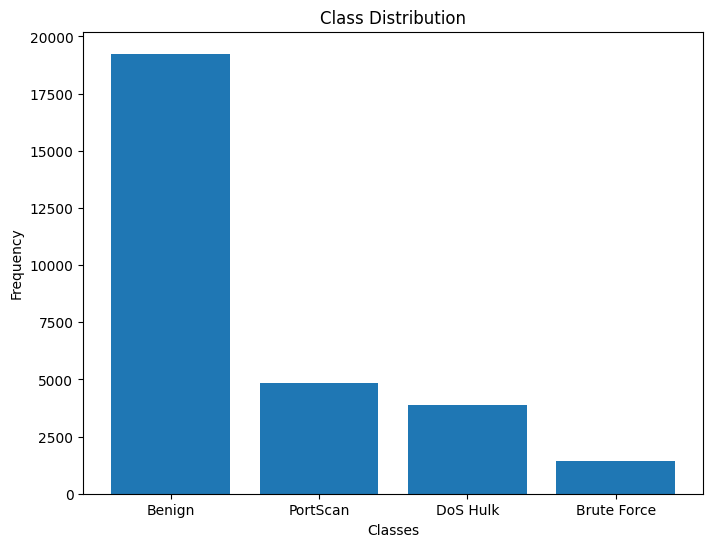

,Flow Duration,Flow IAT Mean,Fwd PSH Flags,Bwd Packet Length Mean,Bwd Packet Length Max,Flow Bytes/s,Down/Up Ratio,SYN Flag Count,Fwd Packet Length Mean,Fwd IAT Std,Packet Length Mean,Fwd Packet Length Max,Subflow Fwd Packets,Flow Packets/s,Total Fwd Packets,Destination Port
count,2.938600e+04,2.938600e+04,29386.000000,29386.000000,29386.000000,2.938600e+04,29386.000000,29386.000000,29386.000000,2.938600e+04,29386.000000,29386.000000,29386.000000,2.938600e+04,29386.000000,29386.000000
mean,1.766497e+07,1.542059e+06,0.039372,331.761468,960.378752,1.440137e+06,0.665521,0.039372,46.788888,4.989700e+06,174.196328,182.228204,6.487375,4.883930e+04,6.487375,7834.468454
std,3.622483e+07,4.249589e+06,0.194483,621.806613,1999.336617,2.553663e+07,0.527011,0.194483,118.804856,1.220843e+07,297.400545,517.120979,113.325266,1.949747e+05,113.325266,17570.251858
min,-1.000000e+00,-1.000000e+00,0.000000,0.000000,0.000000,-1.200000e+07,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,1.000000,-2.000000e+06,1.000000,0.000000
25%,8.400000e+01,6.133333e+01,0.000000,6.000000,6.000000,1.212884e+02,0.000000,0.000000,2.000000,0.000000e+00,3.333333,2.000000,1.000000,1.278269e+00,1.000000,53.000000
50%,3.111650e+04,1.113090e+04,0.000000,63.000000,69.000000,5.129580e+03,1.000000,0.000000,34.000000,0.000000e+00,52.333332,37.000000,2.000000,1.146405e+02,2.000000,80.000000
75%,5.489763e+06,9.056584e+05,0.000000,202.482143,426.750000,1.481481e+05,1.000000,0.000000,51.000000,1.959326e+06,128.284720,265.000000,5.000000,2.666667e+04,5.000000,1216.000000
max,1.199985e+08,1.140000e+08,1.000000,3865.000000,11595.000000,2.070000e+09,10.000000,1.000000,3431.806400,8.280000e+07,1903.272700,23360.000000,18605.000000,3.000000e+06,18605.000000,65533.000000


In [ ]:
#Check for class imbalance
class_frequencies = df['Label'].value_counts()
print(class_frequencies)

plt.figure(figsize=(8, 6))
plt.bar(class_frequencies.index, class_frequencies.values)
plt.title('Class Distribution')
plt.xlabel('Classes')
plt.ylabel('Frequency')
plt.show()

df.describe()

In [ ]:
unique_labels = np.unique(df['Label'])
print(unique_labels)
# Encode labels
label_encoder = LabelEncoder()
df['Label'] = label_encoder.fit_transform(df['Label'])

# Get the mapping of original labels to encoded labels
label_mapping = dict(zip(label_encoder.classes_, label_encoder.transform(label_encoder.classes_)))

# Print the mapping
for original_label, encoded_label in label_mapping.items():
    print(f"Original Label: {original_label}, Encoded Label: {encoded_label}")

df.head()

['Benign' 'Brute Force' 'DoS Hulk' 'PortScan']
Original Label: Benign, Encoded Label: 0
Original Label: Brute Force, Encoded Label: 1
Original Label: DoS Hulk, Encoded Label: 2
Original Label: PortScan, Encoded Label: 3


,Flow Duration,Flow IAT Mean,Fwd PSH Flags,Bwd Packet Length Mean,Bwd Packet Length Max,Flow Bytes/s,Down/Up Ratio,SYN Flag Count,Fwd Packet Length Mean,Fwd IAT Std,Packet Length Mean,Fwd Packet Length Max,Subflow Fwd Packets,Flow Packets/s,Total Fwd Packets,Destination Port,Label
0,303376,30337.600000,0,749.4,1448,12743.263,0,0,19.833334,98776.15,322.16666,119,6,36.258636,6,443,0
1,117,117.000000,0,0.0,0,0.000,1,0,0.000000,0.00,0.00000,0,1,17094.018000,1,52631,0
2,142,142.000000,0,0.0,0,84507.040,0,0,6.000000,0.00,6.00000,6,2,14084.507000,2,80,0
3,191,63.666668,0,52.0,52,921465.940,1,0,36.000000,0.00,42.40000,36,2,20942.408000,2,53,0
4,4,4.000000,0,0.0,0,3000000.000,0,0,6.000000,0.00,6.00000,6,2,500000.000000,2,49467,0


In [ ]:
# Split the dataset
X = df.drop('Label', axis=1)
y = df['Label'].values

#default stratify
X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=42)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=42)

#               ******* REPLACEMENT PORT PART**********

X_test_future = X_test.copy()
y_test_future = y_test.copy()

# Check if change went well
print("Before modification:")
print(X_test_future[X_test_future["Destination Port"] == 80].shape)
print(X_test_future[X_test_future["Destination Port"] == 8080].shape)

# Modify the test set: Change Port 80 -> 8080 for Brute Force attacks
# NB: Label "Brute force" is associated to 1! substituted w/ dynamic mapping
brute_force_indices = (y_test_future == label_mapping['Brute Force']) & (X_test_future["Destination Port"] == 80)
X_test_future.loc[brute_force_indices, "Destination Port"] = 8080

print("After modification:")
print(X_test_future[X_test_future["Destination Port"] == 80].shape)
print(X_test_future[X_test_future["Destination Port"] == 8080].shape)


Before modification:
(1478, 16)
(2, 16)
After modification:
(1203, 16)
(277, 16)


In [ ]:
df

,Flow Duration,Flow IAT Mean,Fwd PSH Flags,Bwd Packet Length Mean,Bwd Packet Length Max,Flow Bytes/s,Down/Up Ratio,SYN Flag Count,Fwd Packet Length Mean,Fwd IAT Std,Packet Length Mean,Fwd Packet Length Max,Subflow Fwd Packets,Flow Packets/s,Total Fwd Packets,Destination Port,Label
0,303376,3.033760e+04,0,749.4,1448,12743.263,0,0,19.833334,98776.15,322.16666,119,6,36.258636,6,443,0
1,117,1.170000e+02,0,0.0,0,0.000,1,0,0.000000,0.00,0.00000,0,1,17094.018000,1,52631,0
2,142,1.420000e+02,0,0.0,0,84507.040,0,0,6.000000,0.00,6.00000,6,2,14084.507000,2,80,0
3,191,6.366667e+01,0,52.0,52,921465.940,1,0,36.000000,0.00,42.40000,36,2,20942.408000,2,53,0
4,4,4.000000e+00,0,0.0,0,3000000.000,0,0,6.000000,0.00,6.00000,6,2,500000.000000,2,49467,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31502,5710955,1.903652e+06,0,0.0,0,0.000,0,0,0.000000,4037277.80,0.00000,0,3,0.700408,3,80,1
31503,5862561,1.954187e+06,0,0.0,0,0.000,0,0,0.000000,4144374.80,0.00000,0,3,0.682296,3,80,1
31504,5854872,1.951624e+06,0,0.0,0,0.000,0,0,0.000000,4139029.80,0.00000,0,3,0.683192,3,80,1
31505,5555547,1.851849e+06,0,0.0,0,0.000,0,0,0.000000,3927356.50,0.00000,0,3,0.720001,3,80,1


In [ ]:
X_train.describe()

,Flow Duration,Flow IAT Mean,Fwd PSH Flags,Bwd Packet Length Mean,Bwd Packet Length Max,Flow Bytes/s,Down/Up Ratio,SYN Flag Count,Fwd Packet Length Mean,Fwd IAT Std,Packet Length Mean,Fwd Packet Length Max,Subflow Fwd Packets,Flow Packets/s,Total Fwd Packets,Destination Port
count,1.763100e+04,1.763100e+04,17631.000000,17631.000000,17631.000000,1.763100e+04,17631.000000,17631.000000,17631.000000,1.763100e+04,17631.000000,17631.000000,17631.000000,1.763100e+04,17631.000000,17631.000000
mean,1.761041e+07,1.539809e+06,0.039079,327.796696,948.627758,1.155893e+06,0.665759,0.039079,47.418032,4.935995e+06,172.768614,184.258692,6.791674,4.845513e+04,6.791674,7793.989677
std,3.616016e+07,4.220290e+06,0.193788,618.289272,1988.594839,1.870955e+07,0.525327,0.193788,124.756126,1.214170e+07,296.561790,544.983752,141.760906,1.914530e+05,141.760906,17494.211035
min,-1.000000e+00,-1.000000e+00,0.000000,0.000000,0.000000,-1.200000e+07,0.000000,0.000000,0.000000,0.000000e+00,0.000000,0.000000,1.000000,-2.000000e+06,1.000000,0.000000
25%,8.150000e+01,6.100000e+01,0.000000,6.000000,6.000000,1.211933e+02,0.000000,0.000000,2.000000,0.000000e+00,3.333333,2.000000,1.000000,1.276319e+00,1.000000,53.000000
50%,3.116400e+04,1.134850e+04,0.000000,61.000000,68.000000,4.959466e+03,1.000000,0.000000,34.000000,0.000000e+00,51.800000,37.000000,2.000000,1.115480e+02,2.000000,80.000000
75%,5.508626e+06,9.155924e+05,0.000000,198.000000,384.000000,1.454545e+05,1.000000,0.000000,51.000000,1.961929e+06,126.400000,242.000000,5.000000,2.702703e+04,5.000000,1218.000000
max,1.199985e+08,6.410000e+07,1.000000,3865.000000,11595.000000,1.040000e+09,5.000000,1.000000,3431.806400,8.280000e+07,1903.272700,23360.000000,18605.000000,3.000000e+06,18605.000000,65533.000000


In [ ]:
# Standardize the features
scaler = StandardScaler() #The features have gaussian distribution
X_train = scaler.fit_transform(X_train) #scaler fitted on training set only
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)
X_test_future = scaler.transform(X_test_future)  # Standardize the copied test set as well

# **Task 2: Shallow Neural Network**

In [ ]:
# Convert data to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.long)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)
X_test_future_tensor = torch.tensor(X_test_future, dtype=torch.float32)
y_test_future_tensor = torch.tensor(y_test_future, dtype=torch.long)

In [ ]:
# Create DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)
test_future_dataset = TensorDataset(X_test_future_tensor, y_test_future_tensor)


train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)
test_future_loader = DataLoader(test_future_dataset, batch_size=64, shuffle=False)

In [ ]:
#Define the device to use for training and validation
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [ ]:
import torch.nn as nn

class SimpleLinearModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(SimpleLinearModel, self).__init__()
        self.linear1 = nn.Linear(input_size, hidden_size)  # Primo layer
        self.linear2 = nn.Linear(hidden_size, output_size) # Secondo layer

    def forward(self, x):
        x = self.linear1(x)  # Passa l'input al primo layer
        x = self.linear2(x)  # Passa l'output del primo layer al secondo
        return x

In [ ]:
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay, precision_score, f1_score, recall_score
from sklearn.preprocessing import StandardScaler
from scipy.io.arff import loadarff
import matplotlib.pyplot as plt
import seaborn as sns

# Function to visualize model performance by creating a confusion matrix
def plot_confusion_matrix(y_true, y_pred, class_names):

    cm = confusion_matrix(y_true, y_pred)  # Compute confusion matrix

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)

    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.show()


def training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion):
    """
    Train the model for a specified number of epochs and track the training and validation losses.
    """
    start_time = time.time()
    train_losses = []
    val_losses = []

    for epoch in range(num_epochs):
        model.train()  # Set model to training mode
        train_loss = 0

        for batch_X, batch_y in train_loader:
            batch_X, batch_y = batch_X.to(device), batch_y.to(device)
            optimizer.zero_grad()
            outputs = model(batch_X)  # Forward pass
            loss = criterion(outputs, batch_y)
            loss.backward()
            optimizer.step()
            train_loss += loss.item() * batch_X.size(0)

        train_loss /= len(train_dataset)
        train_losses.append(train_loss)

        # Validation
        model.eval()  # Set model to evaluation mode
        val_loss = 0
        with torch.no_grad():  # Disable gradient computation for validation
            for batch_X, batch_y in val_loader:
                batch_X, batch_y = batch_X.to(device), batch_y.to(device)
                outputs = model(batch_X)
                loss = criterion(outputs, batch_y)
                val_loss += loss.item() * batch_X.size(0)

        val_loss /= len(val_dataset)
        val_losses.append(val_loss)

        if (epoch + 1) % 20 == 0:  # Print every 20 epochs
            print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {train_losses[-1]:.4f}, Val Loss: {val_losses[-1]:.4f}')

    end_time = time.time()
    elapsed_time = end_time - start_time
    print(f'Training took {elapsed_time:.4f} seconds to execute.')

    # Plot losses
    plt.figure(figsize=(10, 5))
    plt.plot(train_losses, label='Train Loss')
    plt.plot(val_losses, label='Validation Loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.show()

    return

def testing_model(model, dataloader, device):

    # Record the start time
    start_time = time.time()

    model.eval()  # Set the model to evaluation mode
    all_labels = []
    all_predictions = []

    with torch.no_grad():  # Disable gradient computation for efficiency
        for inputs, labels in dataloader:
            inputs, labels = inputs.to(device), labels.to(device)  # Move batch to GPU
            outputs = model(inputs)
            _, predicted = torch.max(outputs, 1)  # Get the class with highest score
            all_labels.extend(labels.cpu().numpy())
            all_predictions.extend(predicted.cpu().numpy())

    class_names = ["Benign", "Brute Force", "DoS Hulk", "PortScan"]
    # Plot the confusion matrix
    plot_confusion_matrix(all_labels, all_predictions, class_names)

    accuracy = accuracy_score(all_labels, all_predictions) * 100
    precision = precision_score(all_labels, all_predictions,average='macro', zero_division=0) * 100
    f1 = f1_score(all_labels, all_predictions,average='macro', zero_division=0) * 100
    recall = recall_score(all_labels, all_predictions,average='macro', zero_division=0) * 100
    print(f'F1-score: {f1:.4f}')
    print(f'Recall: {recall:.4f}')
    # Record the end time
    end_time = time.time()
    # Calculate the elapsed time
    elapsed_time = end_time - start_time
    #print(f'The function took {elapsed_time:.4f} seconds to execute.')

    return accuracy,precision,f1

From now on we will try three different models, each with different hidden_size (neurons per layer)

In [ ]:
criterion = nn.CrossEntropyLoss()
# Define training parameters
num_epochs = 100

Epoch 20/100, Train Loss: 0.3511, Val Loss: 0.3240
Epoch 40/100, Train Loss: 0.3331, Val Loss: 0.3075
Epoch 60/100, Train Loss: 0.3250, Val Loss: 0.3006
Epoch 80/100, Train Loss: 0.3197, Val Loss: 0.2983
Epoch 100/100, Train Loss: 0.3153, Val Loss: 0.2930
Training took 52.9871 seconds to execute.


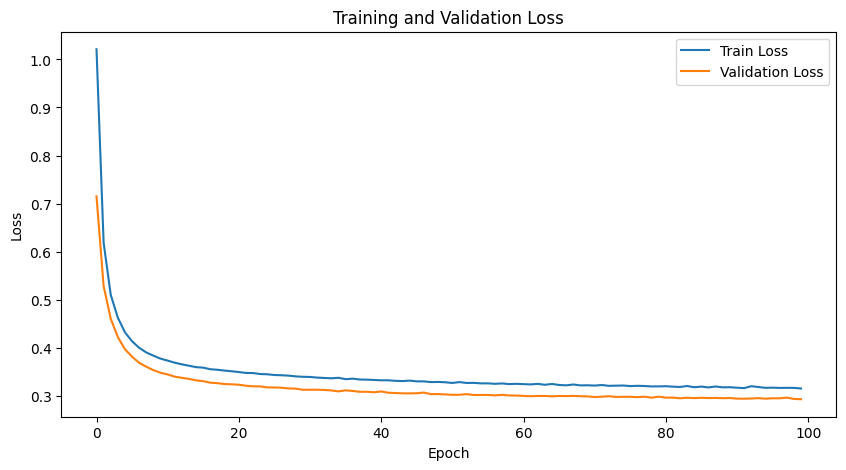

In [ ]:
#32 Neurons
import torch.optim as optim
linearModel = SimpleLinearModel(input_size=16, hidden_size=32, output_size=4).to(device)
optimizer = optim.AdamW(linearModel.parameters(), lr=0.0005)
training_loop(linearModel, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)

Train --------------------------------------


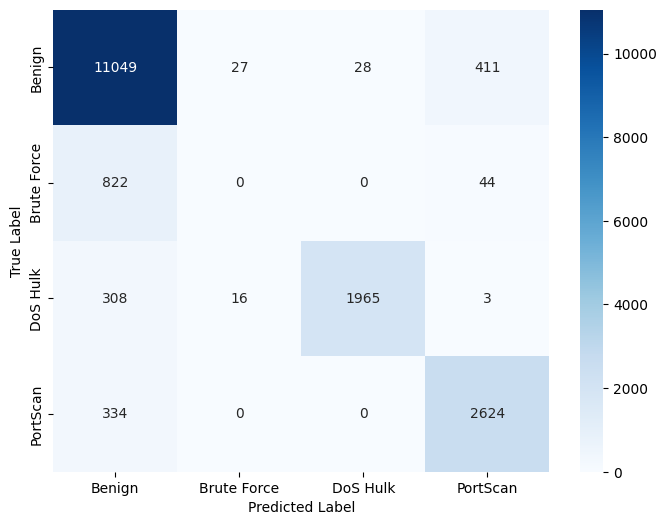

F1-score: 67.6426
Recall: 67.5987
Train Accuracy: 88.6960
Train Precision: 68.0087
Validation --------------------------------------


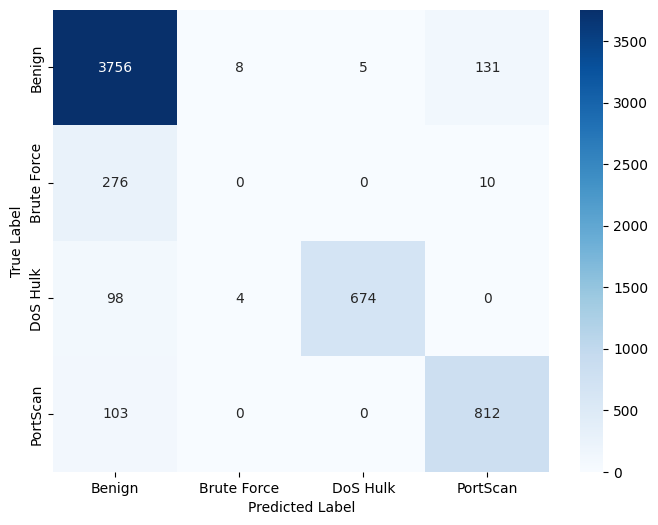

F1-score: 67.9871
Recall: 67.9766
Validation Accuracy: 89.1952
Validation Precision: 68.2999
Test --------------------------------------


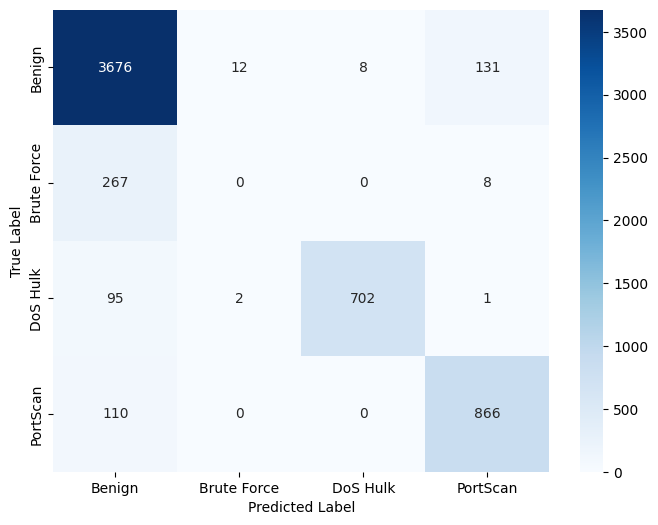

F1-score: 68.1387
Recall: 68.1335
Test Accuracy: 89.2140
Test Precision: 68.3944


In [ ]:
model=linearModel
print("Train --------------------------------------")
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
print("Validation --------------------------------------")
val_accuracy, val_prec, _ = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
print("Test --------------------------------------")
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')

Epoch 20/100, Train Loss: 0.3448, Val Loss: 0.3176
Epoch 40/100, Train Loss: 0.3295, Val Loss: 0.3035
Epoch 60/100, Train Loss: 0.3219, Val Loss: 0.2975
Epoch 80/100, Train Loss: 0.3186, Val Loss: 0.2946
Epoch 100/100, Train Loss: 0.3128, Val Loss: 0.2902
Training took 55.4442 seconds to execute.


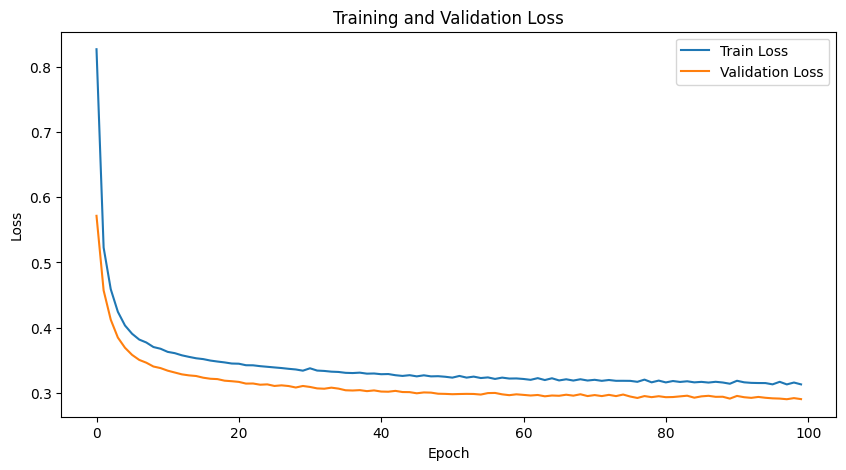

Train --------------------------------------


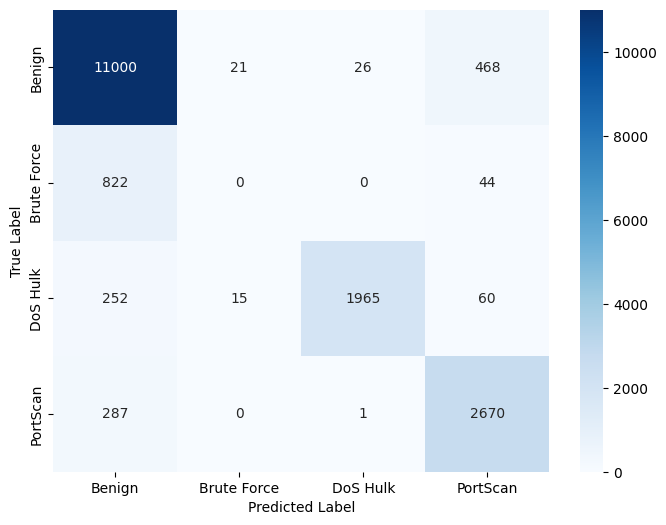

F1-score: 67.5021
Recall: 67.8811
Train Accuracy: 88.6790
Train Precision: 67.4977
Validation --------------------------------------


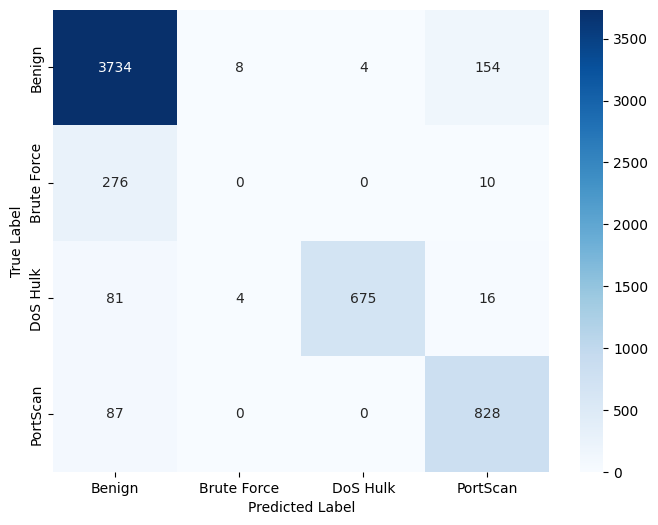

F1-score: 67.8369
Recall: 68.3050
Validation Accuracy: 89.1101
Validation Precision: 67.7317
Test --------------------------------------


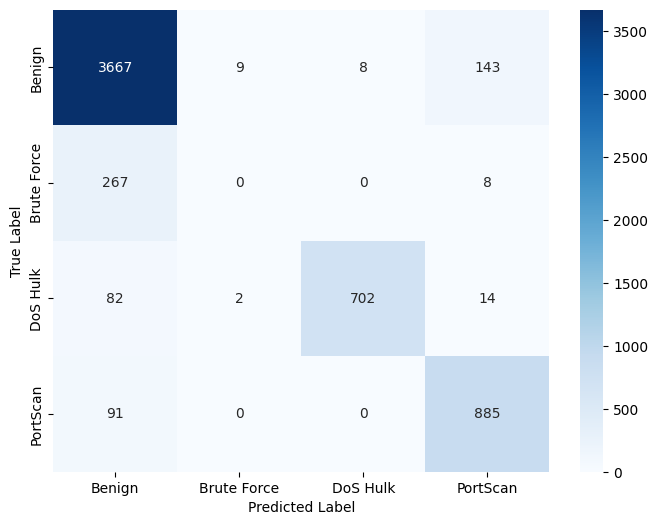

F1-score: 68.1955
Recall: 68.5614
Test Accuracy: 89.3841
Test Precision: 68.1114


In [ ]:
#64 Neurons

criterion = nn.CrossEntropyLoss()
# Define training parameters
num_epochs = 100

linearModel = SimpleLinearModel(input_size=16, hidden_size=64, output_size=4).to(device)
optimizer = optim.AdamW(linearModel.parameters(), lr=0.0005)
training_loop(linearModel, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)

model=linearModel
print("Train --------------------------------------")
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
print("Validation --------------------------------------")
val_accuracy, val_prec, _ = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
print("Test --------------------------------------")
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')

Epoch 20/100, Train Loss: 0.3391, Val Loss: 0.3094
Epoch 40/100, Train Loss: 0.3251, Val Loss: 0.2984
Epoch 60/100, Train Loss: 0.3169, Val Loss: 0.2944
Epoch 80/100, Train Loss: 0.3133, Val Loss: 0.2957
Epoch 100/100, Train Loss: 0.3138, Val Loss: 0.2898
Training took 54.7817 seconds to execute.


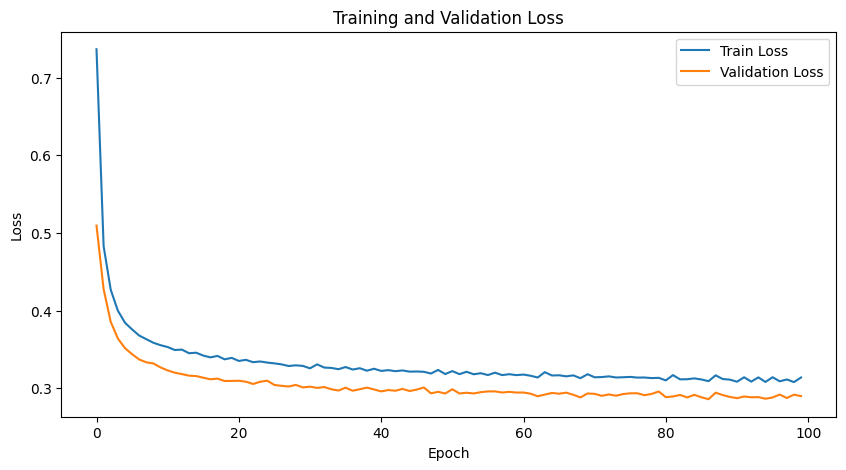

Train --------------------------------------


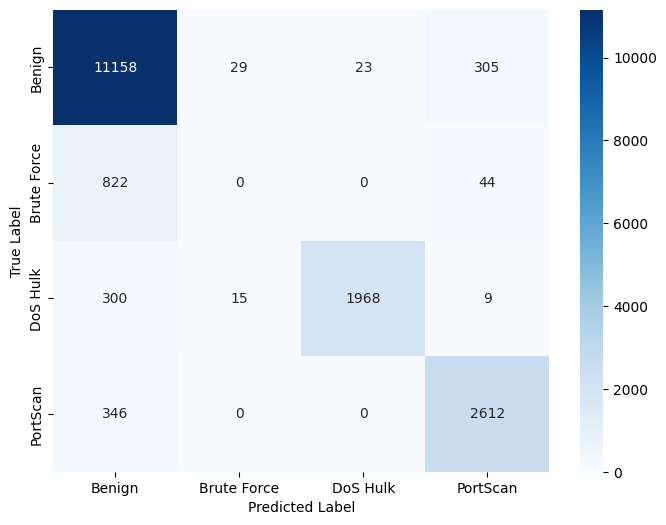

F1-score: 68.1157
Recall: 67.7666
Train Accuracy: 89.2632
Train Precision: 68.7910
Validation --------------------------------------


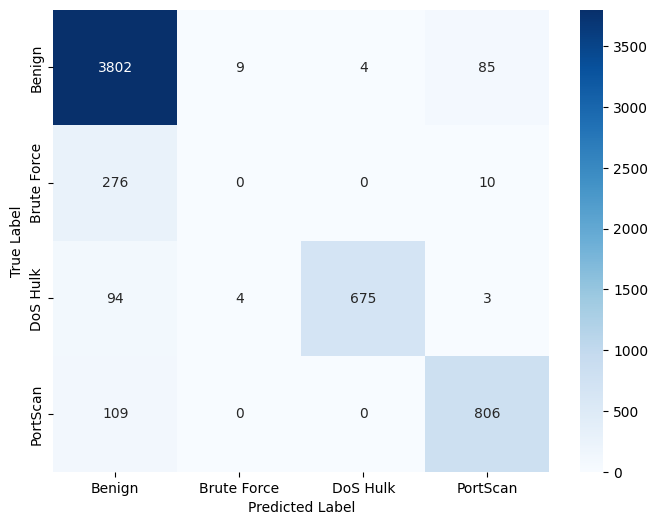

F1-score: 68.5877
Recall: 68.1398
Validation Accuracy: 89.8928
Validation Precision: 69.3453
Test --------------------------------------


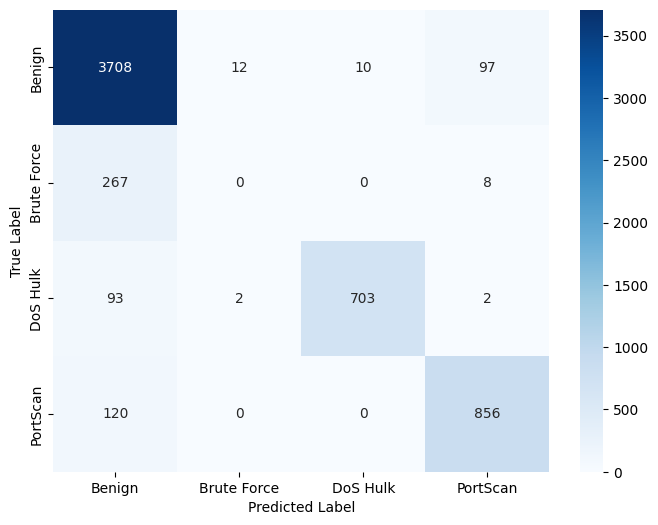

F1-score: 68.4369
Recall: 68.1176
Test Accuracy: 89.6053
Test Precision: 69.0063


In [ ]:
#128 Neurons

criterion = nn.CrossEntropyLoss()
# Define training parameters
num_epochs = 100

linearModel = SimpleLinearModel(input_size=16, hidden_size=128, output_size=4).to(device)
optimizer = optim.AdamW(linearModel.parameters(), lr=0.0005)
training_loop(linearModel, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)

model=linearModel
print("Train --------------------------------------")
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
print("Validation --------------------------------------")
val_accuracy, val_prec, _ = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
print("Test --------------------------------------")
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')

*Change the model with the best performance (optimal number of neurons) by changing the
activation function in ReLU and evaluate the effects.*

In [ ]:
class SimpleReluModel(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(SimpleReluModel, self).__init__()
        self.linear1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.linear2 = nn.Linear(hidden_size, output_size)

    def forward(self, x):
        x = self.linear1(x)
        x = self.relu(x)      # ReLU activation function
        x = self.linear2(x)
        return x

Epoch 20/100, Train Loss: 0.1607, Val Loss: 0.1433
Epoch 40/100, Train Loss: 0.1391, Val Loss: 0.1277
Epoch 60/100, Train Loss: 0.1288, Val Loss: 0.1190
Epoch 80/100, Train Loss: 0.1218, Val Loss: 0.1180
Epoch 100/100, Train Loss: 0.1160, Val Loss: 0.1123
Training took 57.2909 seconds to execute.


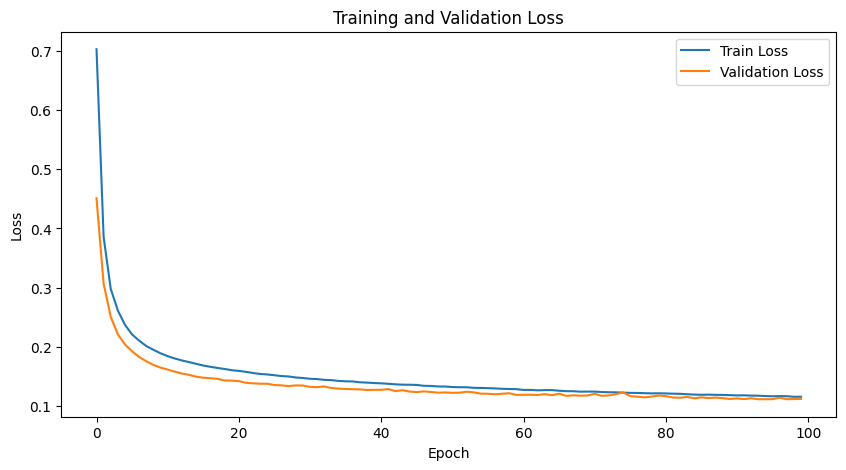

Train --------------------------------------


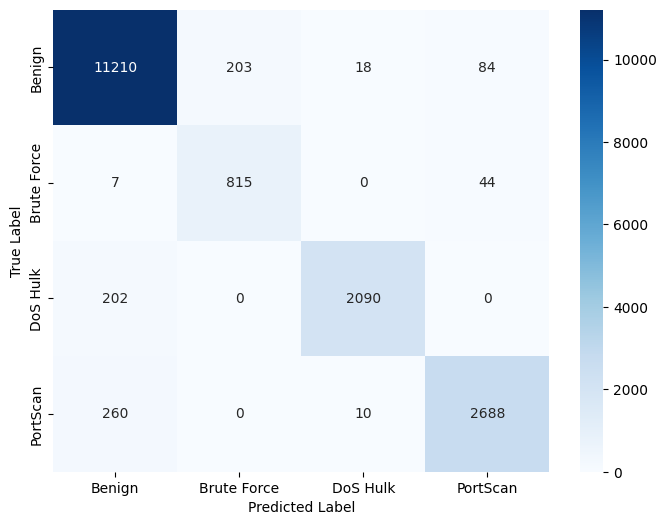

F1-score: 92.7681
Recall: 93.3803
Train Accuracy: 95.3037
Train Precision: 92.5439
Validation --------------------------------------


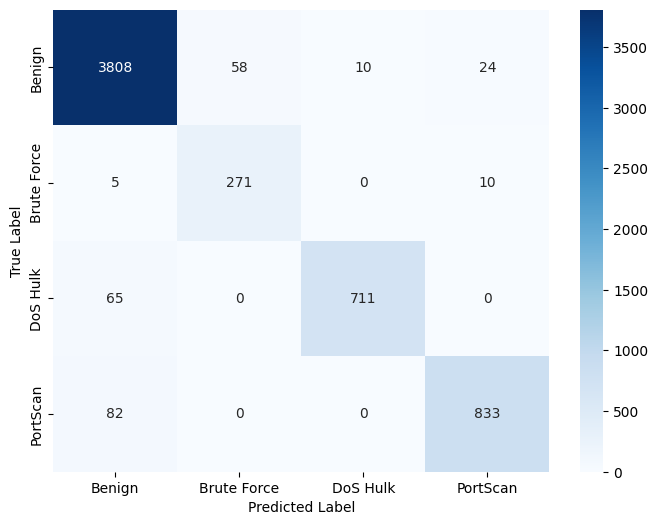

F1-score: 93.3765
Recall: 93.7646
Validation Accuracy: 95.6781
Validation Precision: 93.3060
Test --------------------------------------


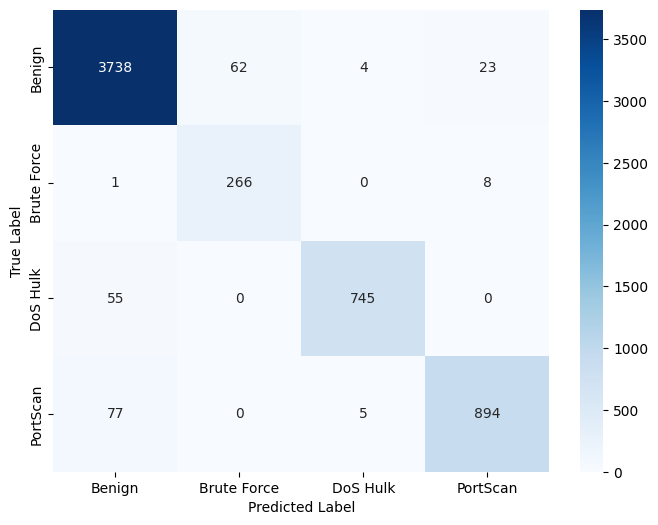

F1-score: 93.8198
Recall: 94.7813
Test Accuracy: 96.0020
Test Precision: 93.2792


In [ ]:
criterion = nn.CrossEntropyLoss()
# Define training parameters
num_epochs = 100

reluModel = SimpleReluModel(input_size=16, hidden_size=128, output_size=4).to(device)
optimizer = optim.AdamW(reluModel.parameters(), lr=0.0005)
training_loop(reluModel, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)

model=reluModel
print("Train --------------------------------------")
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
print("Validation --------------------------------------")
val_accuracy, val_prec, _ = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
print("Test --------------------------------------")
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')

In [ ]:
X_test_future

array([[-0.48612106, -0.36099551,  4.95875587, ..., -0.25261941,
        -0.03380205,  2.37731154],
       [-0.48702368, -0.36485602, -0.20166349, ..., -0.05964087,
        -0.04085638,  2.07537453],
       [-0.48702083, -0.36485641, -0.20166349, ..., -0.12001944,
        -0.03380205, -0.44250119],
       ...,
       [-0.48702312, -0.36485128, -0.20166349, ..., -0.11192678,
        -0.04085638, -0.1024362 ],
       [-0.48517319, -0.35957945, -0.20166349, ..., -0.25278674,
        -0.03380205, -0.44250119],
       [ 1.52089177,  5.36985501, -0.20166349, ..., -0.25309845,
        -0.03380205, -0.44250119]])

# **Task 3: The impact of specific features**

Train --------------------------------------


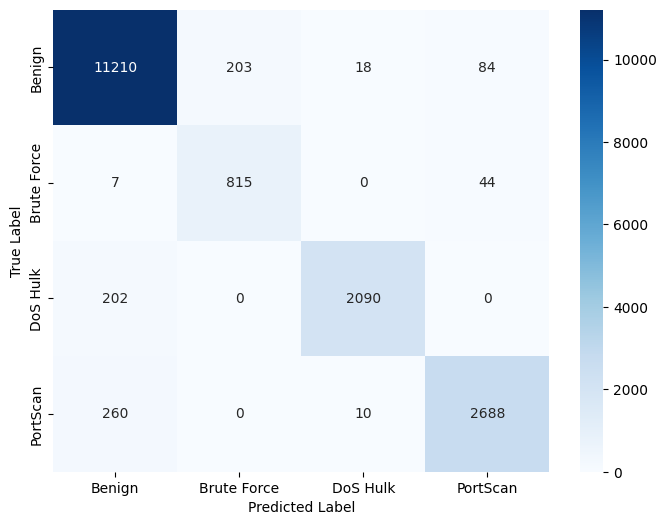

F1-score: 92.7681
Recall: 93.3803
Train Accuracy: 95.3037
Train Precision: 92.5439
Validation --------------------------------------


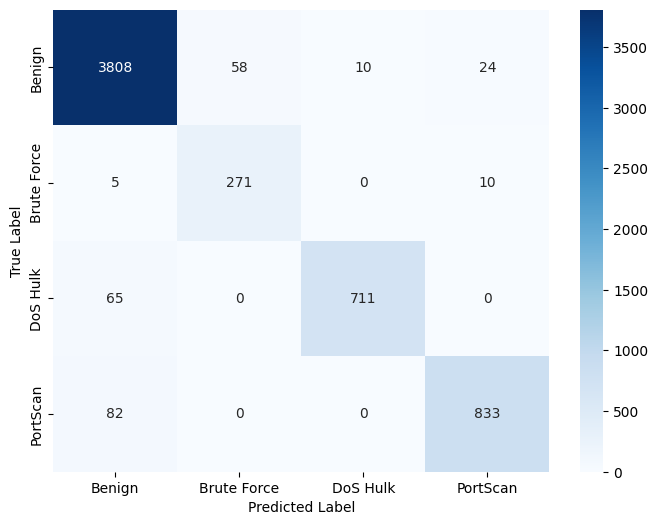

F1-score: 93.3765
Recall: 93.7646
Validation Accuracy: 95.6781
Validation Precision: 93.3060
Test --------------------------------------


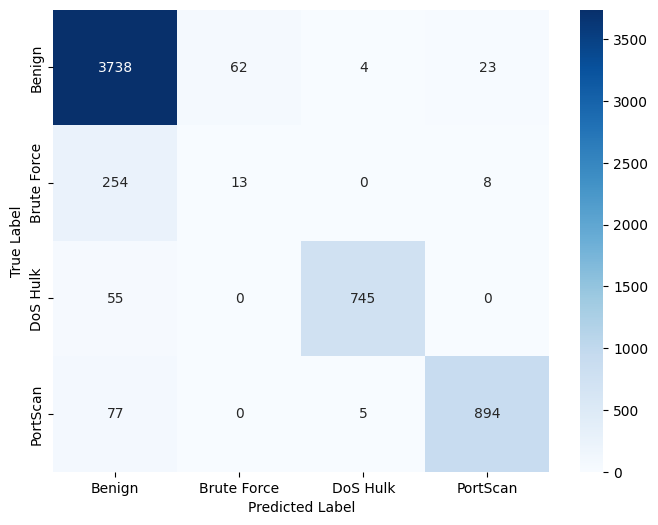

F1-score: 72.8480
Recall: 71.7813
Test Accuracy: 91.6979
Test Precision: 75.8571


In [ ]:

#test_future_loader contains test dataset w/ 80->8080 swap for bruteforce attacks
model=reluModel
print("Train --------------------------------------")
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
print("Validation --------------------------------------")
val_accuracy, val_prec, _ = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
print("Test --------------------------------------")
test_accuracy, test_prec, _ = testing_model(model,test_future_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')

*Remove the feature port from the original dataset*

Number of PortScan before pre-processing: 5000
Number of PortScan after pre-processing:  285
Label
Benign         16889
DoS Hulk        3868
Brute Force     1427
PortScan         285
Name: count, dtype: int64


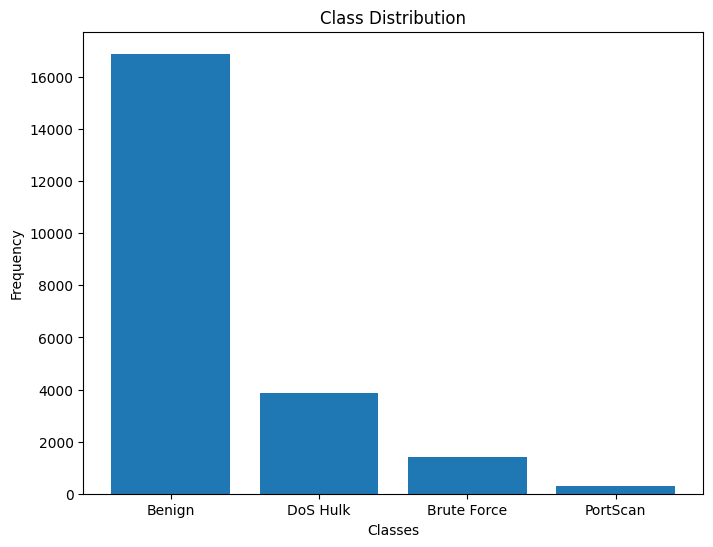

In [ ]:
# Drop the destination port
new_df = new_df.drop('Destination Port', axis=1)

print("Number of PortScan before pre-processing:", (new_df["Label"] == "PortScan").sum())


# Remove duplicates
new_df = new_df.drop_duplicates()
# Remove rows with missing values
new_df = new_df.dropna()
# remove rows with inf
new_df = new_df[~new_df.isin([np.inf, -np.inf]).any(axis=1)]

print("Number of PortScan after pre-processing: ",(new_df["Label"] == "PortScan").sum())


#Check for class imbalance. Just plot a graph that counts the number of samples for each class. We can see that is imbalance since there are far more benign samples
class_frequencies = new_df['Label'].value_counts()
print(class_frequencies)

plt.figure(figsize=(8, 6))
plt.bar(class_frequencies.index, class_frequencies.values)
plt.title('Class Distribution')
plt.xlabel('Classes')
plt.ylabel('Frequency')
plt.show()

# Encode labels
label_encoder = LabelEncoder()
new_df['Label'] = label_encoder.fit_transform(new_df['Label'])

In [ ]:
# Split the dataset

X = new_df.drop('Label', axis=1)
y = new_df['Label'].values

X_train, X_temp, y_train, y_temp = train_test_split(X, y, test_size=0.4, random_state=29)
X_val, X_test, y_val, y_test = train_test_split(X_temp, y_temp, test_size=0.5, random_state=29)

In [ ]:
unique_values, value_counts = np.unique(y, return_counts=True)

# Stampa i conteggi dei valori
for value, count in zip(unique_values, value_counts):
    print(f"Valore: {value}, Conteggio: {count}")

Valore: 0, Conteggio: 16889
Valore: 1, Conteggio: 1427
Valore: 2, Conteggio: 3868
Valore: 3, Conteggio: 285


In [ ]:
# Standardize the features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_val = scaler.transform(X_val)
X_test = scaler.transform(X_test)

In [ ]:
# Convert data to PyTorch tensors
X_train_tensor = torch.tensor(X_train, dtype=torch.float32)
y_train_tensor = torch.tensor(y_train, dtype=torch.long)
X_val_tensor = torch.tensor(X_val, dtype=torch.float32)
y_val_tensor = torch.tensor(y_val, dtype=torch.long)
X_test_tensor = torch.tensor(X_test, dtype=torch.float32)
y_test_tensor = torch.tensor(y_test, dtype=torch.long)

In [ ]:
# Create DataLoader
train_dataset = TensorDataset(X_train_tensor, y_train_tensor)
val_dataset = TensorDataset(X_val_tensor, y_val_tensor)
test_dataset = TensorDataset(X_test_tensor, y_test_tensor)

train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

Epoch 20/100, Train Loss: 0.1486, Val Loss: 0.1626
Epoch 40/100, Train Loss: 0.1246, Val Loss: 0.1436
Epoch 60/100, Train Loss: 0.1144, Val Loss: 0.1365
Epoch 80/100, Train Loss: 0.1091, Val Loss: 0.1324
Epoch 100/100, Train Loss: 0.1051, Val Loss: 0.1300
Training took 43.7989 seconds to execute.


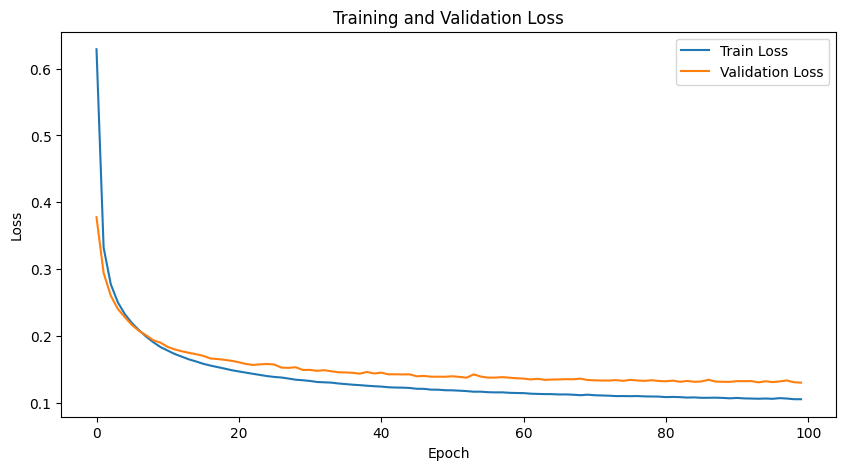

In [ ]:
criterion = nn.CrossEntropyLoss()
# Define training parameters
num_epochs = 100
reluModel = SimpleReluModel(input_size=15, hidden_size=128, output_size=4).to(device)
optimizer = optim.AdamW(reluModel.parameters(), lr=0.0005)
training_loop(reluModel, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)

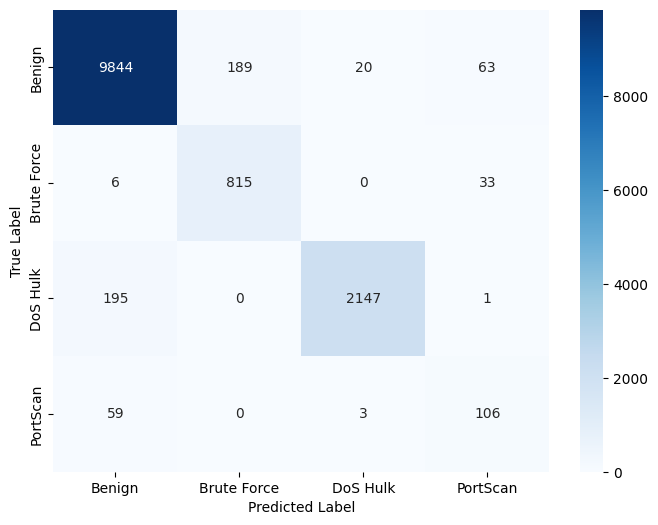

F1-score: 84.3470
Recall: 86.8686
Train Accuracy: 95.7792
Train Precision: 82.4397


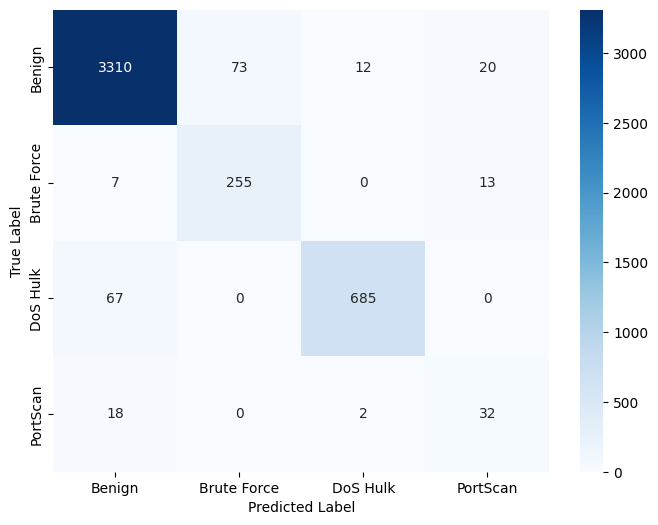

F1-score: 82.7014
Recall: 85.5704
Validation Accuracy: 95.2826
Validation Precision: 80.5669


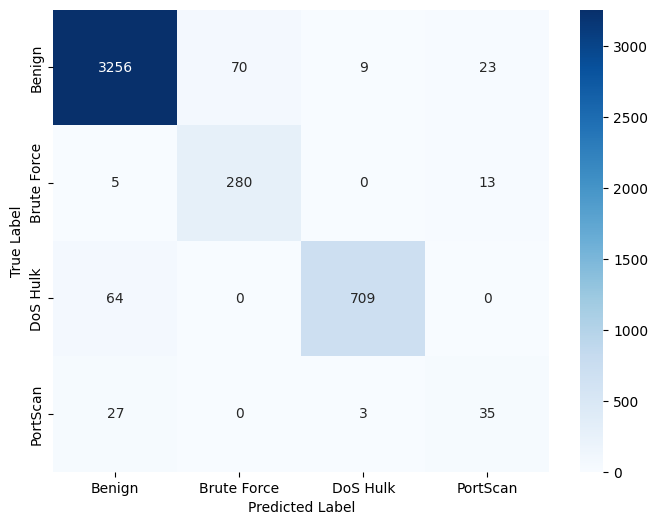

F1-score: 82.4631
Recall: 84.1222
Test Accuracy: 95.2381
Test Precision: 81.1919


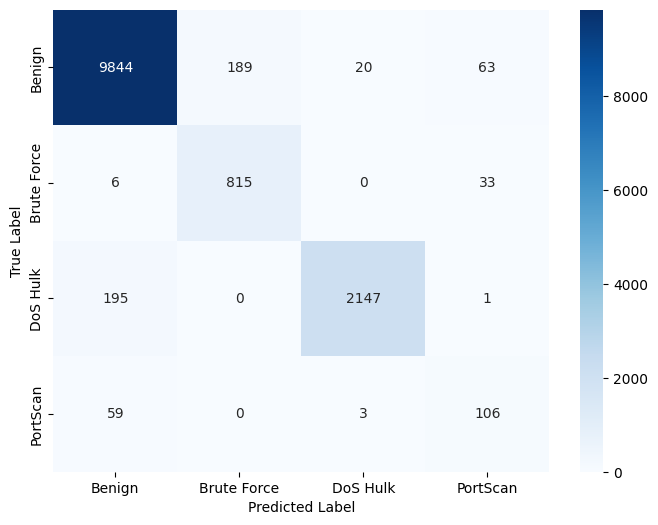

F1-score: 84.3470
Recall: 86.8686
Train Accuracy: 95.7792
Train Precision: 82.4397


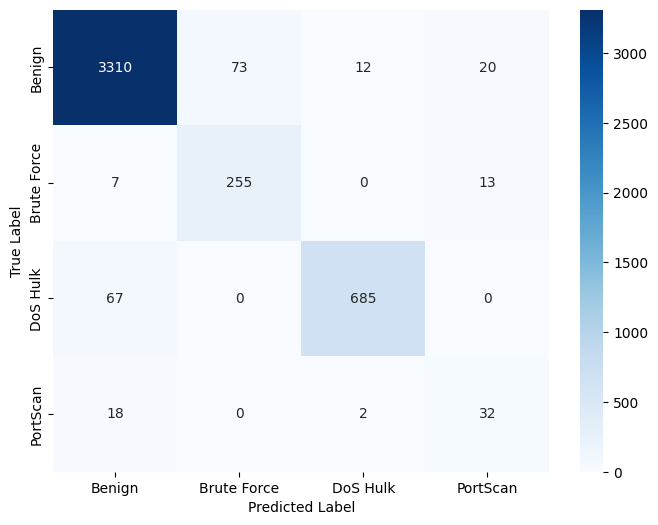

F1-score: 82.7014
Recall: 85.5704
Validation Accuracy: 95.2826
Validation Precision: 80.5669


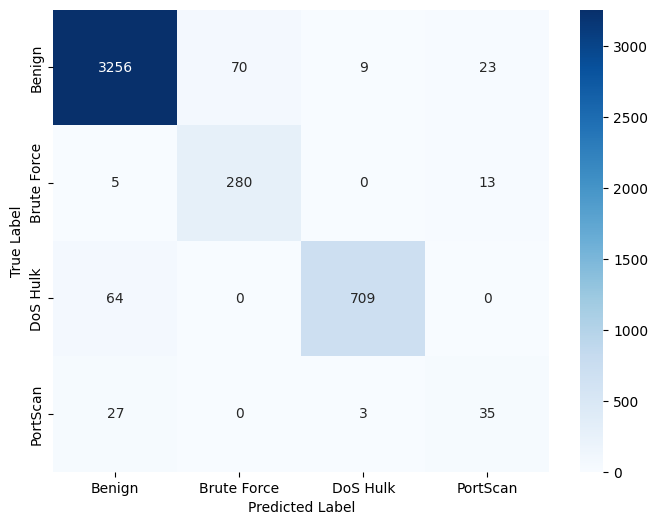

F1-score: 82.4631
Recall: 84.1222
Test Accuracy: 95.2381
Test Precision: 81.1919


In [ ]:
model=reluModel
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
val_accuracy, val_prec, _ = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')

*Use weighted loss*

In [ ]:
from sklearn.utils.class_weight import compute_class_weight

# Calculate class weights using 'balanced' mode
class_weights = compute_class_weight(class_weight='balanced', classes=np.unique(y_train), y=y_train)

# Convert to a PyTorch tensor
class_weights_tensor = torch.tensor(class_weights, dtype=torch.float32).to(device)

Epoch 20/100, Train Loss: 0.2409, Val Loss: 0.3291
Epoch 40/100, Train Loss: 0.1999, Val Loss: 0.3140
Epoch 60/100, Train Loss: 0.1808, Val Loss: 0.3268
Epoch 80/100, Train Loss: 0.1733, Val Loss: 0.3363
Epoch 100/100, Train Loss: 0.1654, Val Loss: 0.3498
Training took 44.5534 seconds to execute.


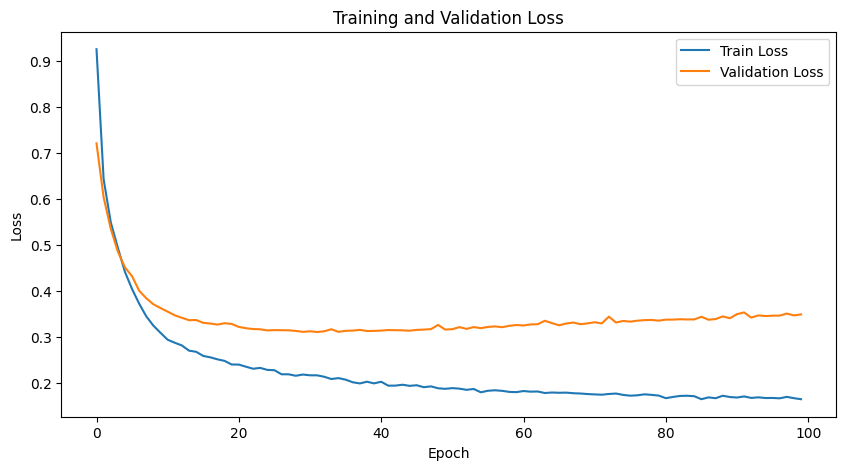

In [ ]:
criterion = nn.CrossEntropyLoss(weight=class_weights_tensor)
# Define training parameters
num_epochs = 100
reluModel = SimpleReluModel(input_size=15, hidden_size=128, output_size=4).to(device)
optimizer = optim.AdamW(reluModel.parameters(), lr=0.0005)
training_loop(reluModel, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)

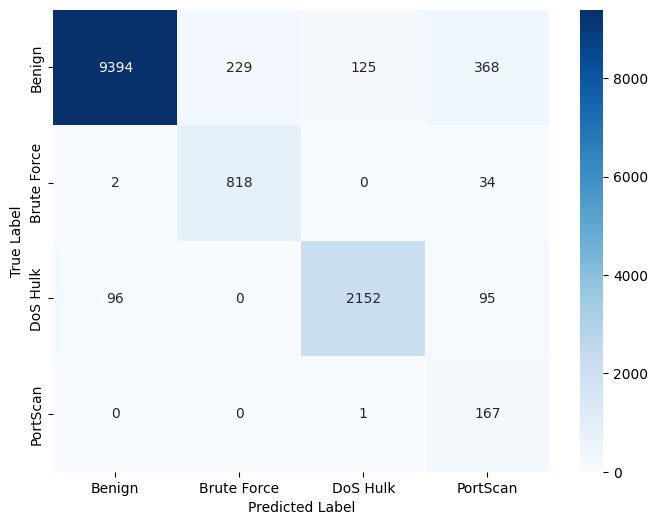

F1-score: 78.7906
Recall: 94.9750
Train Accuracy: 92.9530
Train Precision: 74.1787


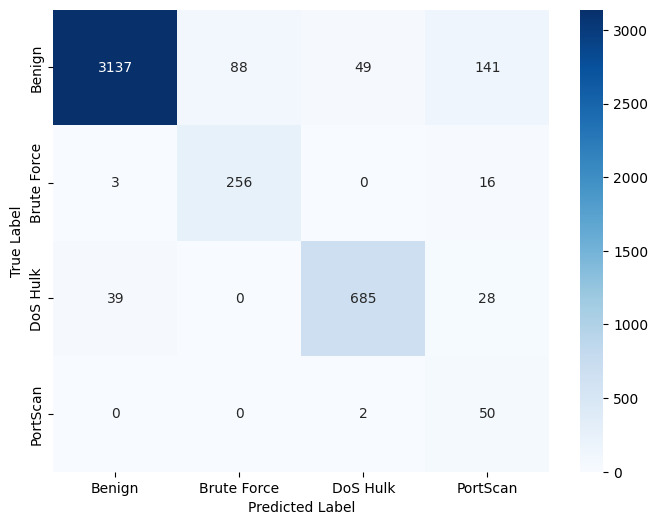

F1-score: 76.1936
Recall: 93.0487
Validation Accuracy: 91.8558
Validation Precision: 71.8612


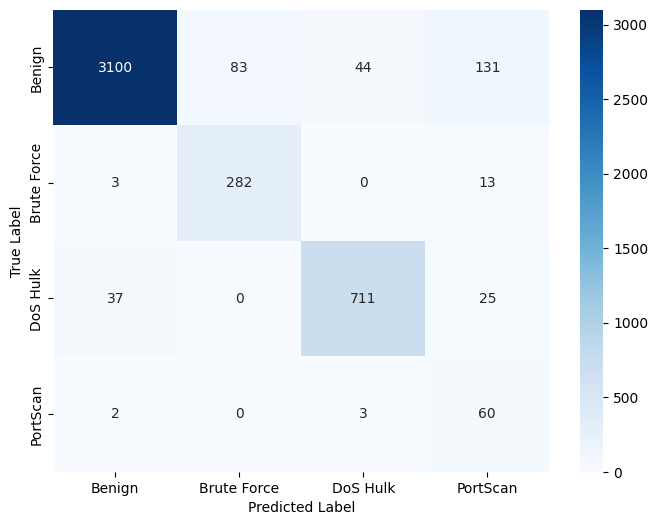

F1-score: 78.5373
Recall: 92.8087
Test Accuracy: 92.4121
Test Precision: 73.9810


In [ ]:
model=reluModel
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
val_accuracy, val_prec, _ = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')

# **Task 4: Deep Neural Network**

In [ ]:
class DeepFFNN(nn.Module):
    def __init__(self, input_size, layer_sizes, output_size):
        super(DeepFFNN, self).__init__()
        layers = []

        # first hidden layer
        layers.append(nn.Linear(input_size, layer_sizes[0]))
        layers.append(nn.ReLU())

        # Hidden layers added
        for i in range(1, len(layer_sizes)):
            layers.append(nn.Linear(layer_sizes[i - 1], layer_sizes[i]))
            layers.append(nn.ReLU())


        layers.append(nn.Linear(layer_sizes[-1], output_size)) #for the last layer we don't use a relu as activation function, since every output <0 will be seen as a 0 with a relu, so it's better to use the automatic softmax applied by pytorch

        self.model = nn.Sequential(*layers) #Create an ordered sequence of layers that are applied one after another to the input data.
                                            # model becomes the whole neural network

    def forward(self, x):
        return self.model(x)

In [ ]:
#Define the device to use for training and validation
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

cuda


In [ ]:
criterion = nn.CrossEntropyLoss()

In [ ]:

import random

layer_sizes_possible = [2, 4, 8, 16, 32]
no_candidates = 30
candidates = []

for _ in range(no_candidates):
    # pick number of layers between 2 and 5
    layer_number = random.randint(2, 5)
    # randomly choose neurons for each layer
    layer_sizes = [random.choice(layer_sizes_possible) for _ in range(layer_number)]
    candidates.append(layer_sizes)
    print(layer_sizes)

# Example output:
# [16, 32]
# [8, 16, 32, 16]
# [32, 32, 8, 16, 4]


[4, 2, 16]
[4, 32, 16, 16, 2]
[2, 8, 4, 16]
[8, 4, 2]
[32, 4, 2, 8, 8]
[32, 16, 32]
[4, 4, 16]
[32, 4]
[4, 8, 8, 4]
[8, 32, 32, 8, 2]
[2, 4, 8, 8, 32]
[8, 16, 2, 32, 8]
[8, 16, 2, 2]
[16, 8]
[2, 2, 8, 8]
[2, 2, 32]
[8, 4, 4]
[8, 16, 2, 2, 2]
[2, 16, 32, 4, 32]
[2, 16, 32, 32]
[32, 32]
[16, 16]
[32, 16, 4, 16, 2]
[8, 2, 8, 8]
[4, 2]
[4, 4, 8, 4]
[32, 8, 8, 16]
[4, 16, 4, 8, 8]
[4, 4, 32, 2, 2]
[4, 4, 8, 2]


Training took 7.1567 seconds to execute.


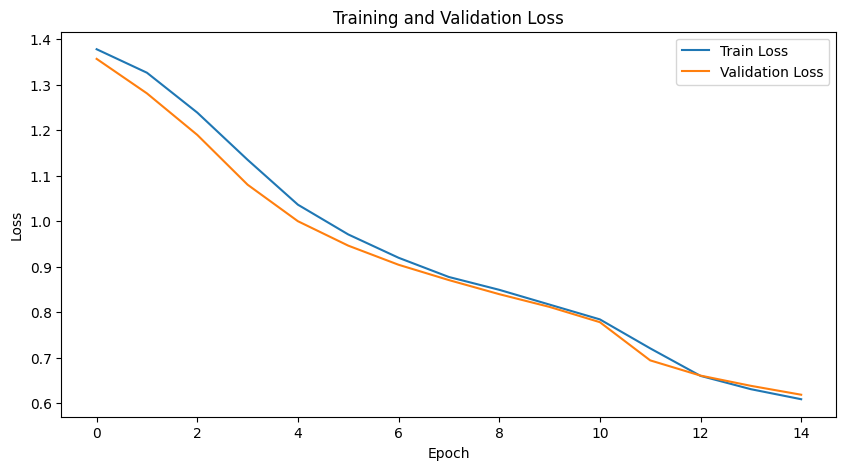

Neurons per layer: [4, 2, 16]


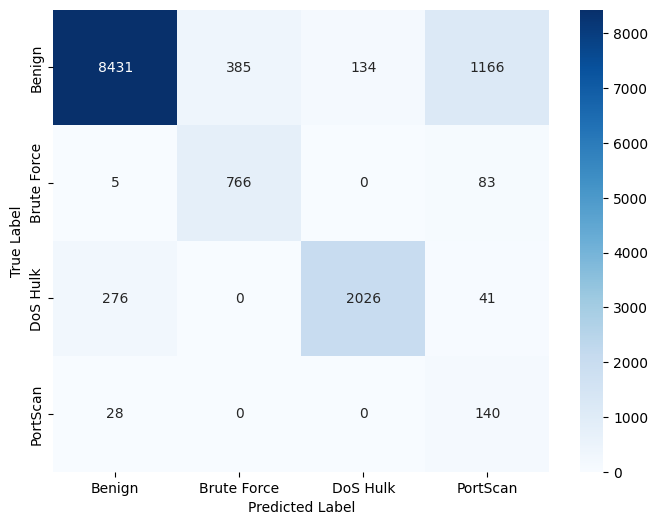

F1-score: 68.3351
Recall: 85.7106
Train Accuracy: 84.2890
Train Precision: 66.6505


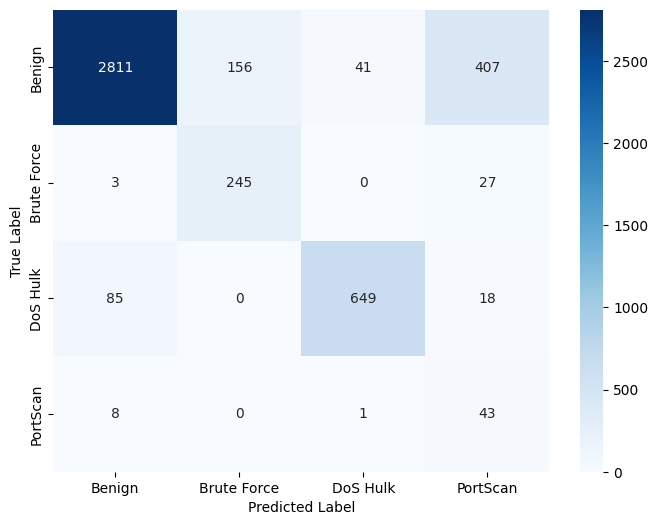

F1-score: 66.7716
Recall: 85.0999
Validation Accuracy: 83.4001
Validation Precision: 65.1009
Training took 9.0947 seconds to execute.


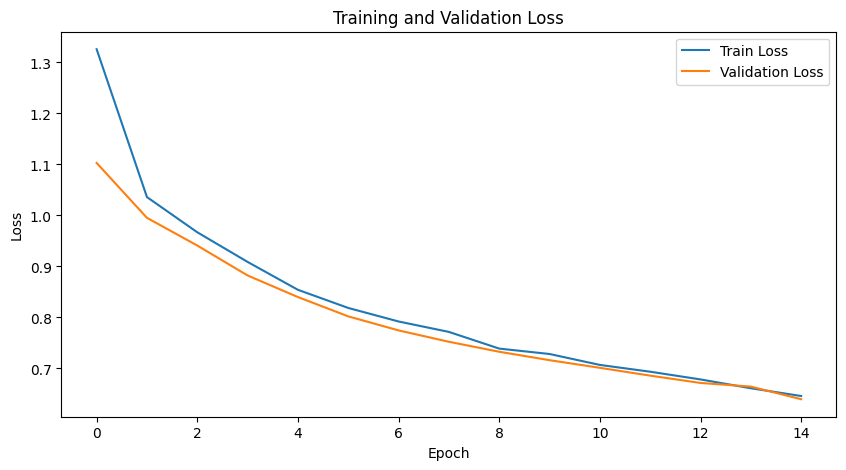

Neurons per layer: [4, 32, 16, 16, 2]


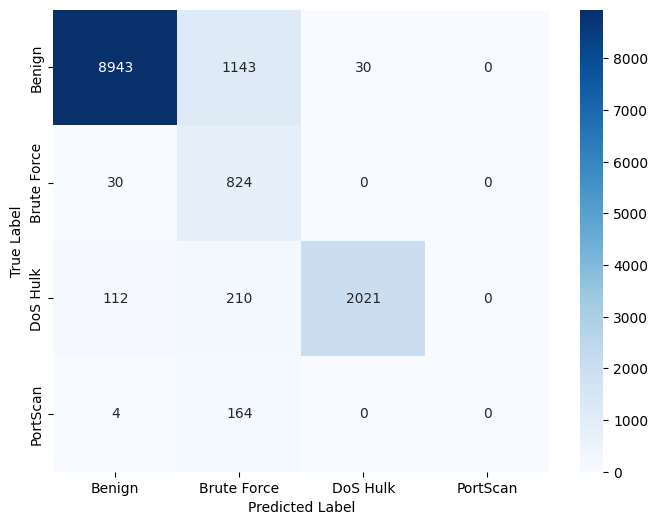

F1-score: 59.1754
Recall: 67.7871
Train Accuracy: 87.4416
Train Precision: 58.0324


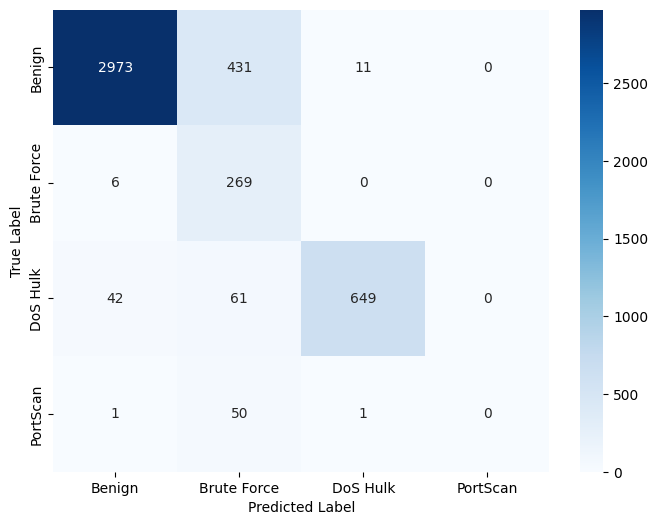

F1-score: 58.4433
Recall: 67.7946
Validation Accuracy: 86.5821
Validation Precision: 57.4330
Training took 8.9984 seconds to execute.


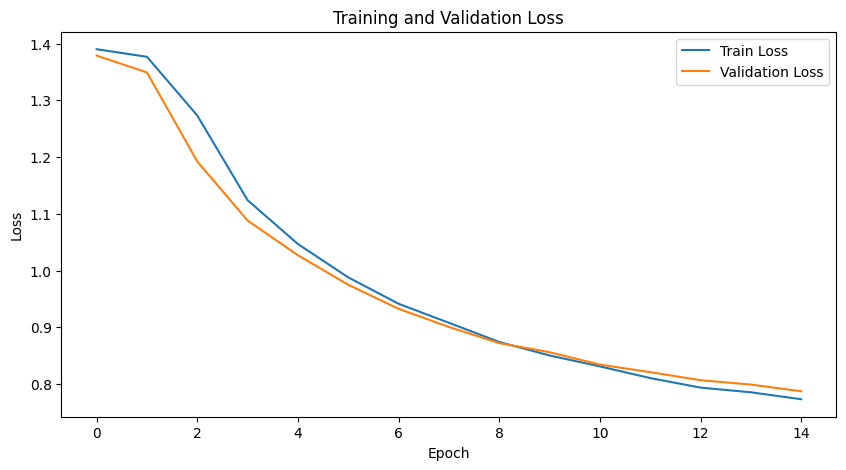

Neurons per layer: [2, 8, 4, 16]


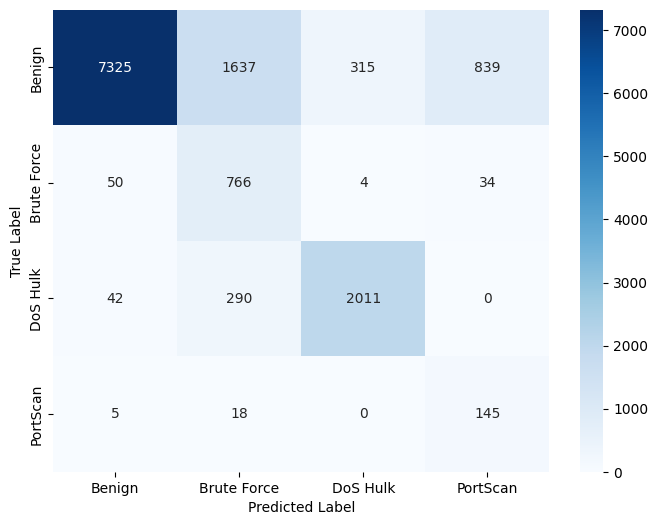

F1-score: 59.2568
Recall: 83.5613
Train Accuracy: 76.0107
Train Precision: 56.8752


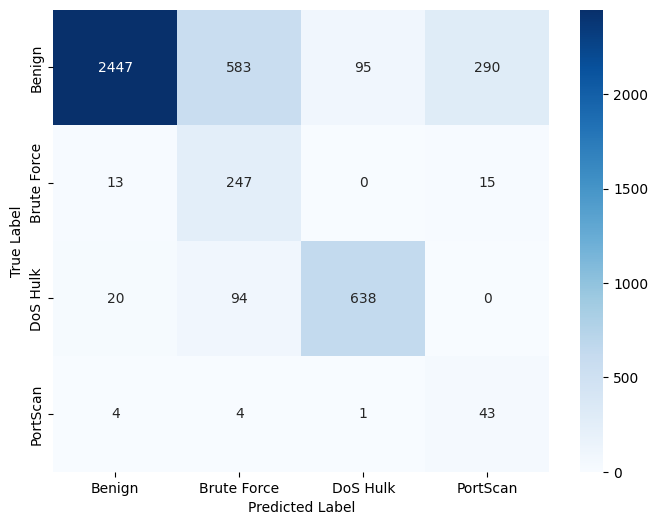

F1-score: 57.8488
Recall: 82.2513
Validation Accuracy: 75.1001
Validation Precision: 56.1010
Training took 7.8435 seconds to execute.


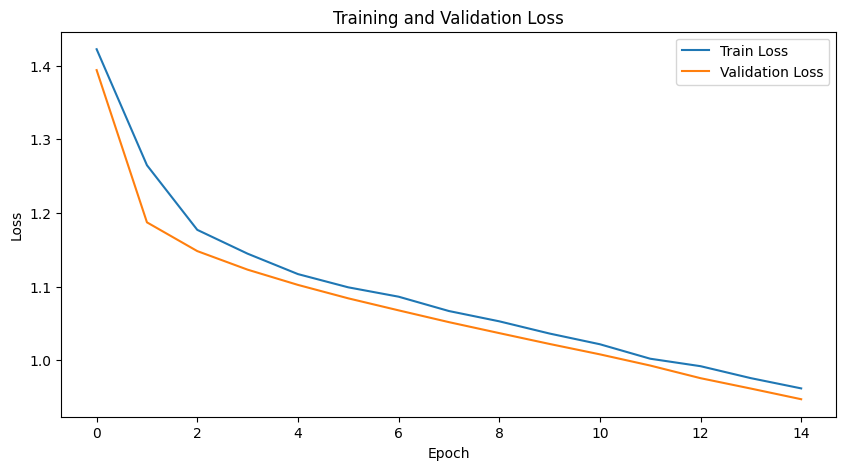

Neurons per layer: [8, 4, 2]


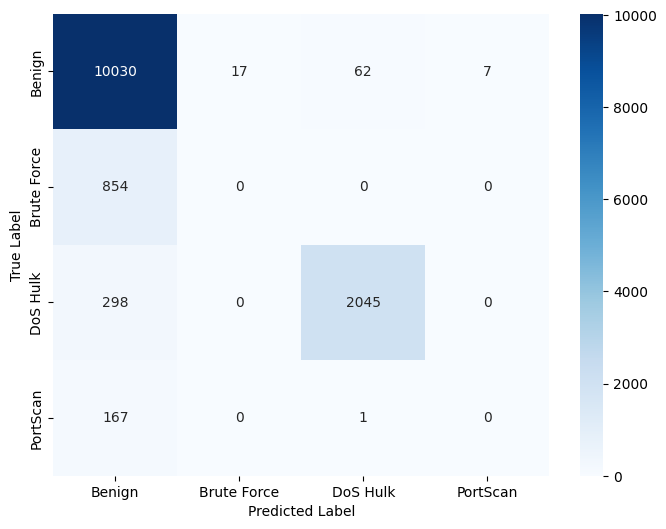

F1-score: 46.3360
Recall: 46.6078
Train Accuracy: 89.5705
Train Precision: 46.3473


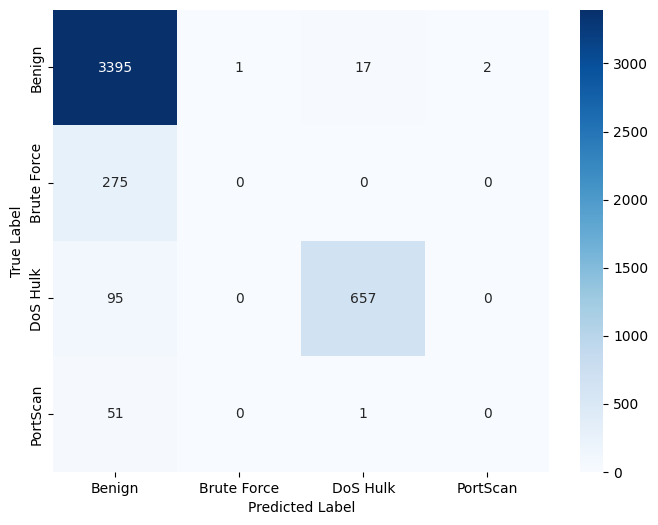

F1-score: 46.4956
Recall: 46.6953
Validation Accuracy: 90.1647
Validation Precision: 46.5752
Training took 8.7845 seconds to execute.


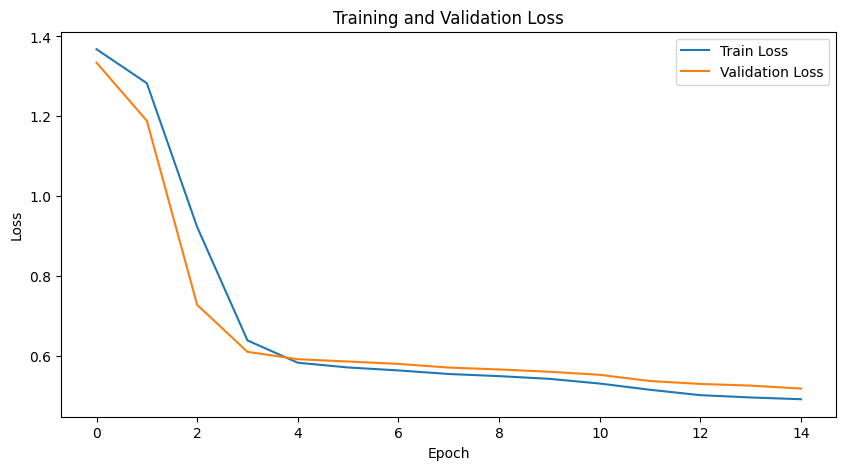

Neurons per layer: [32, 4, 2, 8, 8]


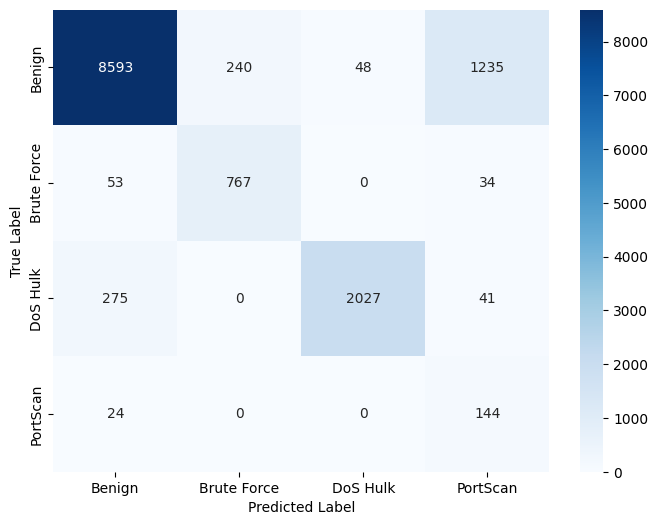

F1-score: 70.5272
Recall: 86.7461
Train Accuracy: 85.5352
Train Precision: 69.9555


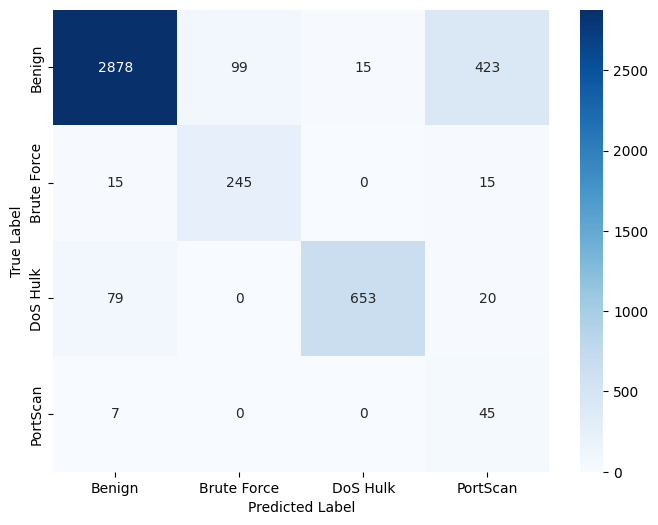

F1-score: 69.3425
Recall: 86.6849
Validation Accuracy: 85.0245
Validation Precision: 68.6328
Training took 8.0487 seconds to execute.


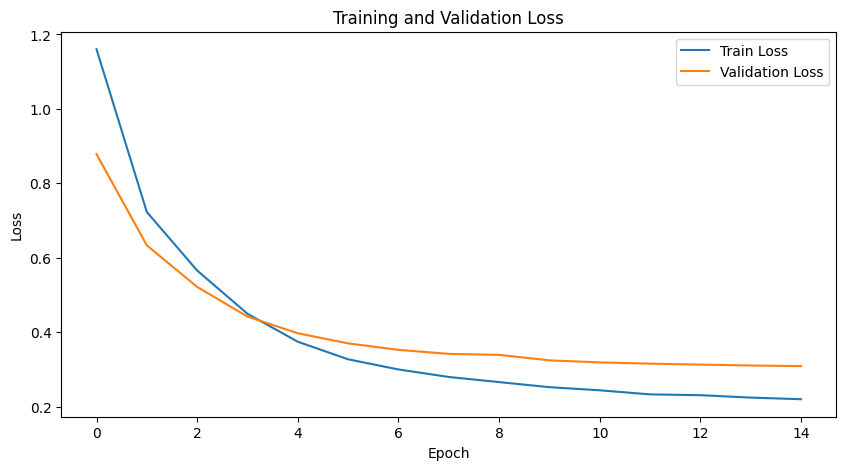

Neurons per layer: [32, 16, 32]


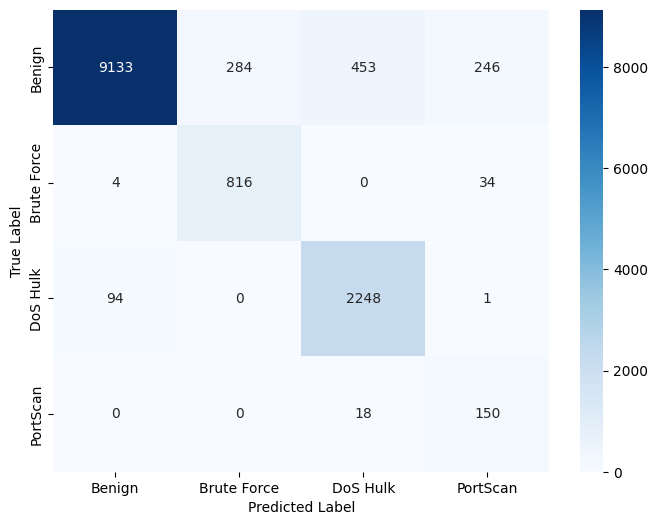

F1-score: 79.2089
Recall: 92.7660
Train Accuracy: 91.5882
Train Precision: 72.6501


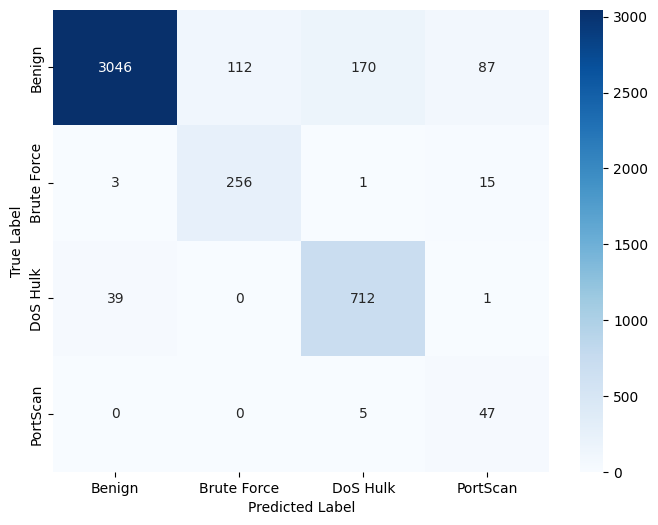

F1-score: 76.6676
Recall: 91.8378
Validation Accuracy: 90.3649
Validation Precision: 69.9297
Training took 7.6940 seconds to execute.


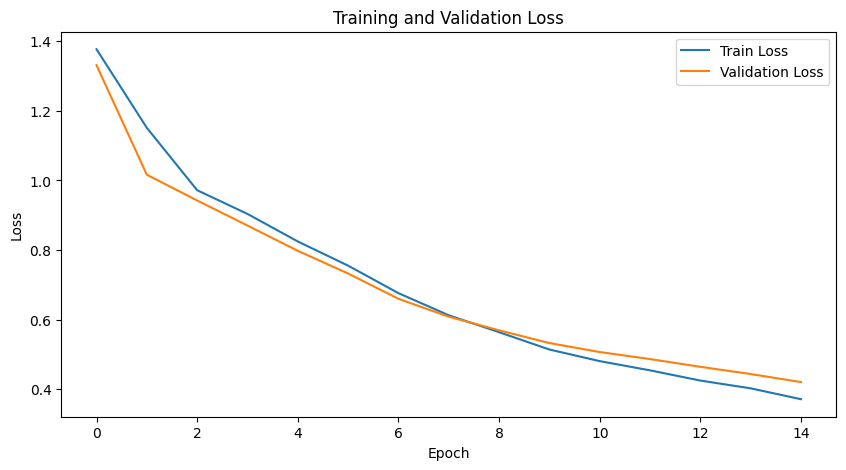

Neurons per layer: [4, 4, 16]


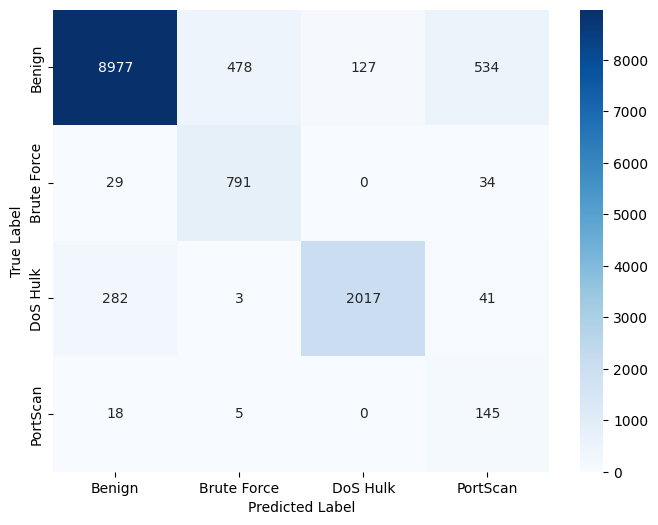

F1-score: 72.0091
Recall: 88.4398
Train Accuracy: 88.4949
Train Precision: 67.9285


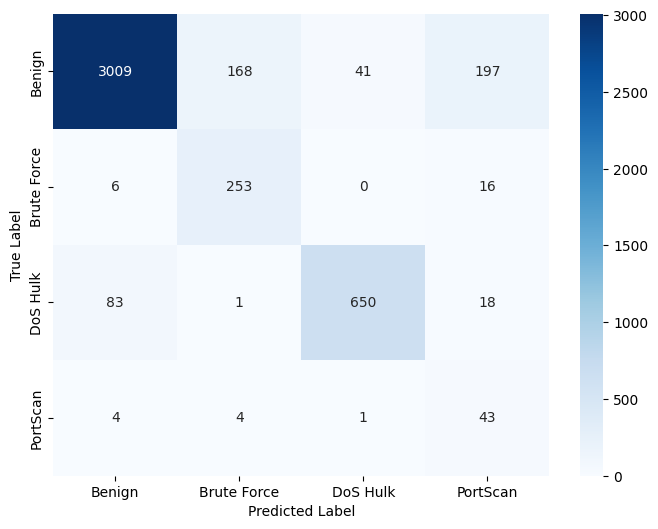

F1-score: 70.2334
Recall: 87.3099
Validation Accuracy: 88.0062
Validation Precision: 66.5039
Training took 6.7497 seconds to execute.


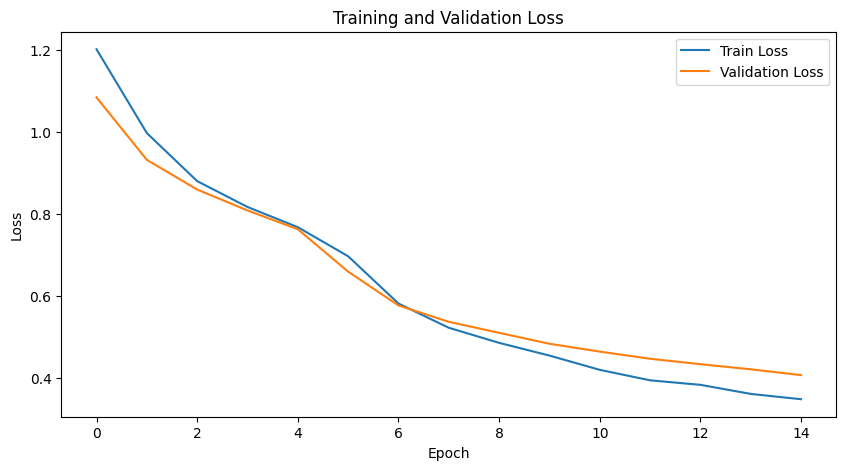

Neurons per layer: [32, 4]


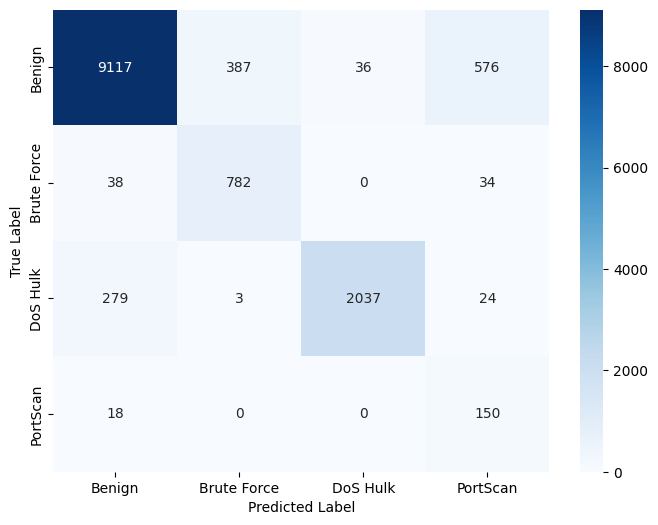

F1-score: 73.5368
Recall: 89.4798
Train Accuracy: 89.6521
Train Precision: 70.1438


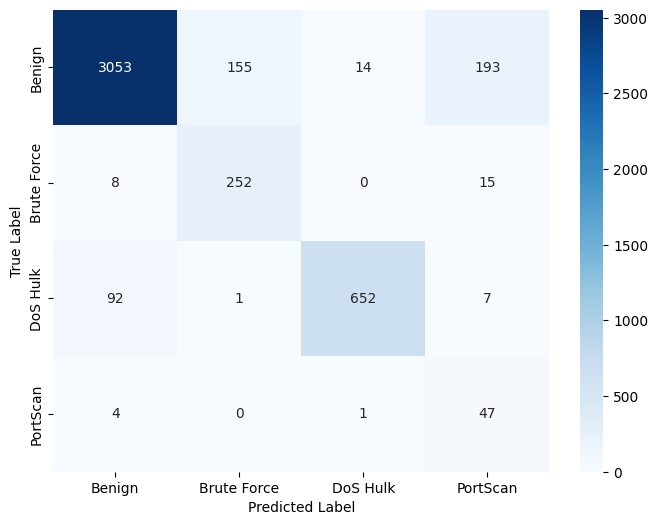

F1-score: 72.1334
Recall: 89.5307
Validation Accuracy: 89.0966
Validation Precision: 68.5401
Training took 8.6078 seconds to execute.


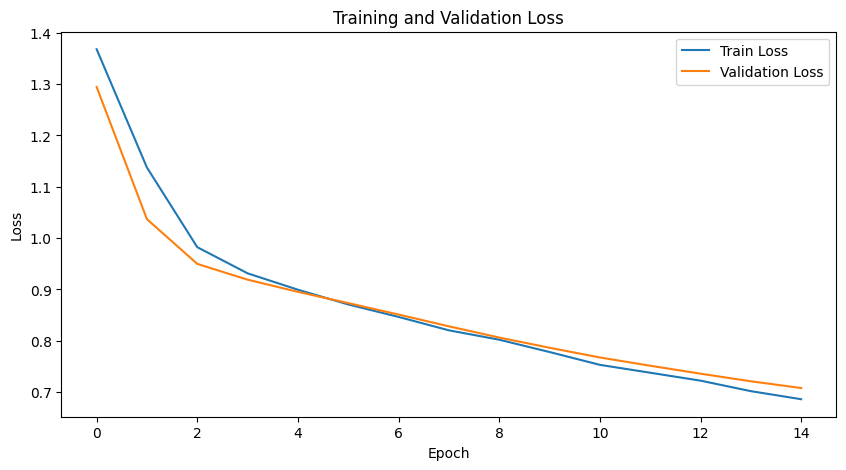

Neurons per layer: [4, 8, 8, 4]


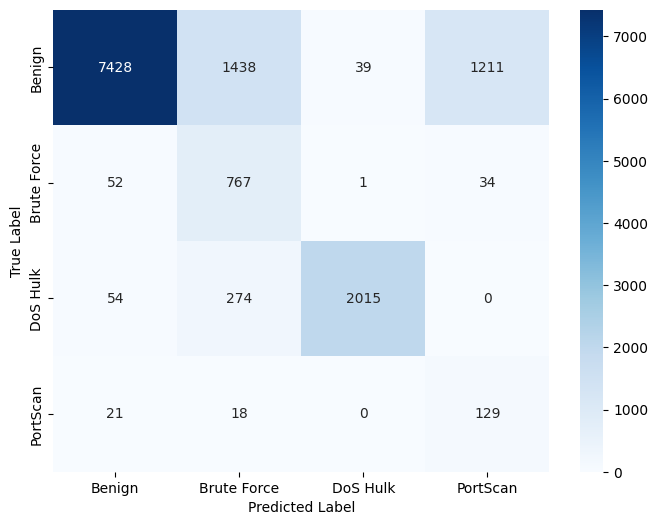

F1-score: 59.5529
Recall: 81.5069
Train Accuracy: 76.6931
Train Precision: 59.1195


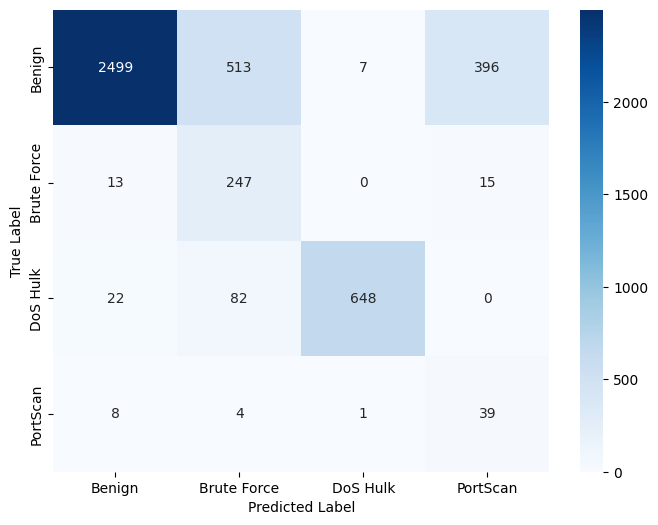

F1-score: 58.8881
Recall: 81.0414
Validation Accuracy: 76.3907
Validation Precision: 58.7379
Training took 9.1910 seconds to execute.


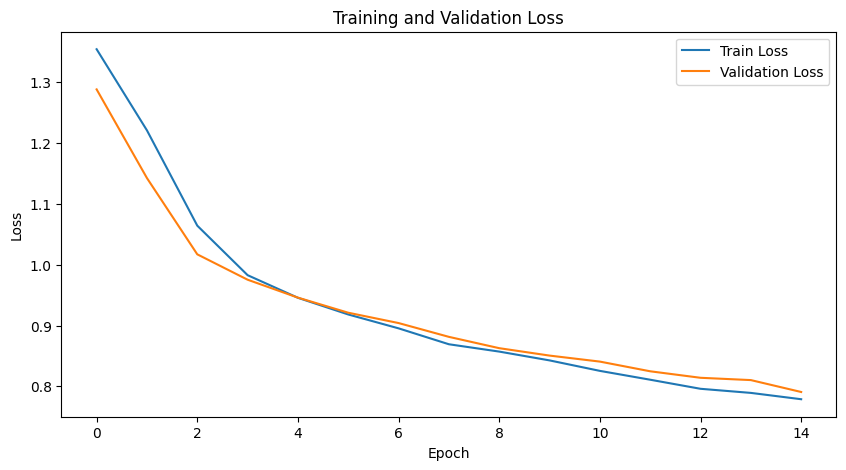

Neurons per layer: [8, 32, 32, 8, 2]


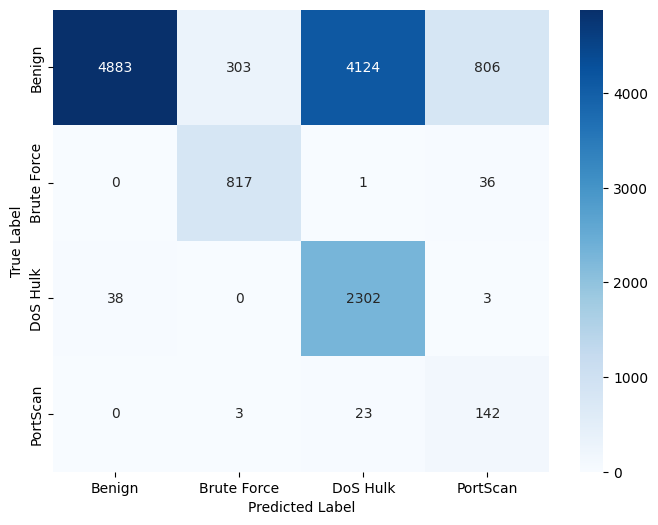

F1-score: 56.1364
Recall: 81.6779
Train Accuracy: 60.4109
Train Precision: 55.5141


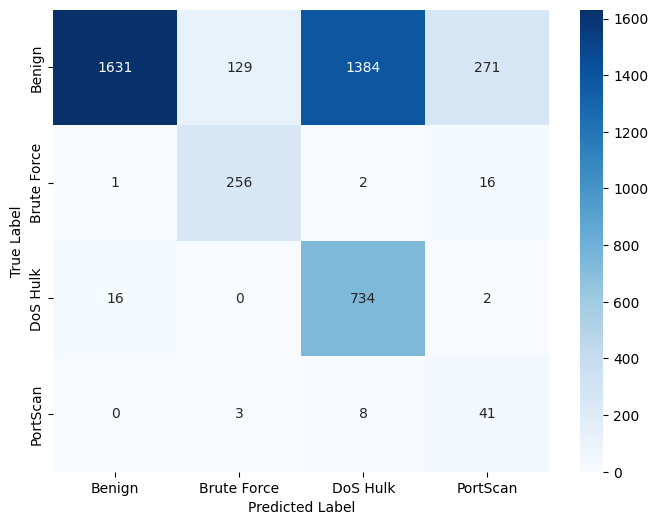

F1-score: 53.5228
Recall: 79.3258
Validation Accuracy: 59.2345
Validation Precision: 52.9661
Training took 8.3781 seconds to execute.


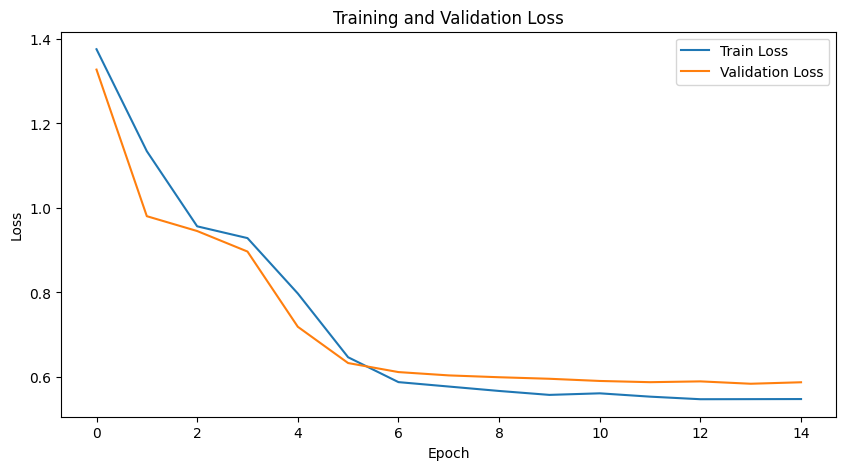

Neurons per layer: [2, 4, 8, 8, 32]


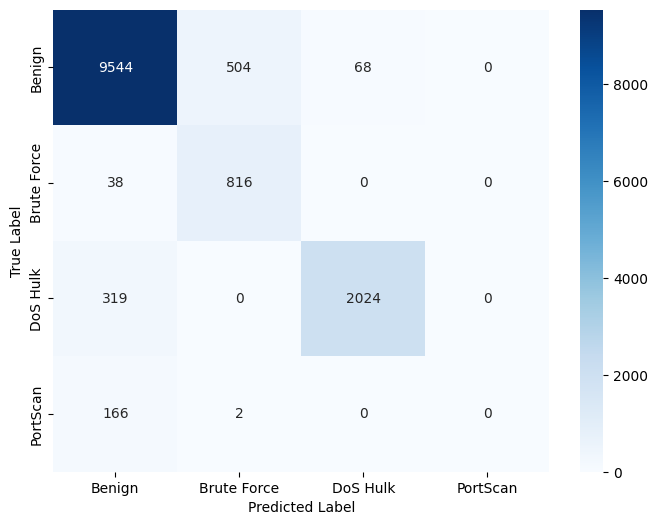

F1-score: 65.2121
Recall: 69.0702
Train Accuracy: 91.8626
Train Precision: 63.3197


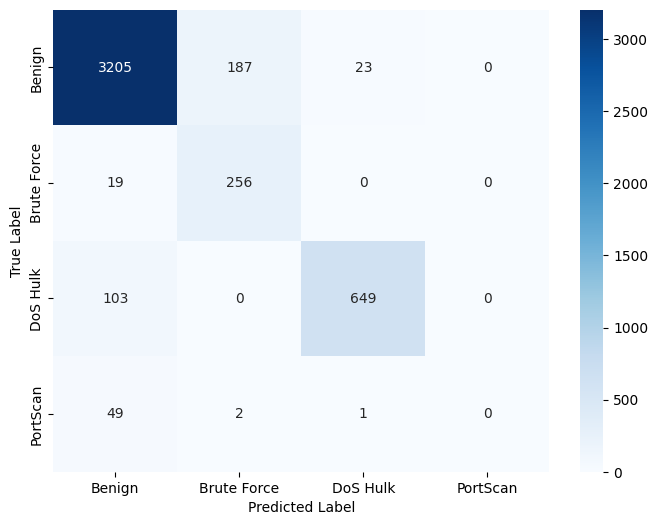

F1-score: 64.1471
Recall: 68.3112
Validation Accuracy: 91.4553
Validation Precision: 62.2242
Training took 9.1031 seconds to execute.


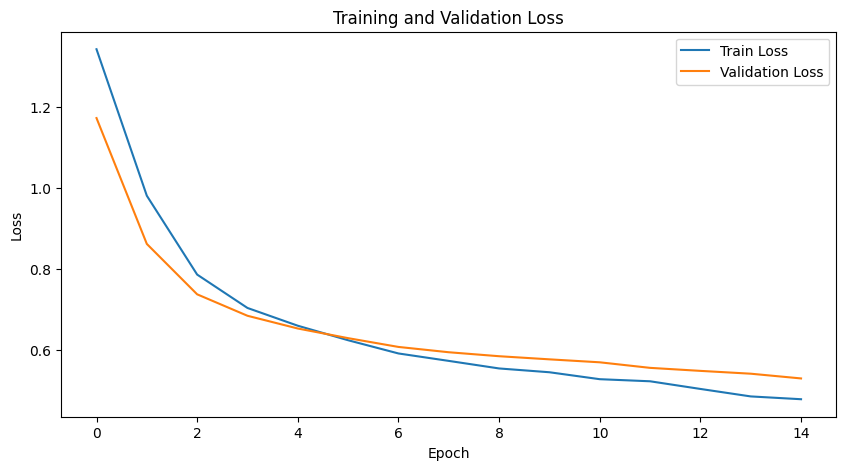

Neurons per layer: [8, 16, 2, 32, 8]


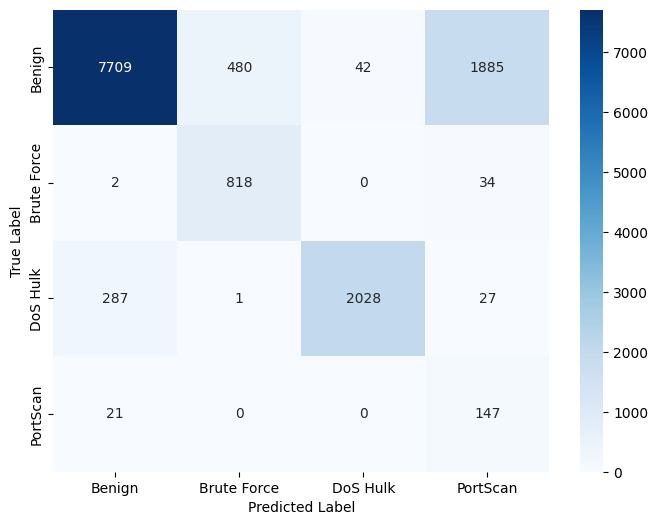

F1-score: 66.4796
Recall: 86.5116
Train Accuracy: 79.3858
Train Precision: 66.0250


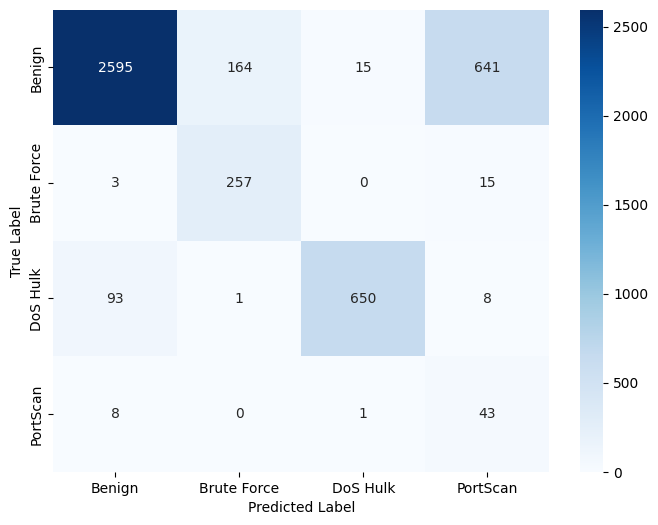

F1-score: 65.4102
Recall: 84.6428
Validation Accuracy: 78.8830
Validation Precision: 65.1817
Training took 8.6086 seconds to execute.


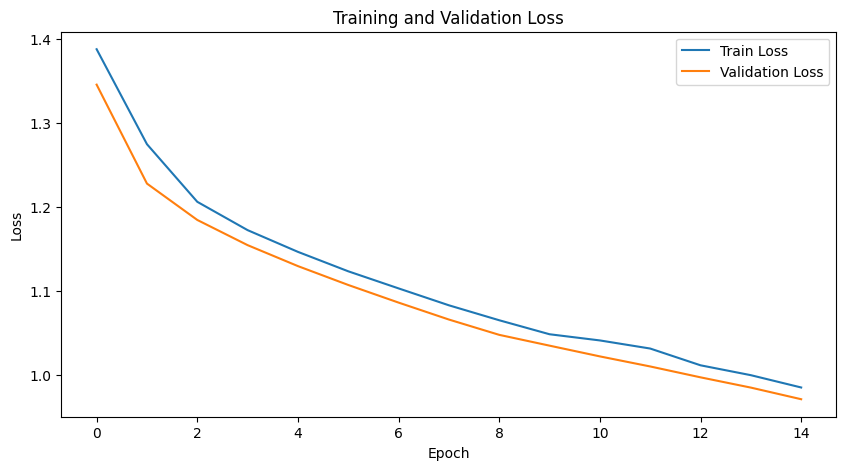

Neurons per layer: [8, 16, 2, 2]


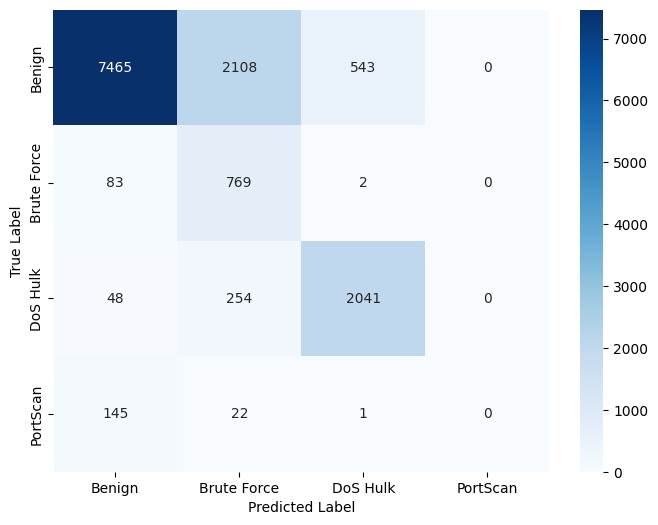

F1-score: 51.1977
Recall: 62.7378
Train Accuracy: 76.2184
Train Precision: 49.9296


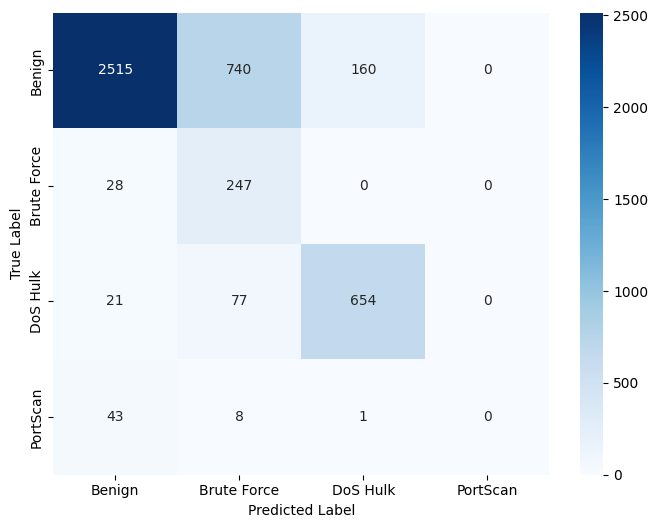

F1-score: 50.9182
Recall: 62.6080
Validation Accuracy: 76.0125
Validation Precision: 49.9394
Training took 6.9522 seconds to execute.


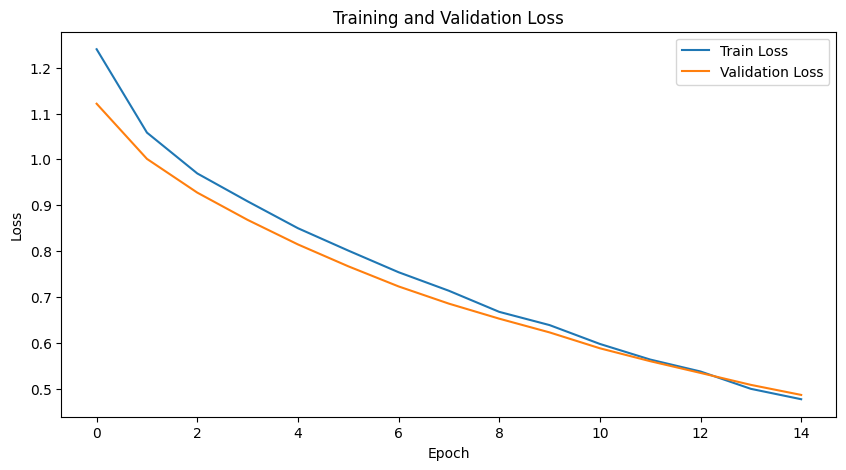

Neurons per layer: [16, 8]


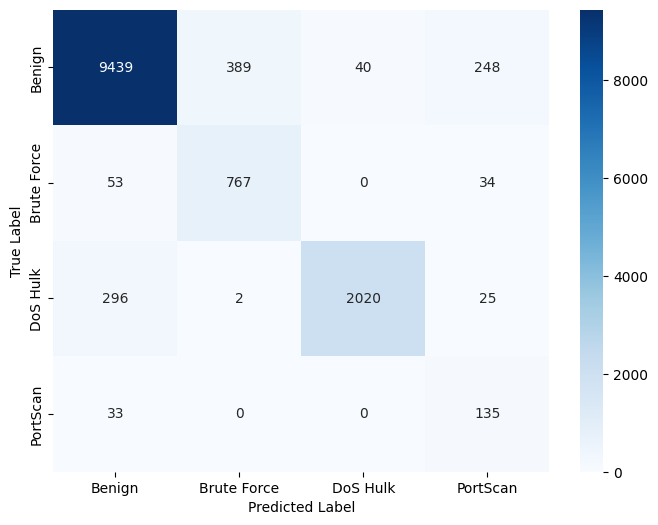

F1-score: 76.7372
Recall: 87.4229
Train Accuracy: 91.6920
Train Precision: 72.7366


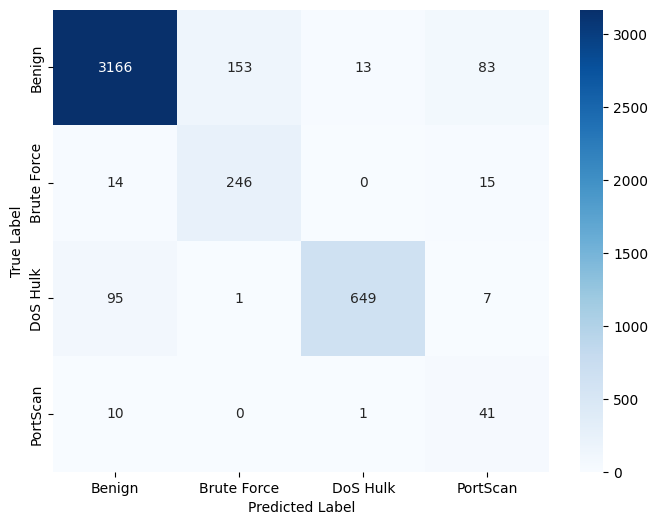

F1-score: 75.1355
Recall: 86.8281
Validation Accuracy: 91.2773
Validation Precision: 70.9620
Training took 8.9312 seconds to execute.


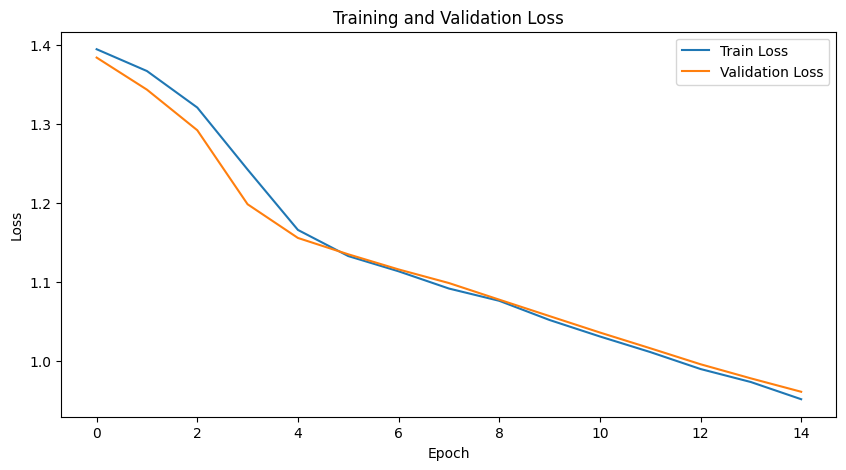

Neurons per layer: [2, 2, 8, 8]


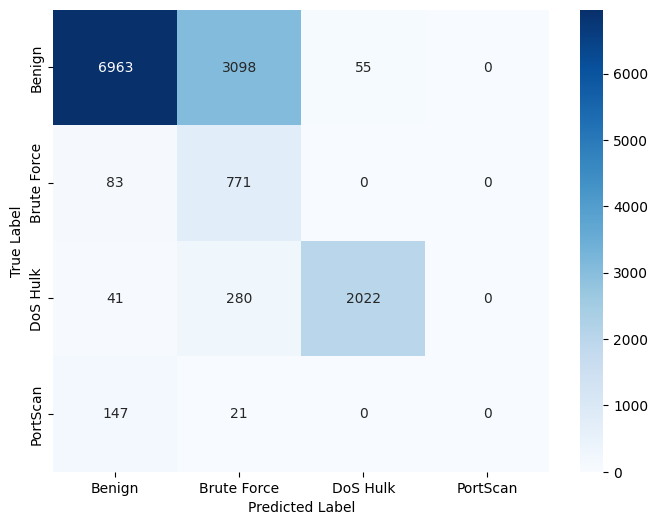

F1-score: 50.6128
Recall: 61.3531
Train Accuracy: 72.3685
Train Precision: 53.0237


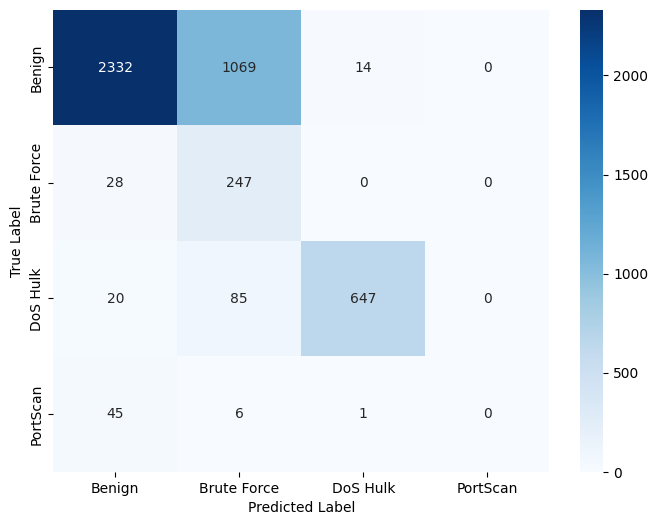

F1-score: 50.1866
Recall: 61.0356
Validation Accuracy: 71.7846
Validation Precision: 52.8635
Training took 8.1122 seconds to execute.


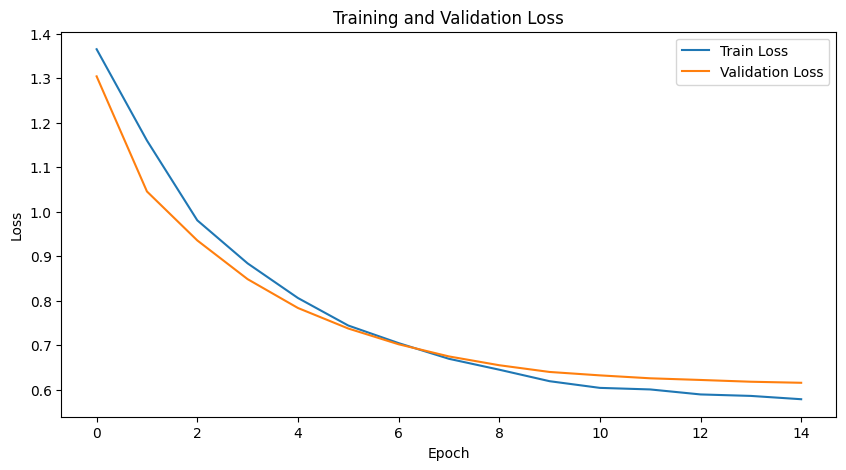

Neurons per layer: [2, 2, 32]


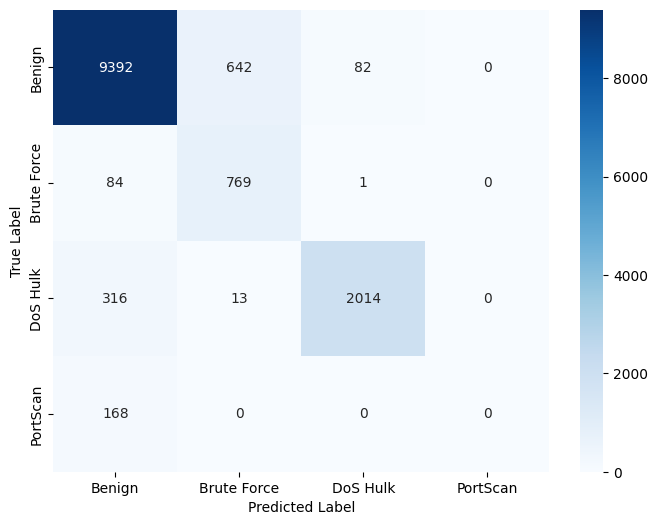

F1-score: 62.9501
Recall: 67.2120
Train Accuracy: 90.3123
Train Precision: 61.0855


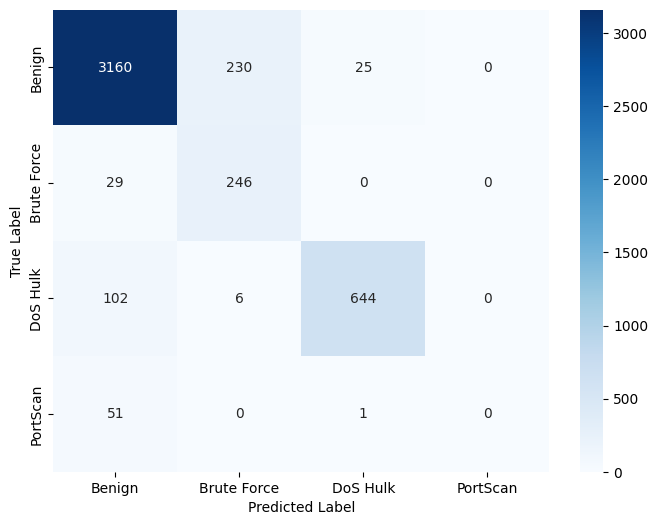

F1-score: 62.2757
Recall: 66.9064
Validation Accuracy: 90.1202
Validation Precision: 60.4277
Training took 7.8664 seconds to execute.


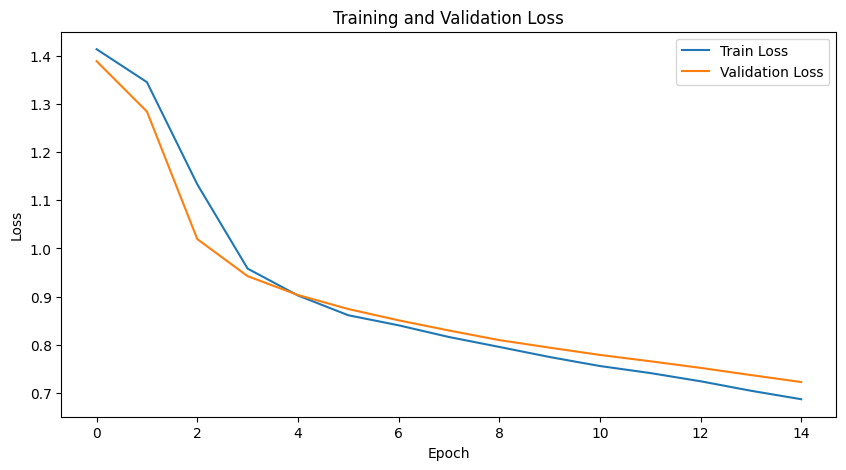

Neurons per layer: [8, 4, 4]


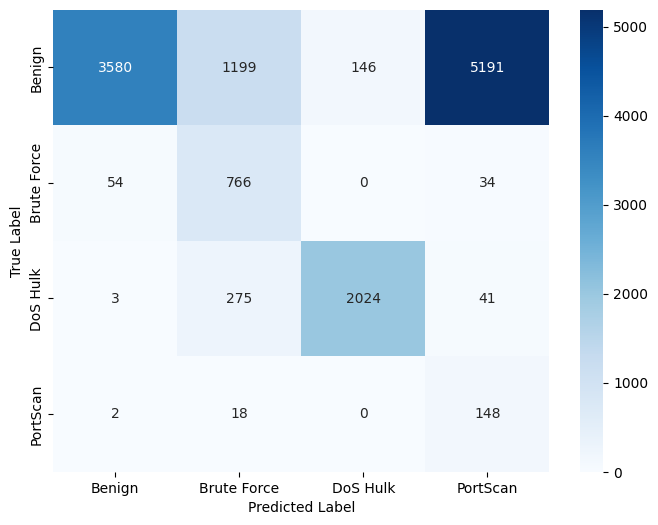

F1-score: 49.0704
Recall: 74.8913
Train Accuracy: 48.3495
Train Precision: 57.0770


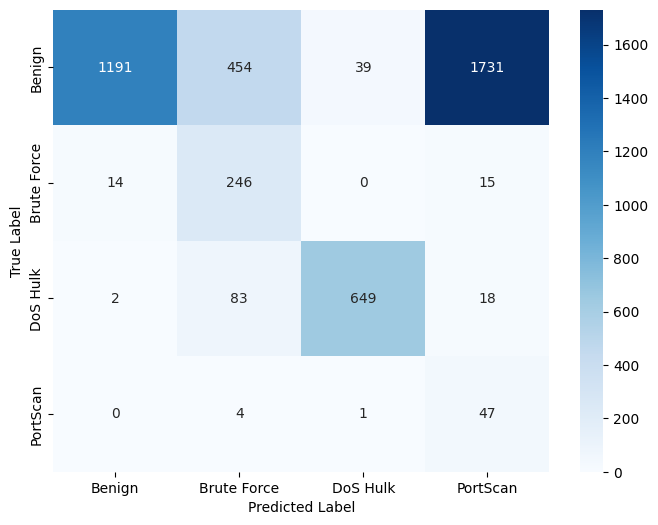

F1-score: 48.2464
Recall: 75.2545
Validation Accuracy: 47.4633
Validation Precision: 56.6805
Training took 8.4832 seconds to execute.


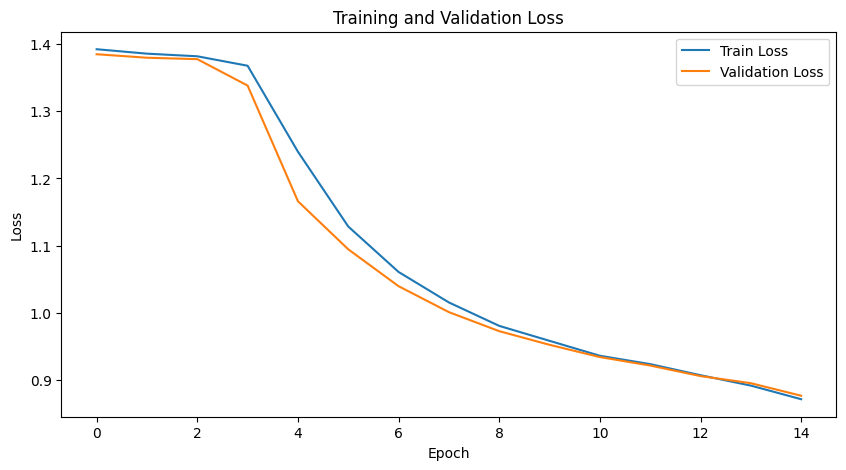

Neurons per layer: [8, 16, 2, 2, 2]


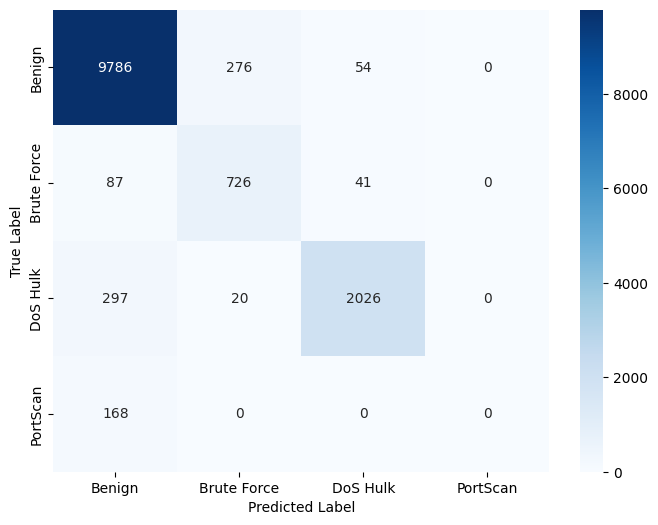

F1-score: 65.9643
Recall: 67.0550
Train Accuracy: 93.0050
Train Precision: 65.3047


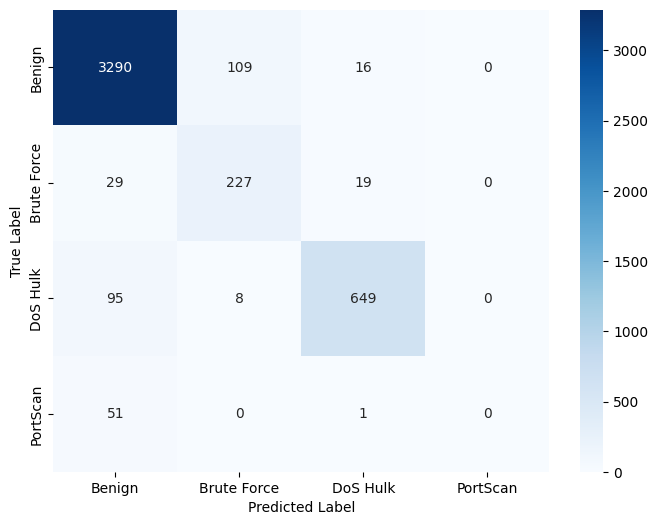

F1-score: 64.8277
Recall: 66.2971
Validation Accuracy: 92.7014
Validation Precision: 63.9206
Training took 9.1975 seconds to execute.


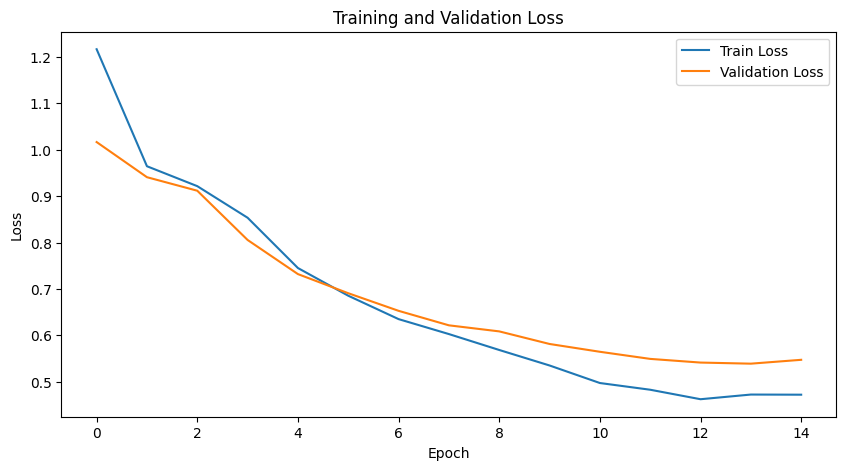

Neurons per layer: [2, 16, 32, 4, 32]


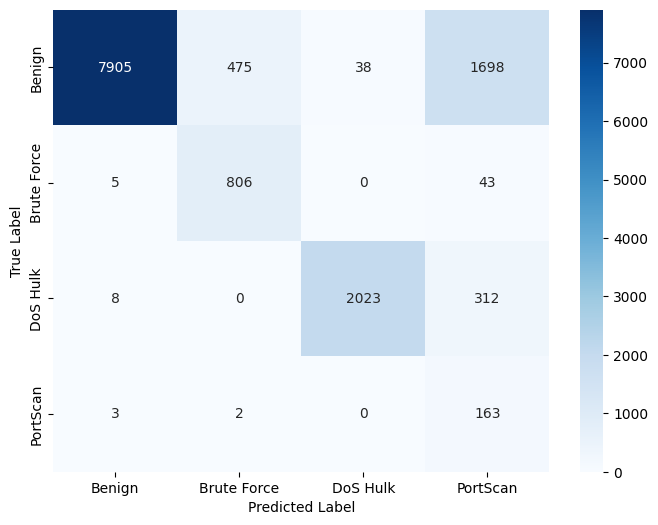

F1-score: 67.1579
Recall: 88.9723
Train Accuracy: 80.8323
Train Precision: 67.0328


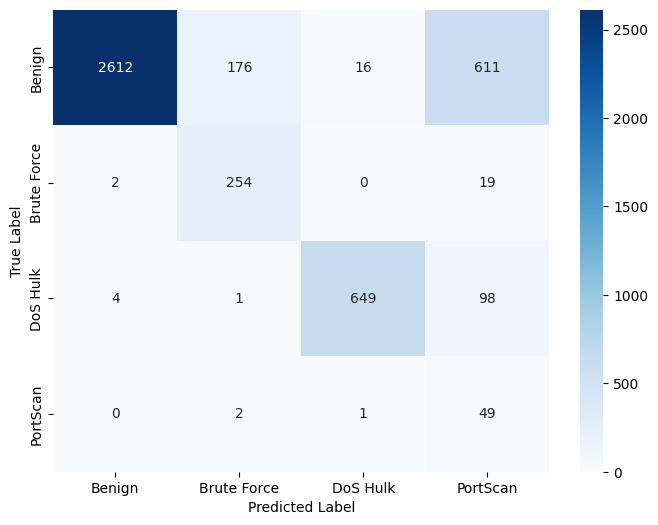

F1-score: 65.4252
Recall: 87.3459
Validation Accuracy: 79.3057
Validation Precision: 65.5463
Training took 8.6381 seconds to execute.


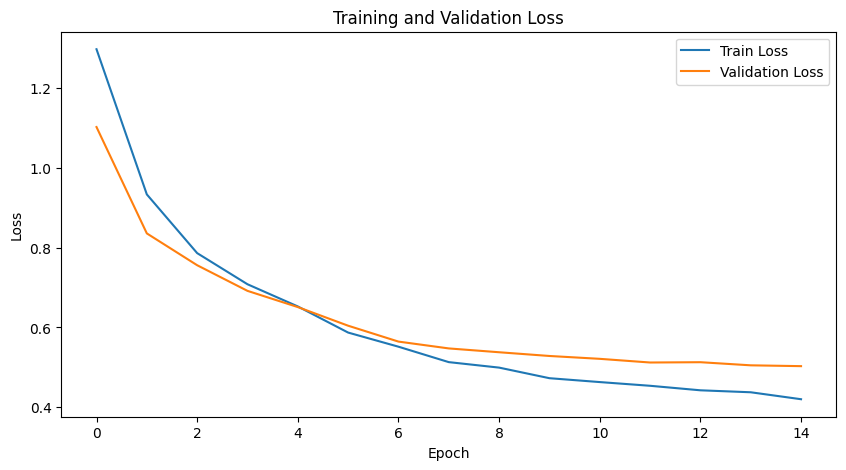

Neurons per layer: [2, 16, 32, 32]


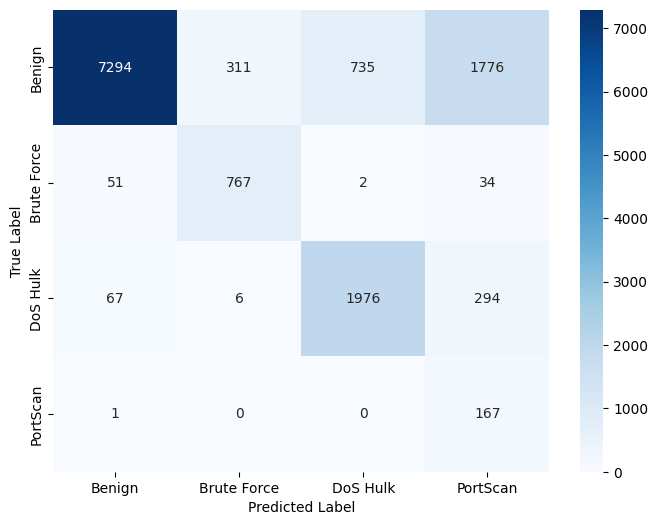

F1-score: 63.5586
Recall: 86.4143
Train Accuracy: 75.6917
Train Precision: 62.3348


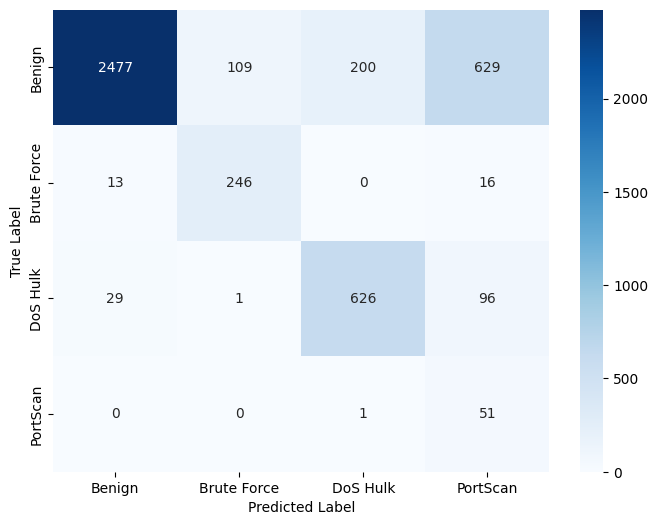

F1-score: 63.2081
Recall: 85.8273
Validation Accuracy: 75.6564
Validation Precision: 62.3921
Training took 6.7213 seconds to execute.


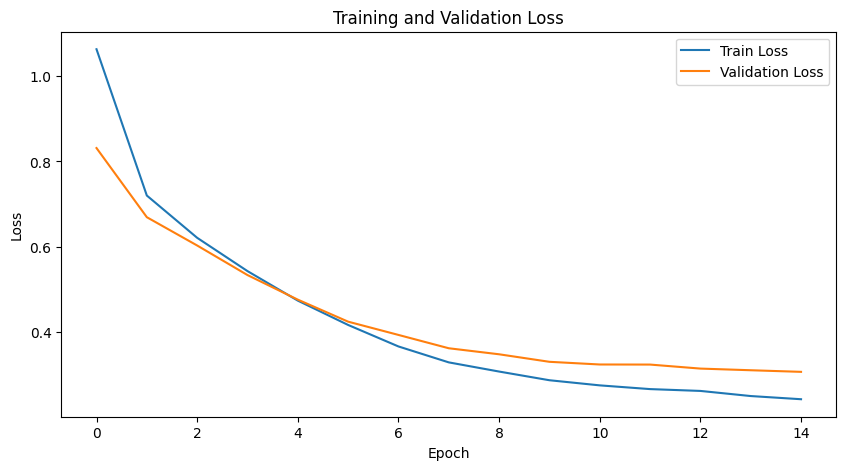

Neurons per layer: [32, 32]


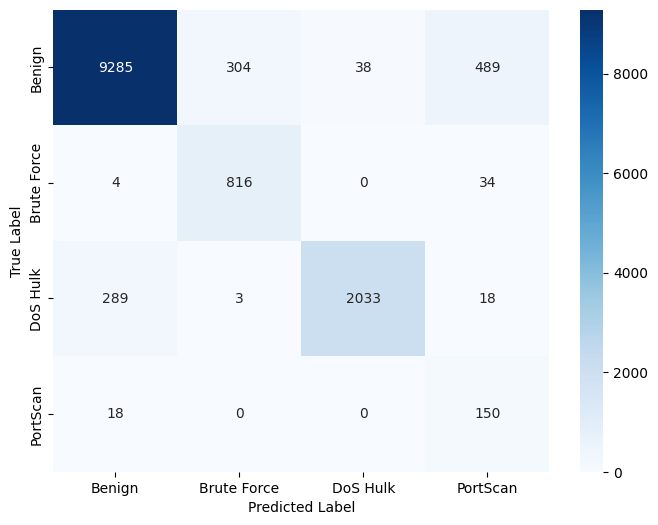

F1-score: 75.9491
Recall: 90.8476
Train Accuracy: 91.1208
Train Precision: 72.3236


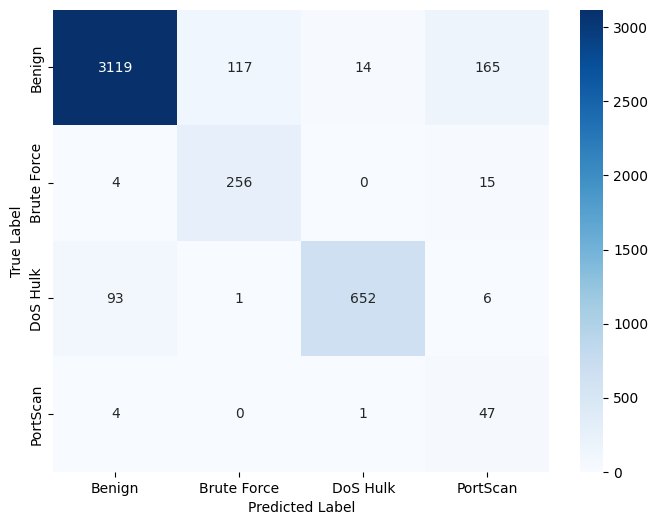

F1-score: 74.4463
Recall: 90.3775
Validation Accuracy: 90.6542
Validation Precision: 70.8088
Training took 7.2196 seconds to execute.


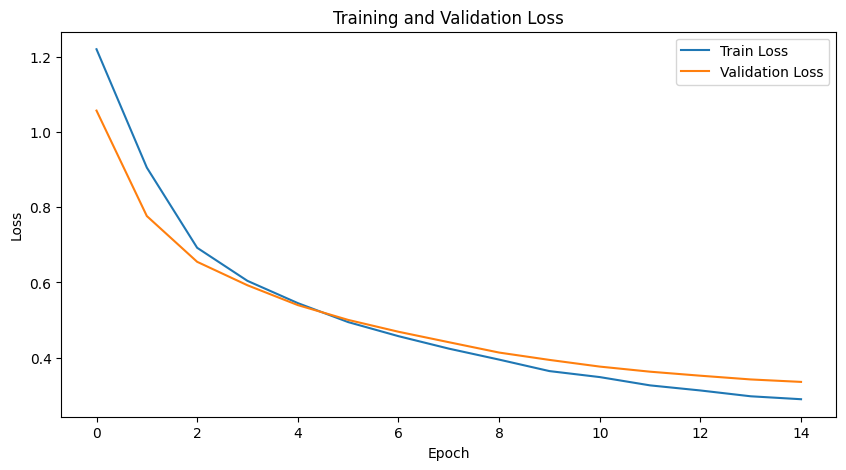

Neurons per layer: [16, 16]


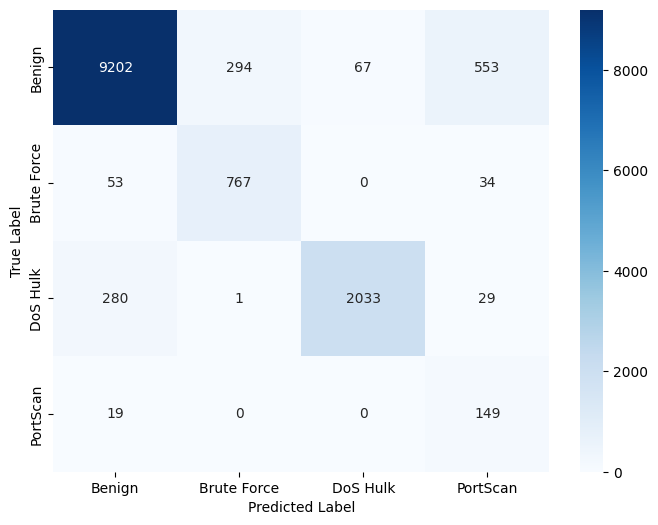

F1-score: 74.2703
Recall: 89.0593
Train Accuracy: 90.1343
Train Precision: 71.2061


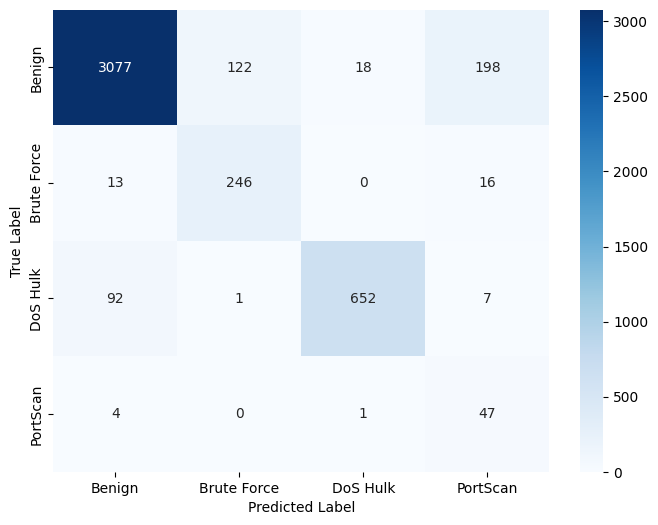

F1-score: 72.6596
Recall: 89.1609
Validation Accuracy: 89.4971
Validation Precision: 69.4878
Training took 9.3211 seconds to execute.


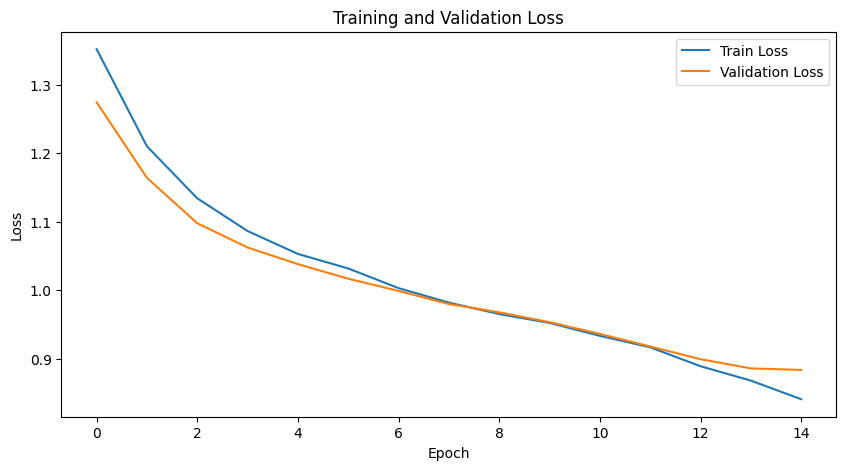

Neurons per layer: [32, 16, 4, 16, 2]


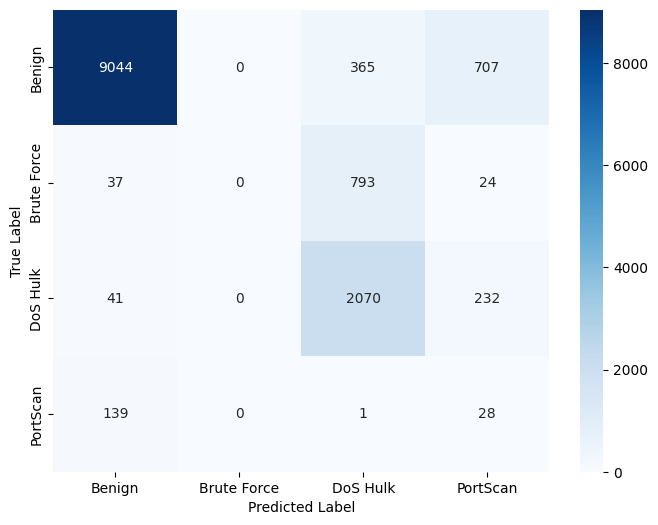

F1-score: 43.1199
Recall: 48.6045
Train Accuracy: 82.6497
Train Precision: 41.1472


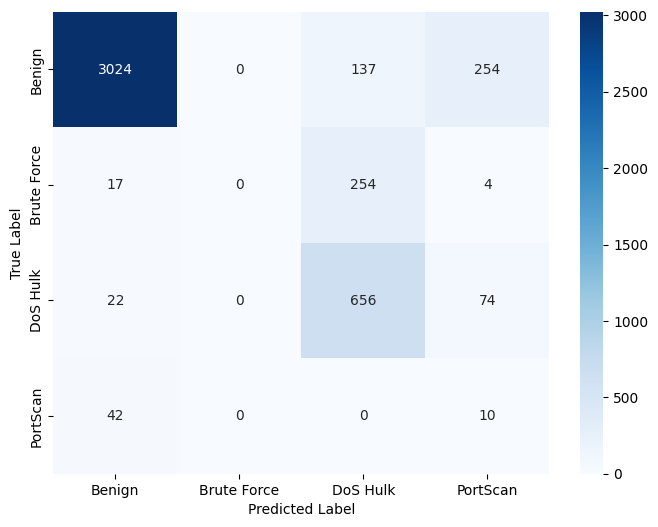

F1-score: 42.6916
Recall: 48.7538
Validation Accuracy: 82.1095
Validation Precision: 40.7426
Training took 8.2814 seconds to execute.


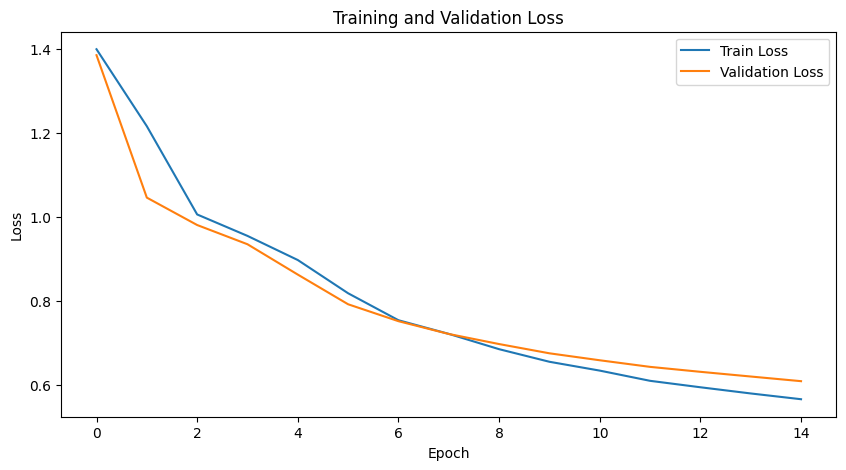

Neurons per layer: [8, 2, 8, 8]


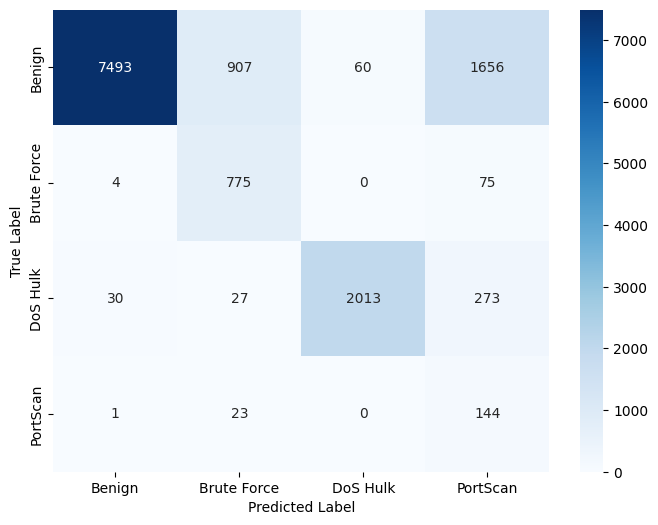

F1-score: 62.1193
Recall: 84.1125
Train Accuracy: 77.3311
Train Precision: 62.0226


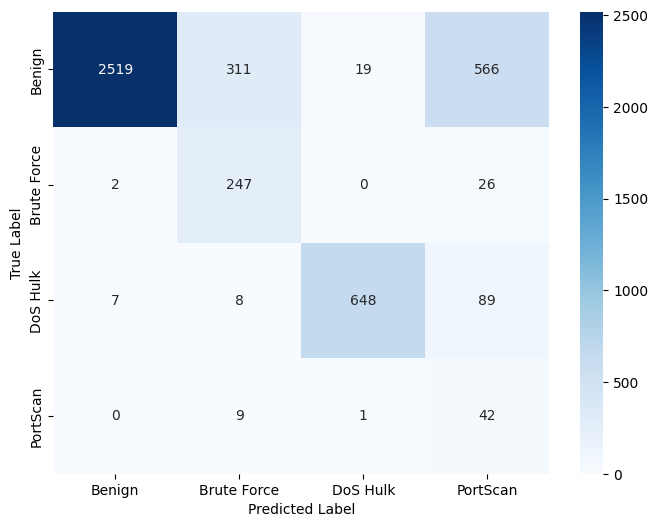

F1-score: 61.2490
Recall: 82.6301
Validation Accuracy: 76.9025
Validation Precision: 61.3539
Training took 6.8488 seconds to execute.


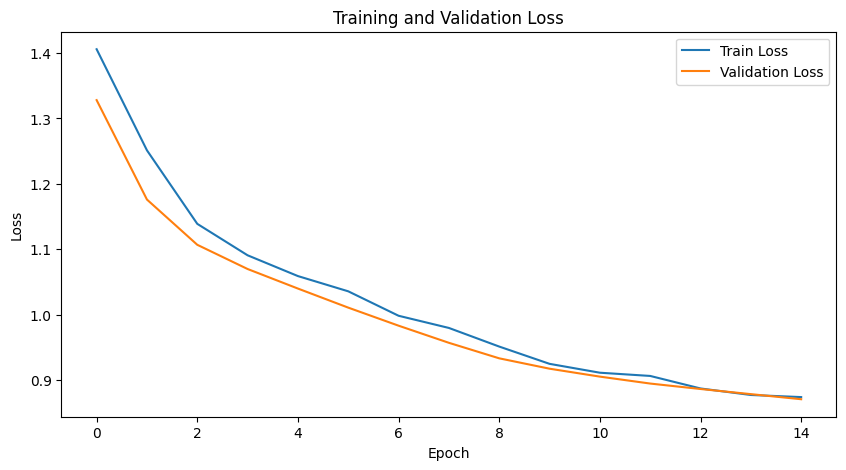

Neurons per layer: [4, 2]


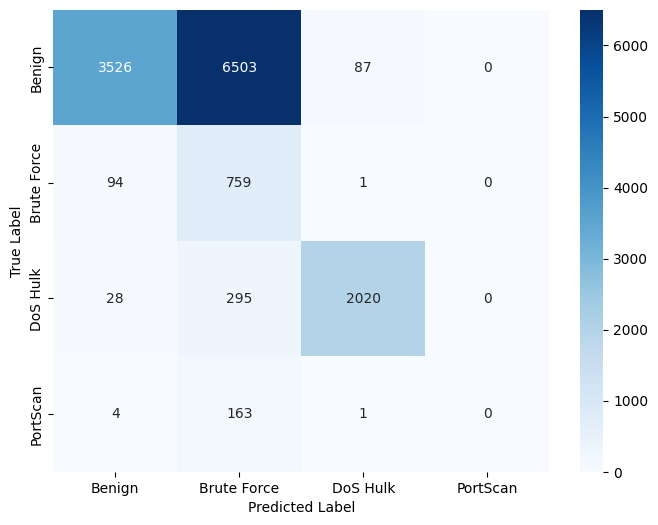

F1-score: 39.9177
Recall: 52.4865
Train Accuracy: 46.7695
Train Precision: 50.5404


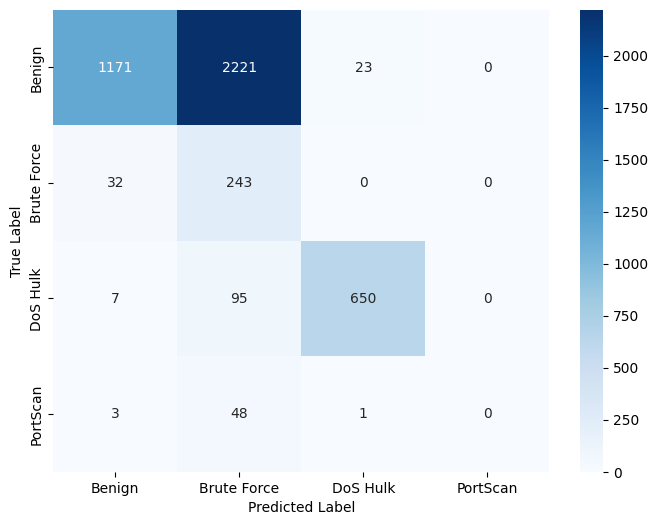

F1-score: 39.6581
Recall: 52.2724
Validation Accuracy: 45.9279
Validation Precision: 50.5744
Training took 8.7504 seconds to execute.


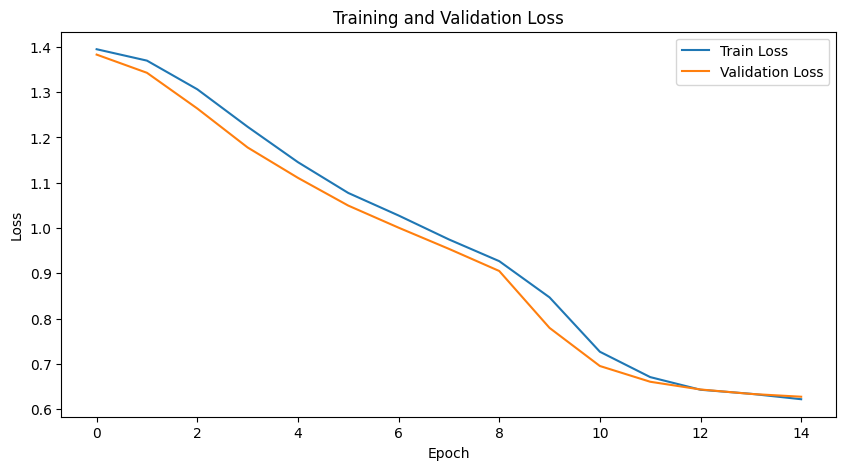

Neurons per layer: [4, 4, 8, 4]


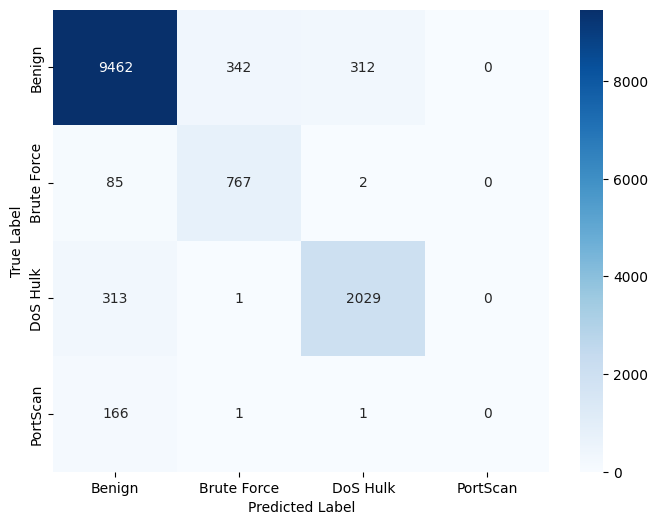

F1-score: 64.6497
Recall: 67.4865
Train Accuracy: 90.9280
Train Precision: 62.4932


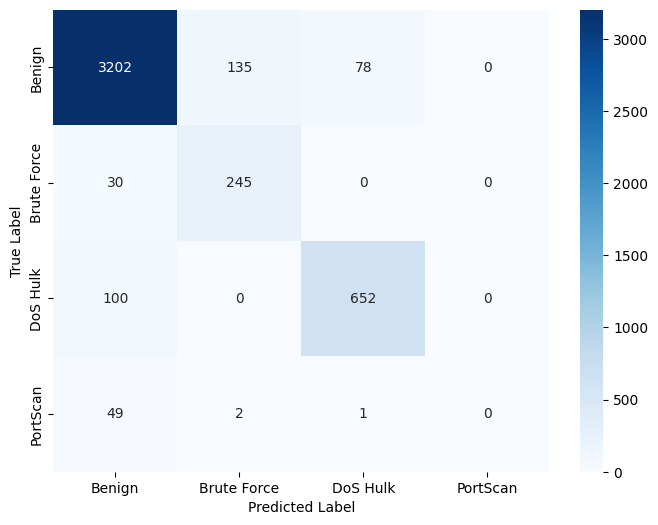

F1-score: 64.1858
Recall: 67.3890
Validation Accuracy: 91.2105
Validation Precision: 62.0087
Training took 14.4807 seconds to execute.


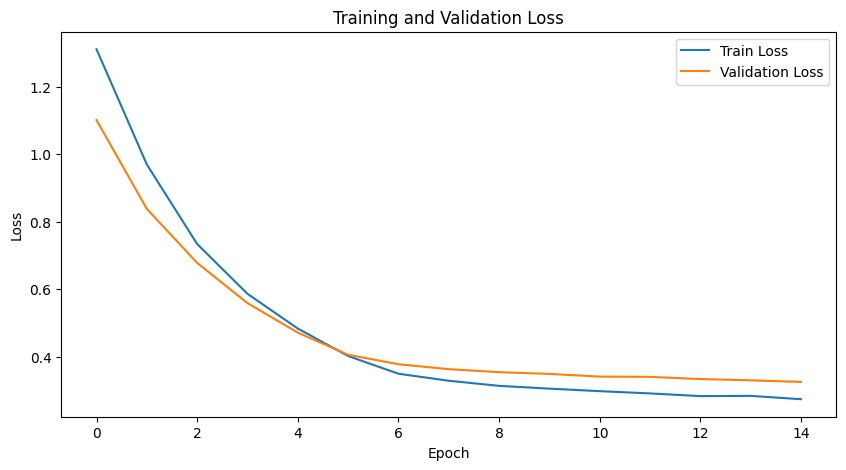

Neurons per layer: [32, 8, 8, 16]


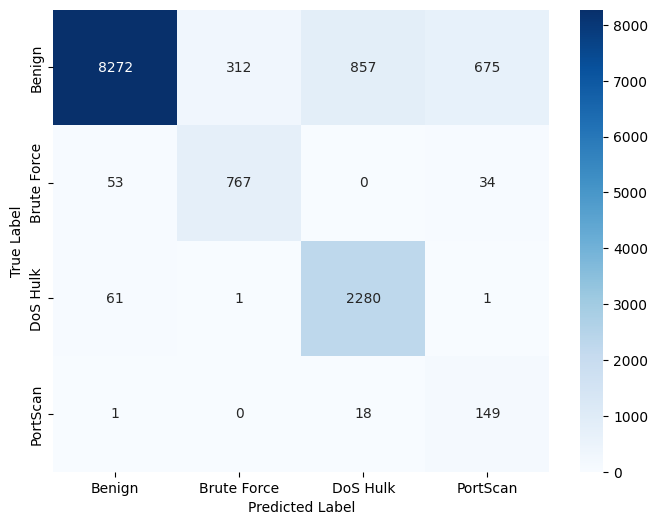

F1-score: 70.1715
Recall: 89.3964
Train Accuracy: 85.0679
Train Precision: 64.8148


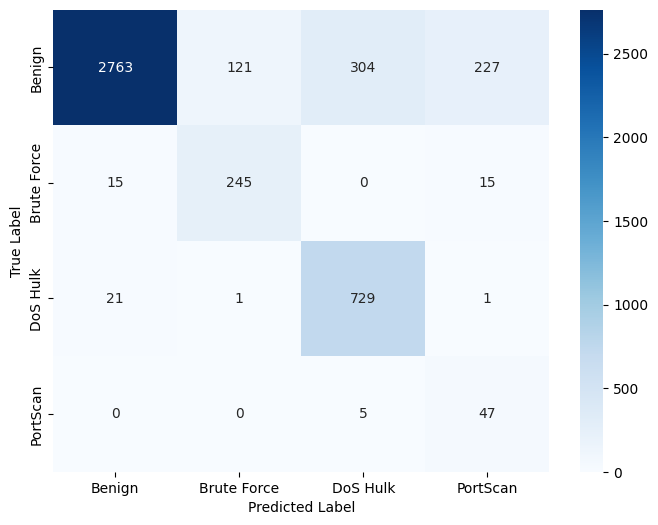

F1-score: 68.5475
Recall: 89.3312
Validation Accuracy: 84.2012
Validation Precision: 62.9774
Training took 14.3966 seconds to execute.


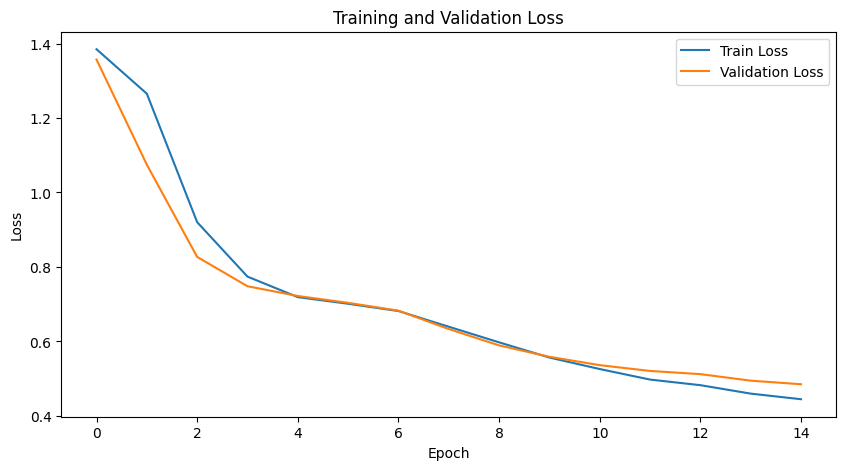

Neurons per layer: [4, 16, 4, 8, 8]


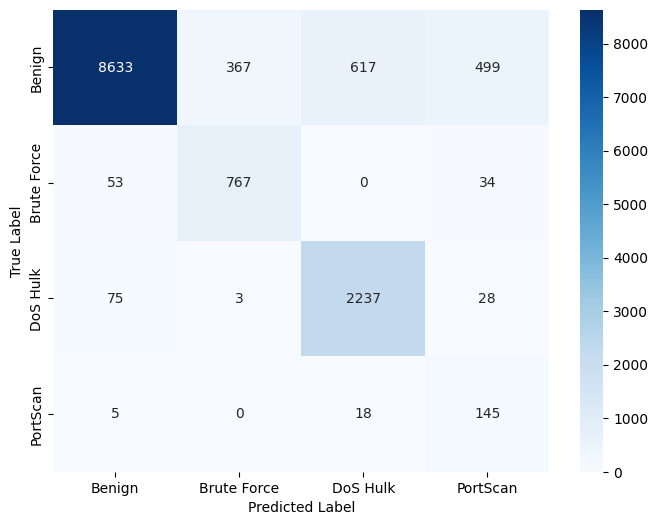

F1-score: 71.8650
Recall: 89.2345
Train Accuracy: 87.3971
Train Precision: 66.0923


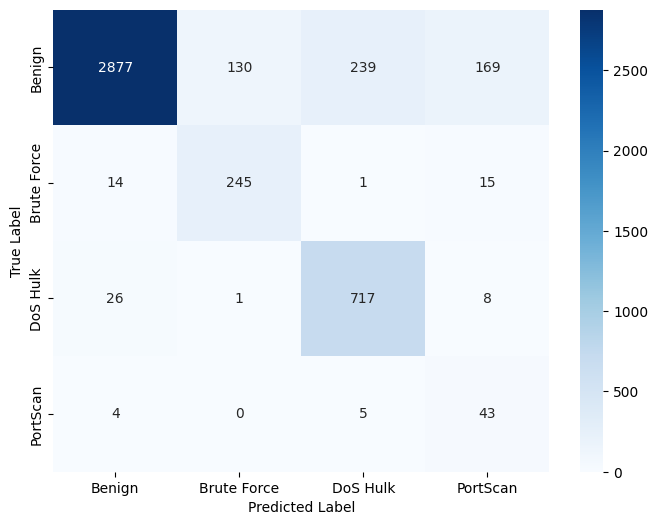

F1-score: 69.9281
Recall: 87.8437
Validation Accuracy: 86.3818
Validation Precision: 64.1208
Training took 9.4049 seconds to execute.


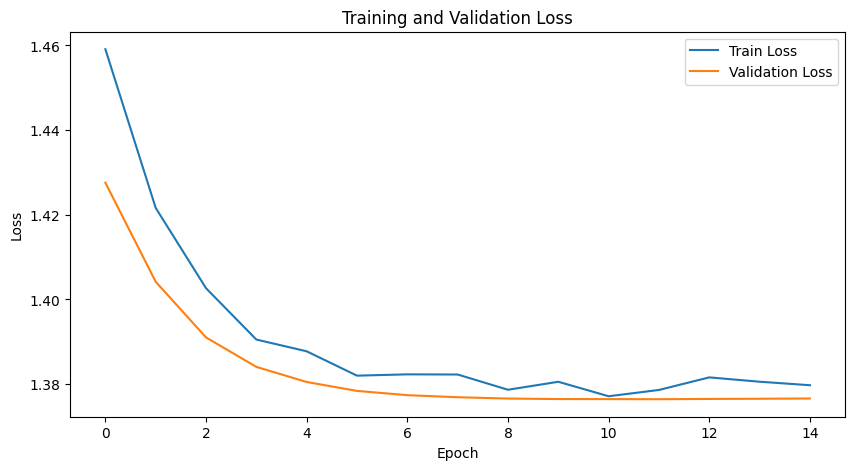

Neurons per layer: [4, 4, 32, 2, 2]


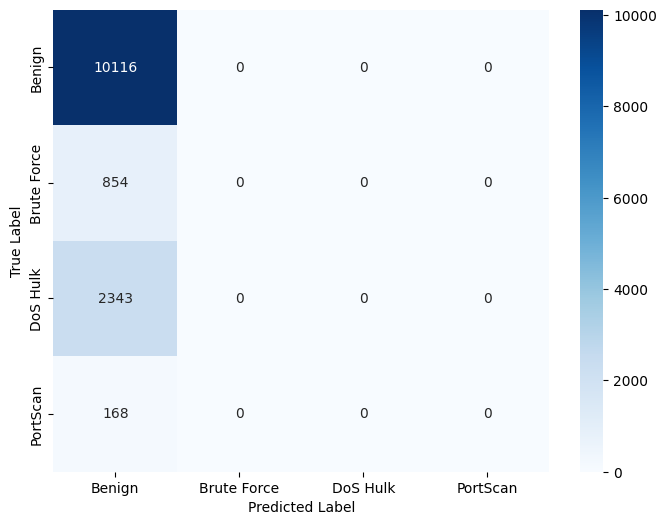

F1-score: 21.4349
Recall: 25.0000
Train Accuracy: 75.0389
Train Precision: 18.7597


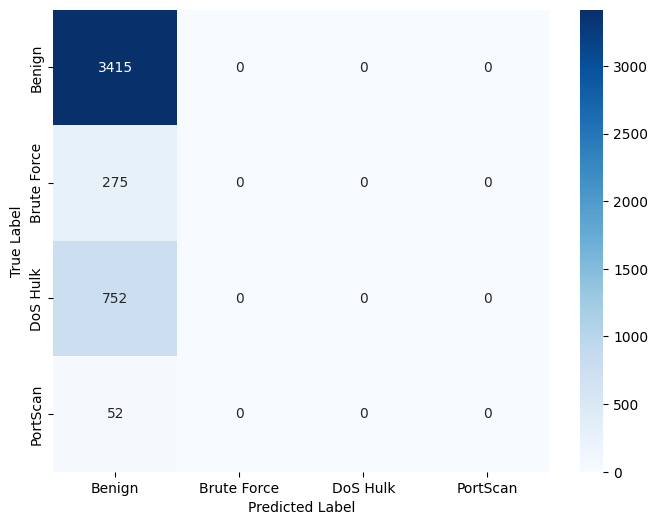

F1-score: 21.5893
Recall: 25.0000
Validation Accuracy: 75.9902
Validation Precision: 18.9976
Training took 8.7573 seconds to execute.


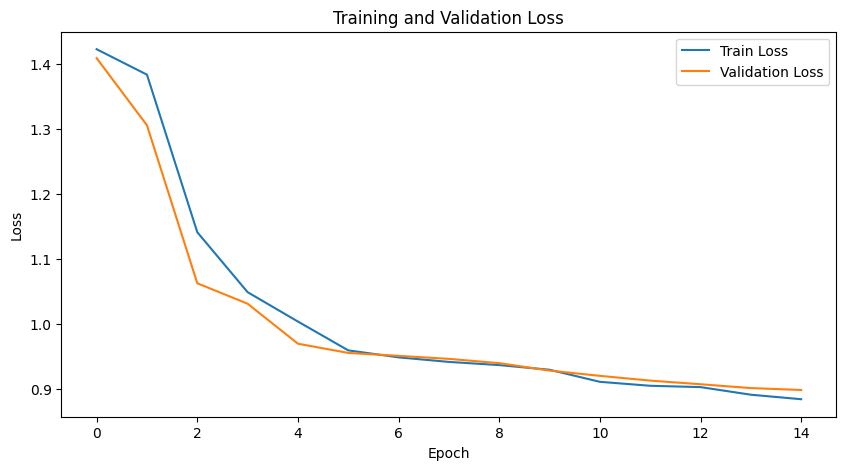

Neurons per layer: [4, 4, 8, 2]


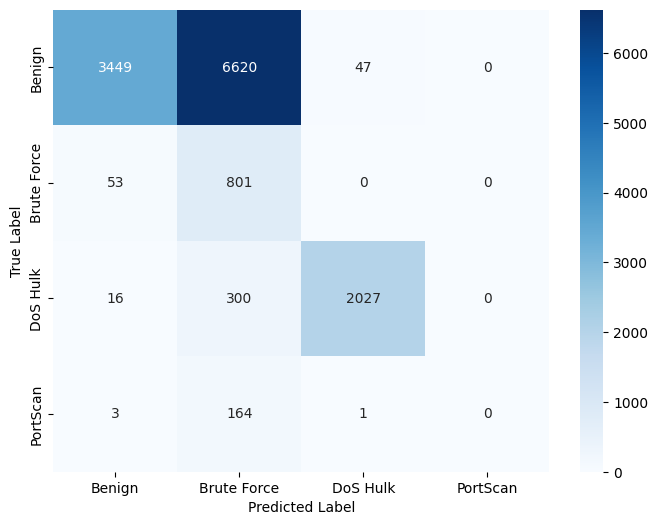

F1-score: 40.1689
Recall: 53.6004
Train Accuracy: 46.5618
Train Precision: 51.4501


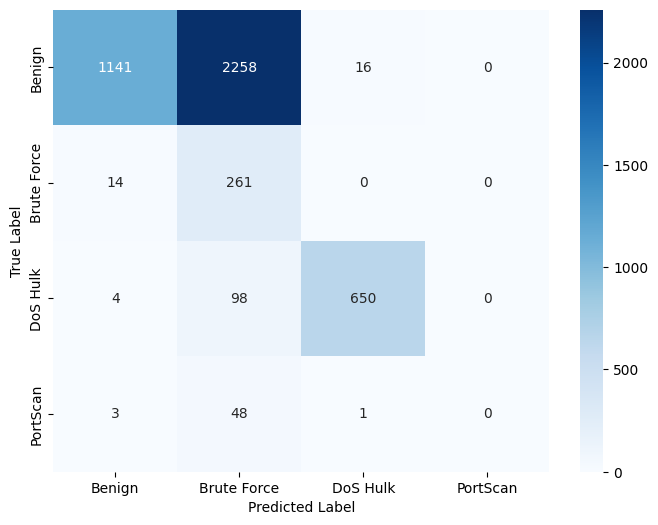

F1-score: 39.8067
Recall: 53.6892
Validation Accuracy: 45.6609
Validation Precision: 51.3594


In [ ]:
num_epochs = 15 #low just to test
results = []

for i in range(no_candidates):
  performance = []
  layer_sizes = candidates[i]
  input_size = 15
  output_size = 4

  model = DeepFFNN(input_size, layer_sizes, output_size).to(device)
  optimizer = optim.AdamW(model.parameters(), lr=0.0005)
  training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
  print("Neurons per layer:", layer_sizes)
  train_accuracy,train_prec, train_f1 = testing_model(model,train_loader,device)
  print(f'Train Accuracy: {train_accuracy:.4f}')
  print(f'Train Precision: {train_prec:.4f}')
  val_accuracy, val_prec, val_f1 = testing_model(model,val_loader,device)
  print(f'Validation Accuracy: {val_accuracy:.4f}')
  print(f'Validation Precision: {val_prec:.4f}')
  performance.append(layer_sizes)
  performance.append(train_accuracy)
  performance.append(train_prec)
  performance.append(train_f1)
  performance.append(val_accuracy)
  performance.append(val_prec)
  performance.append(val_f1)
  results.append(performance)

In [ ]:
print("layer sizes, tr_acc, tr_pr, tr_f1, va_acc, va_pr, va_f1")
print("-------------")
for i in range(no_candidates):
  print(f"[{i}]{results[i]}")

layer sizes, tr_acc, tr_pr, tr_f1, va_acc, va_pr, va_f1
-------------
[0][[4, 2, 16], 84.28899933239374, 66.65046558704968, 68.33511285393146, 83.40008900756565, 65.1009010878891, 66.77159307038878]
[1][[4, 32, 16, 16, 2], 87.44158445219198, 58.0323986526375, 59.175416891936116, 86.58210947930573, 57.433013333065745, 58.443276492095606]
[2][[2, 8, 4, 16], 76.01068170017061, 56.87523970317332, 59.25677444951276, 75.10013351134846, 56.101037266145916, 57.848830760537126]
[3][[8, 4, 2], 89.57050663897337, 46.34730396127822, 46.33598094801782, 90.1646639964397, 46.575209643605874, 46.49563697220864]
[4][[32, 4, 2, 8, 8], 85.53519768563163, 69.9555334371407, 70.52719922101595, 85.02447708055185, 68.6328359638024, 69.34246952720822]
[5][[32, 16, 32], 91.58816111564424, 72.650104306391, 79.20891855841832, 90.36493101913663, 69.92965681946872, 76.66762786075975]
[6][[4, 4, 16], 88.49491877457162, 67.92848997909067, 72.00913454384602, 88.00623052959502, 66.50391802314093, 70.23344196869823]
[7]

Epoch 20/50, Train Loss: 0.2077, Val Loss: 0.3078
Epoch 40/50, Train Loss: 0.1827, Val Loss: 0.3079
Training took 27.1269 seconds to execute.


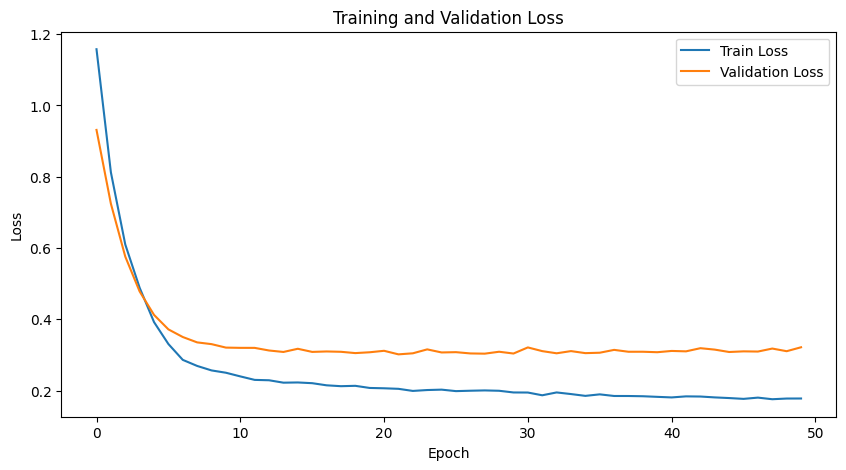

Neurons per layer: [32, 16, 32]


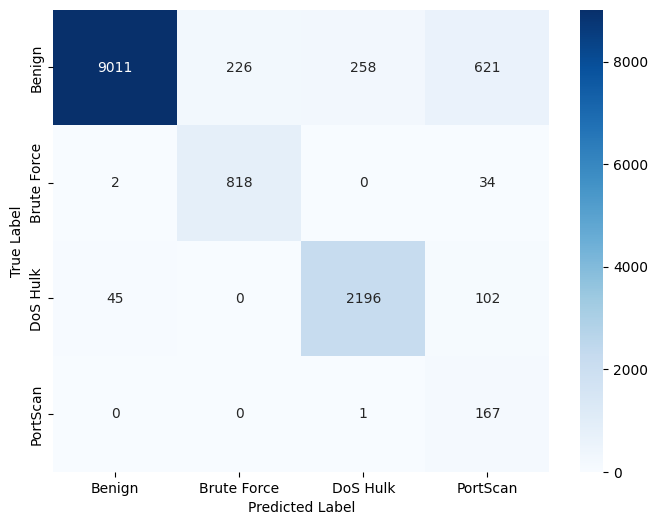

F1-score: 75.5780
Recall: 94.4980
Train Accuracy: 90.4384
Train Precision: 71.3393


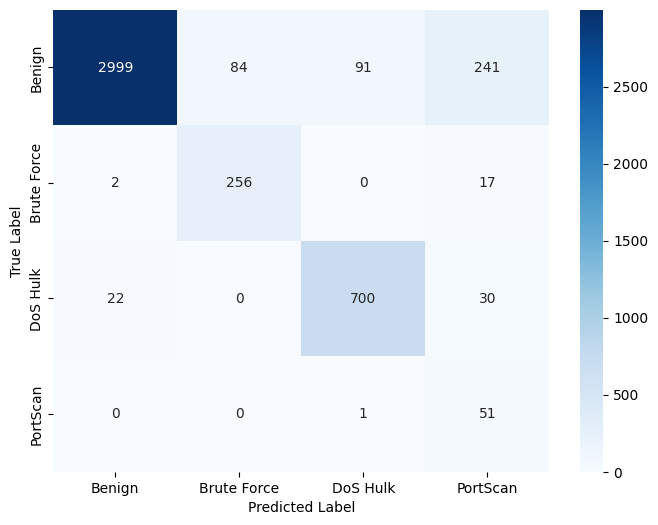

F1-score: 73.2945
Recall: 93.0178
Validation Accuracy: 89.1411
Validation Precision: 69.4821


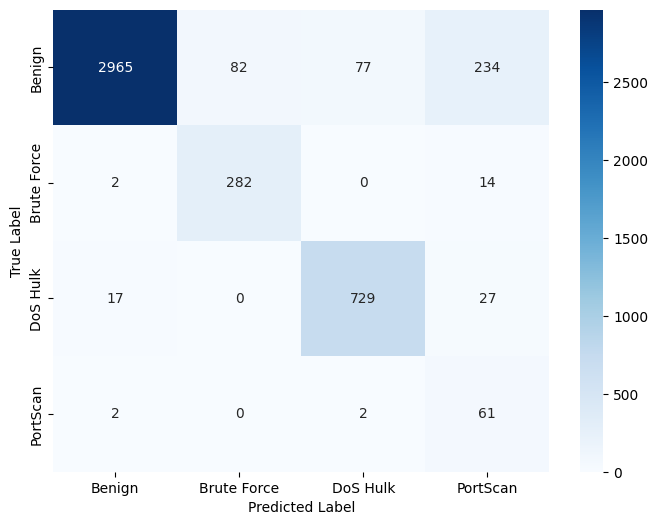

F1-score: 75.3286
Recall: 92.7704
Test Accuracy: 89.8309
Test Precision: 71.2867
Epoch 20/50, Train Loss: 0.3036, Val Loss: 0.3556
Epoch 40/50, Train Loss: 0.2322, Val Loss: 0.2927
Training took 26.1509 seconds to execute.


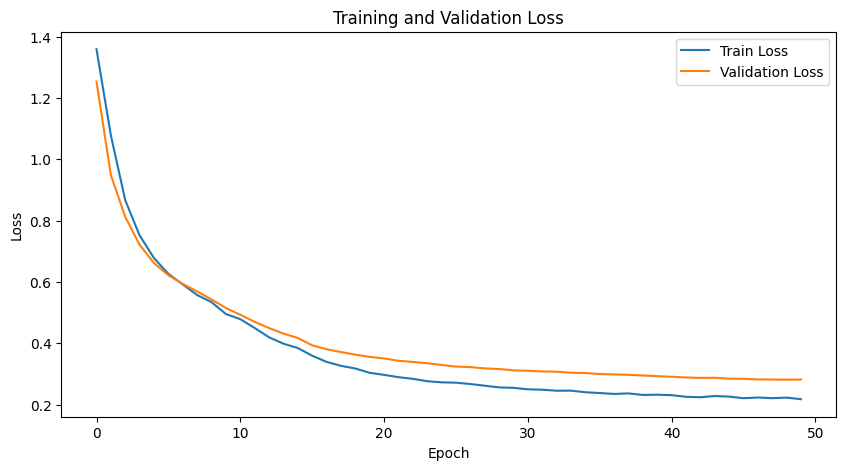

Neurons per layer: [16, 8]


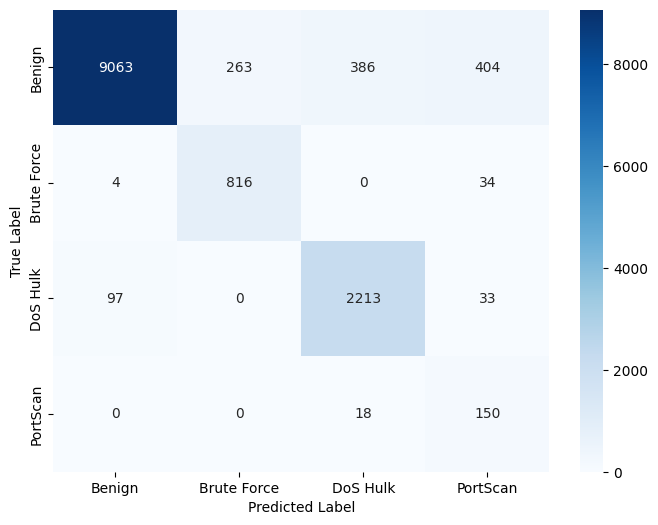

F1-score: 76.4249
Recall: 92.2196
Train Accuracy: 90.8093
Train Precision: 70.8101


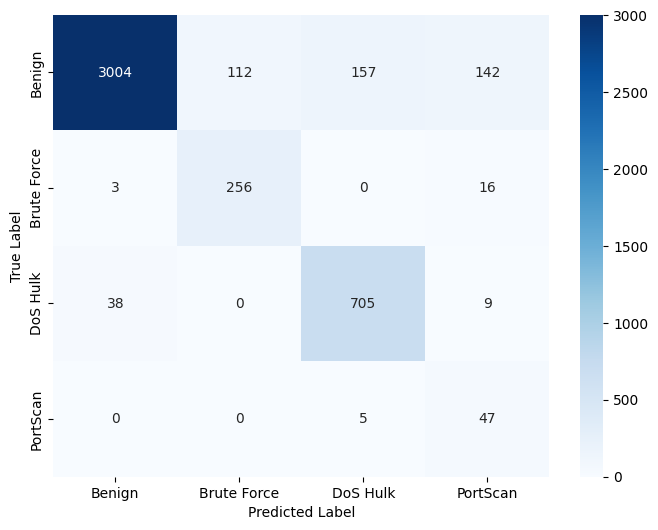

F1-score: 73.7647
Recall: 91.2976
Validation Accuracy: 89.2746
Validation Precision: 67.8741


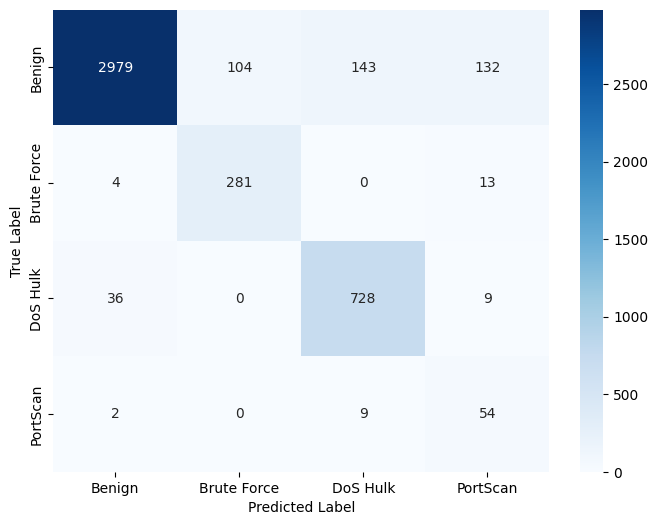

F1-score: 75.8317
Recall: 90.0661
Test Accuracy: 89.9421
Test Precision: 70.0714
Epoch 20/50, Train Loss: 0.2295, Val Loss: 0.2957
Epoch 40/50, Train Loss: 0.1928, Val Loss: 0.2967
Training took 28.0311 seconds to execute.


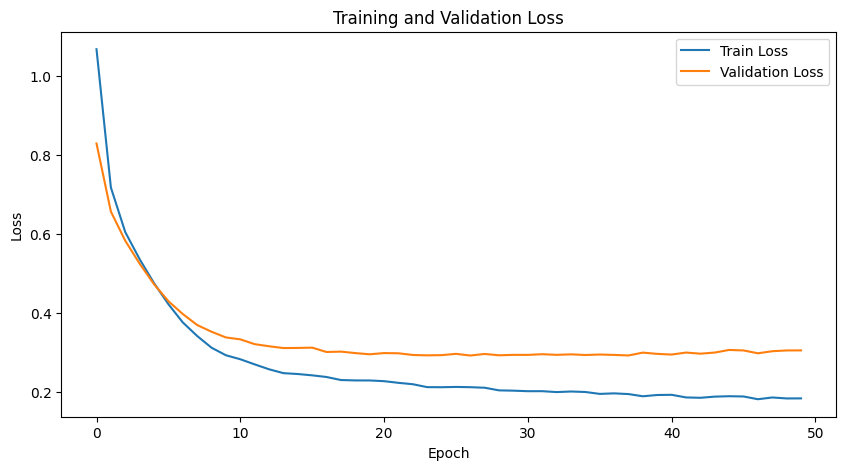

Neurons per layer: [32, 32]


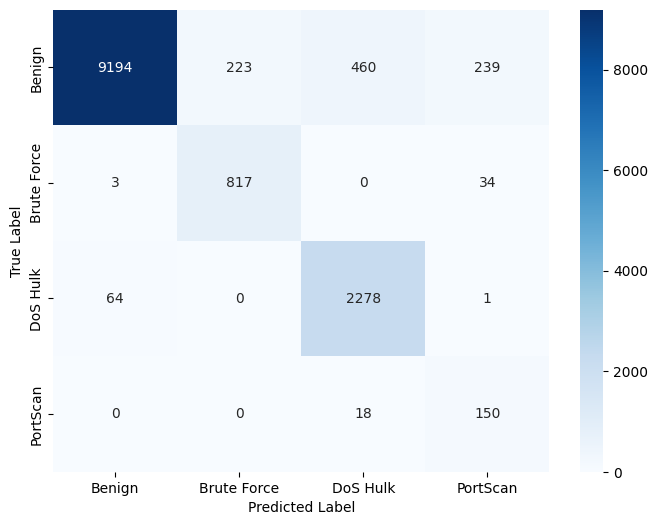

F1-score: 80.2987
Recall: 93.2662
Train Accuracy: 92.2706
Train Precision: 73.9669


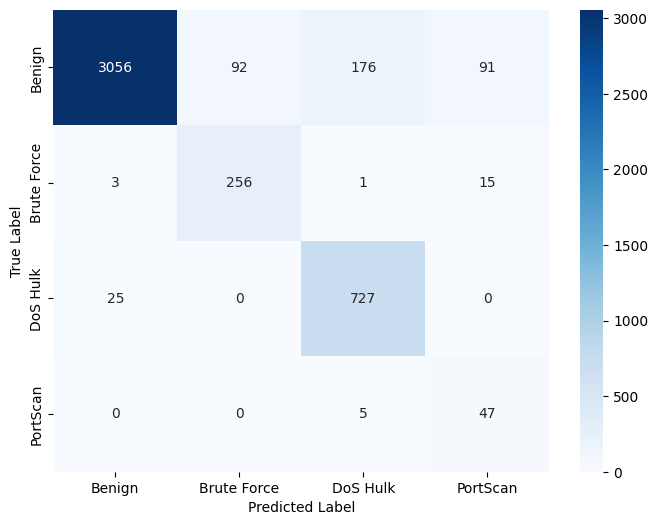

F1-score: 77.4049
Recall: 92.4097
Validation Accuracy: 90.9212
Validation Precision: 70.8381


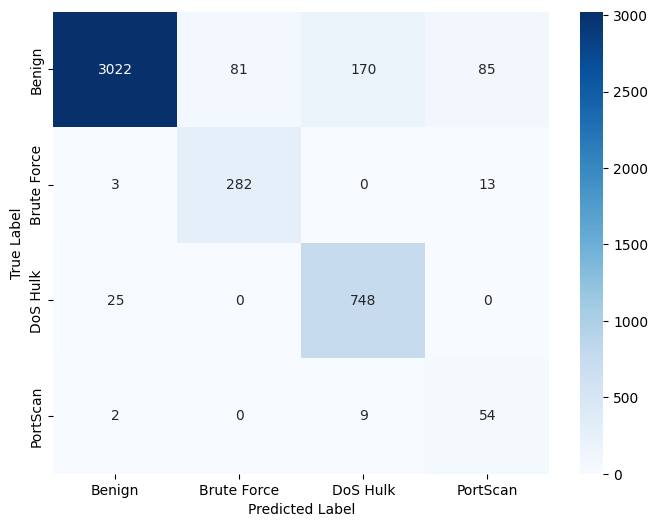

F1-score: 79.3463
Recall: 91.1169
Test Accuracy: 91.3663
Test Precision: 73.2299


In [ ]:
#based on validation we pick the 3 best f1-score because of class imbalance 26, 15, 0
best = [5, 13, 20]
num_epochs = 50 #full test now
results = []

for j in best:
  performance = []
  layer_sizes = candidates[j]
  input_size = 15
  output_size = 4

  model = DeepFFNN(input_size, layer_sizes, output_size).to(device)
  optimizer = optim.AdamW(model.parameters(), lr=0.0005)
  training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
  print("Neurons per layer:", layer_sizes)
  train_accuracy,train_prec, train_f1 = testing_model(model,train_loader,device)
  print(f'Train Accuracy: {train_accuracy:.4f}')
  print(f'Train Precision: {train_prec:.4f}')
  val_accuracy, val_prec, val_f1 = testing_model(model,val_loader,device)
  print(f'Validation Accuracy: {val_accuracy:.4f}')
  print(f'Validation Precision: {val_prec:.4f}')
  test_accuracy, test_prec, test_f1 = testing_model(model,test_loader,device)
  print(f'Test Accuracy: {test_accuracy:.4f}')
  print(f'Test Precision: {test_prec:.4f}')
  performance.append(layer_sizes)
  performance.append(train_accuracy)
  performance.append(train_prec)
  performance.append(train_f1)
  performance.append(val_accuracy)
  performance.append(val_prec)
  performance.append(val_f1)
  performance.append(test_accuracy)
  performance.append(test_prec)
  performance.append(test_f1)
  results.append(performance)

In [ ]:
#we pick the best test set F1-score because we care about overall classification performance
print("layer sizes, tr_acc, tr_pr, tr_f1, va_acc, va_pr, va_f1, te_acc, te_pr, te_f1")
print("-------------")
for i in range(len(best)):
  print(f"[{i}]{results[i]}")

layer sizes, tr_acc, tr_pr, tr_f1, va_acc, va_pr, va_f1, te_acc, te_pr, te_f1
-------------
[0][[32, 16, 32], 90.43839477783547, 71.33932674711339, 75.57802031140801, 89.14107699154428, 69.48207262184495, 73.29453588601848, 89.83088562527814, 71.28669491798293, 75.32864435649812]
[1][[16, 8], 90.80928714487055, 70.81012648142351, 76.42488929824995, 89.2745883400089, 67.87406087103403, 73.76474705980804, 89.942145082332, 70.07138901317154, 75.83174366958278]
[2][[32, 32], 92.2706030709888, 73.96690250788728, 80.29874470011178, 90.92122830440587, 70.8380646590243, 77.40487743855444, 91.36626613262128, 73.2299258368904, 79.34625540267469]


In [ ]:
layer_sizes = [32, 32]
num_epochs = 50

*The impact of batch size*

Epoch 20/50, Train Loss: 0.1243, Val Loss: 0.1434
Epoch 40/50, Train Loss: 0.1198, Val Loss: 0.1386
Training took 1206.8615 seconds to execute.


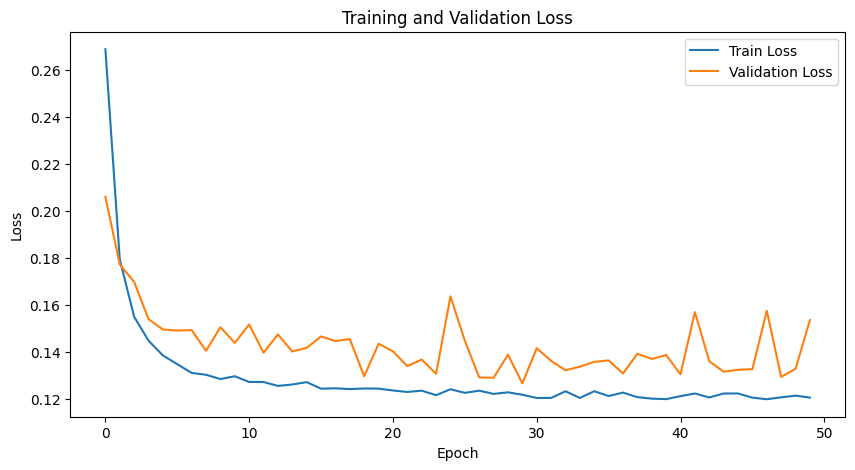

Neurons per layer: [32, 32]


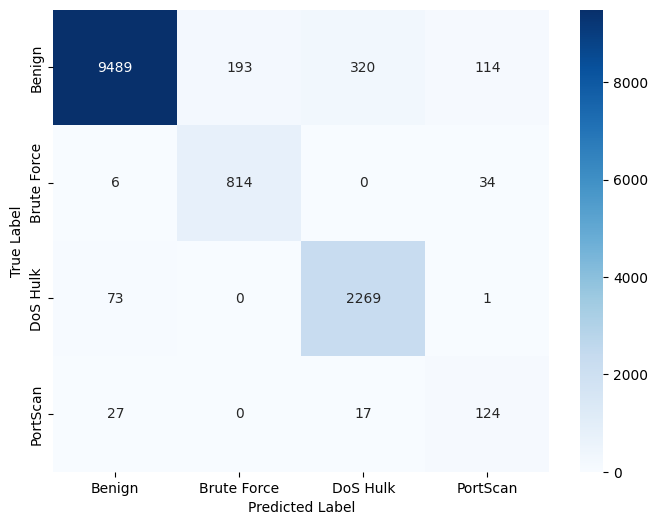

F1-score: 82.9231
Recall: 89.9423
Train Accuracy: 94.1770
Train Precision: 78.0547


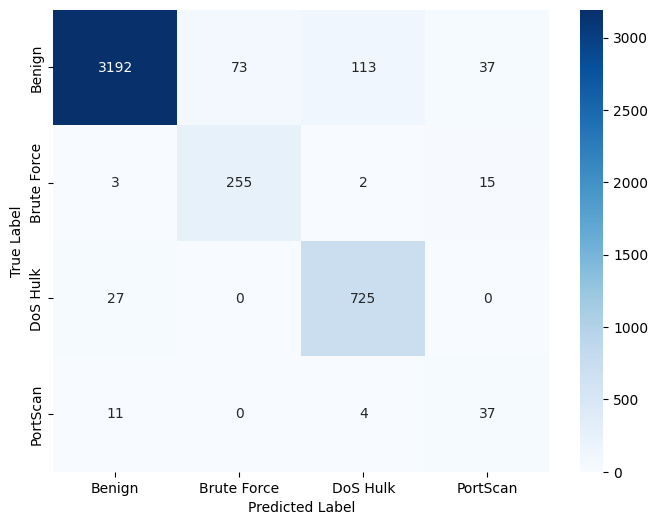

F1-score: 80.9851
Recall: 88.4402
Validation Accuracy: 93.6582
Validation Precision: 75.9873


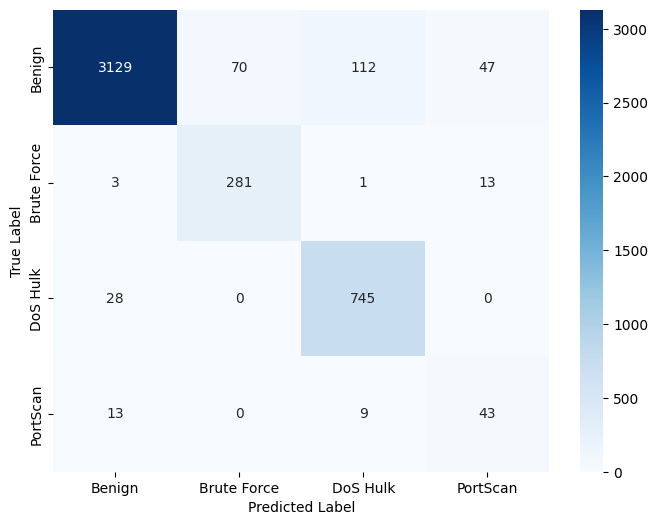

F1-score: 81.1147
Recall: 87.5018
Test Accuracy: 93.4134
Test Precision: 76.5866


In [ ]:
#Batch size: 1
best_batch = None
best_f1_batch = 0

train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=1, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

model = DeepFFNN(input_size, layer_sizes, output_size).to(device)
optimizer = optim.AdamW(model.parameters(), lr=0.0005)
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
print("Neurons per layer:", layer_sizes)
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
val_accuracy, val_prec, val_f1 = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')
if val_f1 > best_f1_batch:
  best_f1_batch = val_f1
  best_batch = 1

Epoch 20/50, Train Loss: 0.2100, Val Loss: 0.2651
Epoch 40/50, Train Loss: 0.1827, Val Loss: 0.2559
Training took 44.7575 seconds to execute.


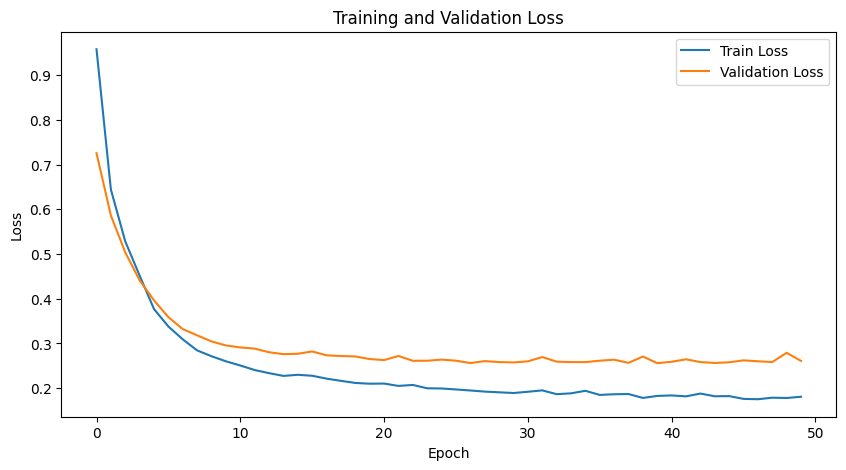

Neurons per layer: [32, 32]


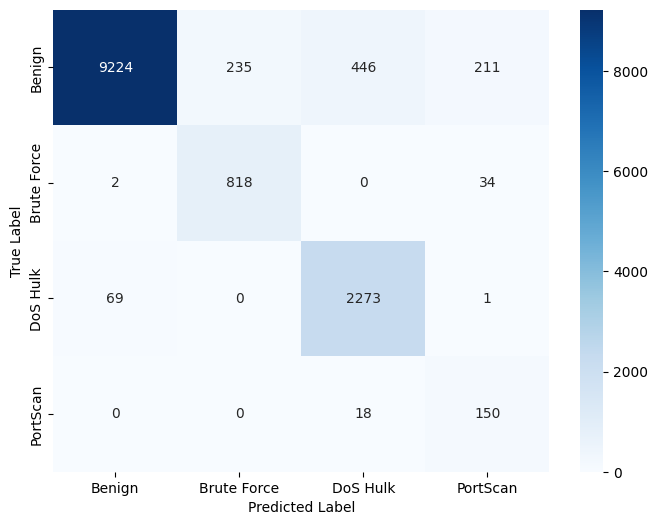

F1-score: 80.8769
Recall: 93.3162
Train Accuracy: 92.4635
Train Precision: 74.4612


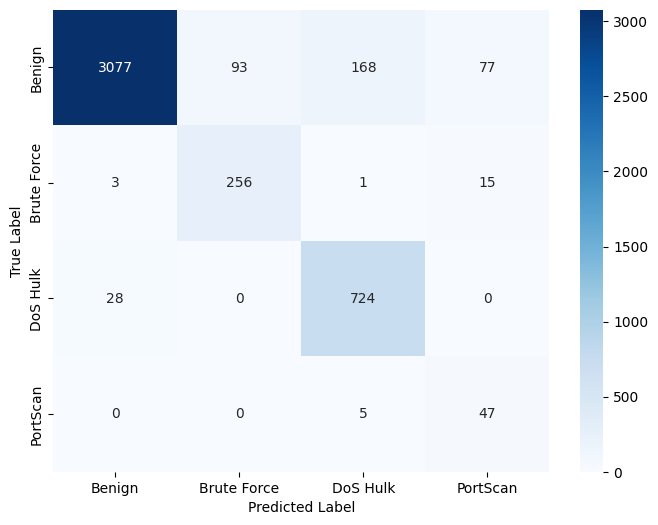

F1-score: 78.3417
Recall: 92.4637
Validation Accuracy: 91.3218
Validation Precision: 71.6979


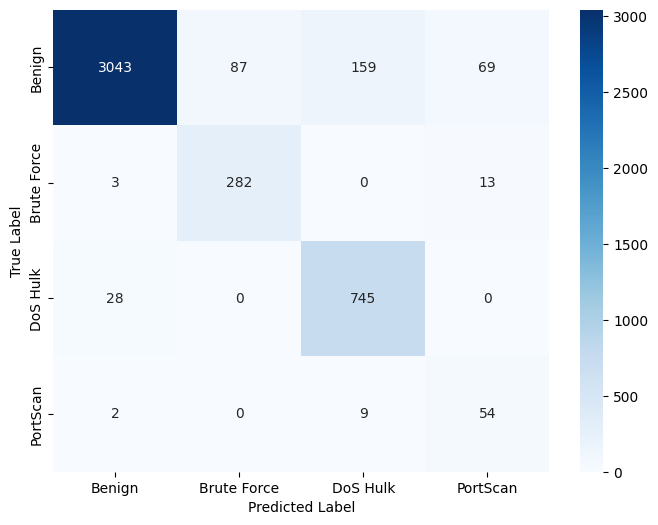

F1-score: 80.3138
Recall: 91.1762
Test Accuracy: 91.7668
Test Precision: 74.1637


In [ ]:
#Batch size: 32
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)

model = DeepFFNN(input_size, layer_sizes, output_size).to(device)
optimizer = optim.AdamW(model.parameters(), lr=0.0005)
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
print("Neurons per layer:", layer_sizes)
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
val_accuracy, val_prec, val_f1 = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')
if val_f1 > best_f1_batch:
  best_f1_batch = val_f1
  best_batch = 32

Epoch 20/50, Train Loss: 0.2339, Val Loss: 0.3139
Epoch 40/50, Train Loss: 0.1981, Val Loss: 0.3177
Training took 26.3490 seconds to execute.


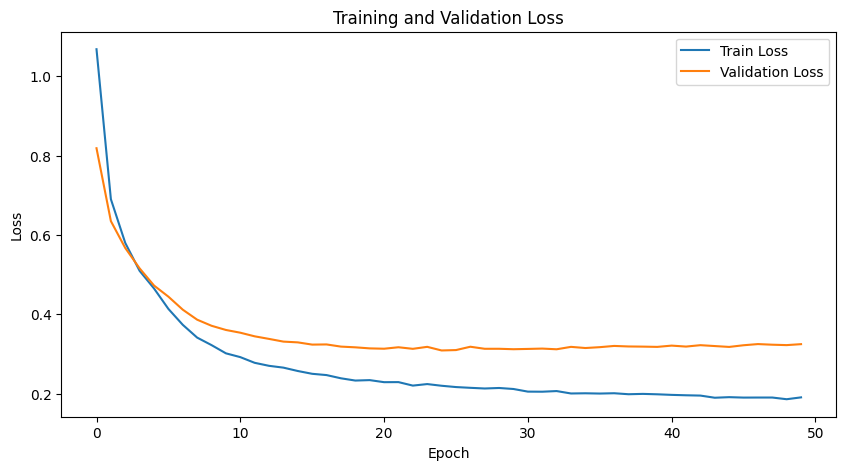

Neurons per layer: [32, 32]


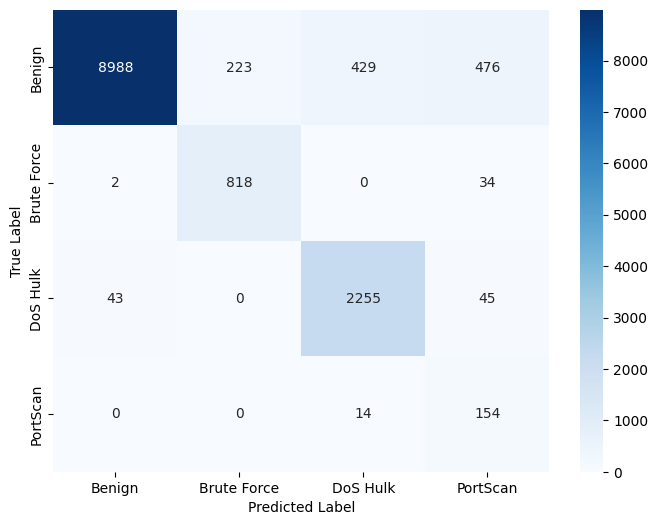

F1-score: 76.1982
Recall: 93.1362
Train Accuracy: 90.6090
Train Precision: 70.8453


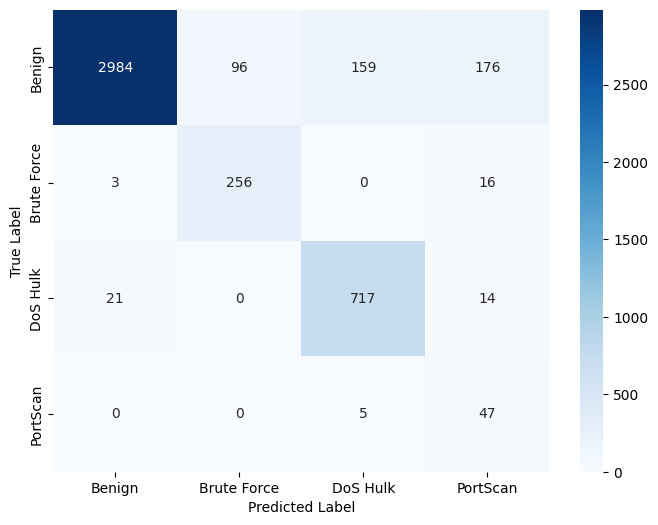

F1-score: 73.3021
Recall: 91.5501
Validation Accuracy: 89.0966
Validation Precision: 67.9728


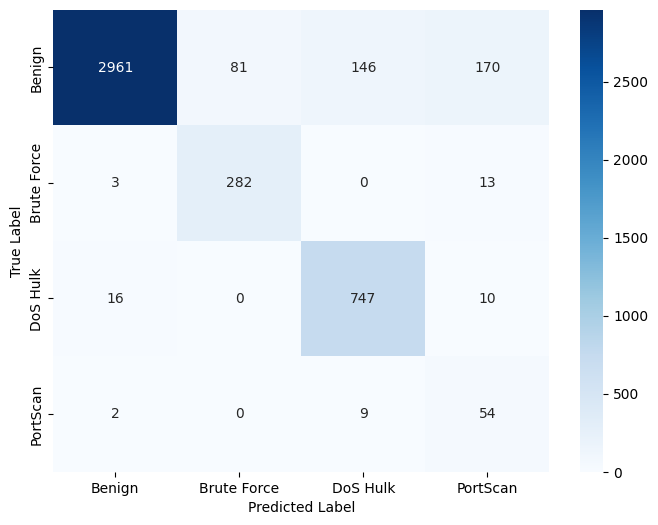

F1-score: 75.6354
Recall: 90.6304
Test Accuracy: 89.9866
Test Precision: 70.4150


In [ ]:
#Batch size: 64
train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=64, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=64, shuffle=False)

model = DeepFFNN(input_size, layer_sizes, output_size).to(device)
optimizer = optim.AdamW(model.parameters(), lr=0.0005)
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
print("Neurons per layer:", layer_sizes)
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
val_accuracy, val_prec, val_f1 = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')
if val_f1 > best_f1_batch:
  best_f1_batch = val_f1
  best_batch = 64

Epoch 20/50, Train Loss: 0.2526, Val Loss: 0.3181
Epoch 40/50, Train Loss: 0.2129, Val Loss: 0.3014
Training took 15.6201 seconds to execute.


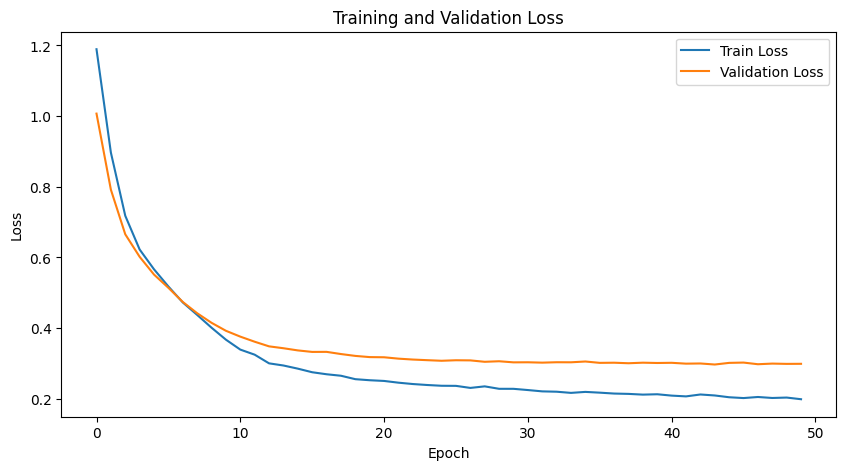

Neurons per layer: [32, 32]


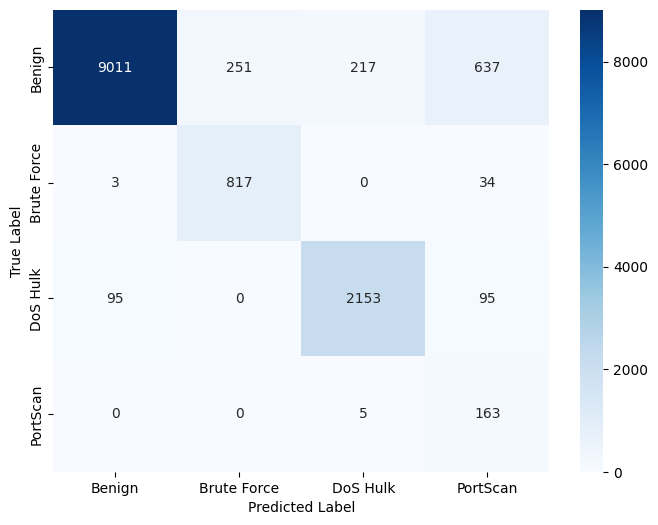

F1-score: 74.9358
Recall: 93.4147
Train Accuracy: 90.0823
Train Precision: 70.9052


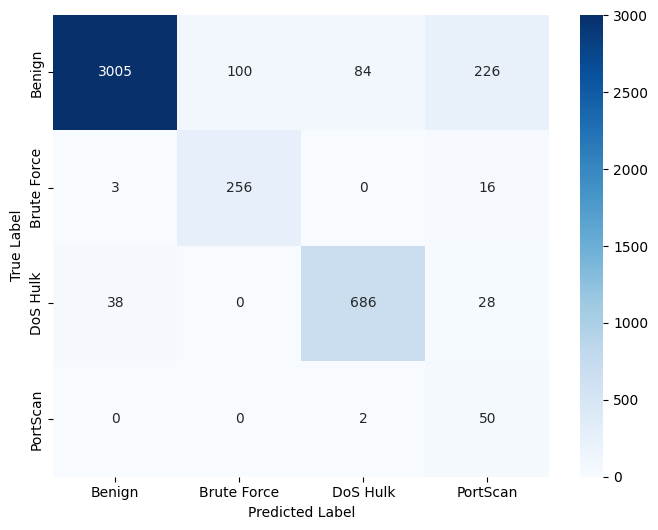

F1-score: 72.7672
Recall: 92.1156
Validation Accuracy: 88.9408
Validation Precision: 68.7623


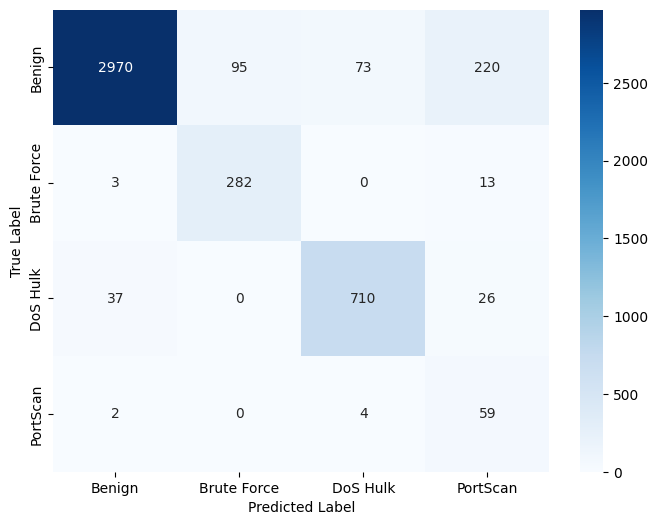

F1-score: 74.6601
Recall: 91.4239
Test Accuracy: 89.4749
Test Precision: 70.5440


In [ ]:
#Batch size: 128
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

model = DeepFFNN(input_size, layer_sizes, output_size).to(device)
optimizer = optim.AdamW(model.parameters(), lr=0.0005)
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
print("Neurons per layer:", layer_sizes)
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
val_accuracy, val_prec, val_f1 = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')
if val_f1 > best_f1_batch:
  best_f1_batch = val_f1
  best_batch = 128

Epoch 20/50, Train Loss: 0.4744, Val Loss: 0.4976
Epoch 40/50, Train Loss: 0.2895, Val Loss: 0.3617
Training took 13.7247 seconds to execute.


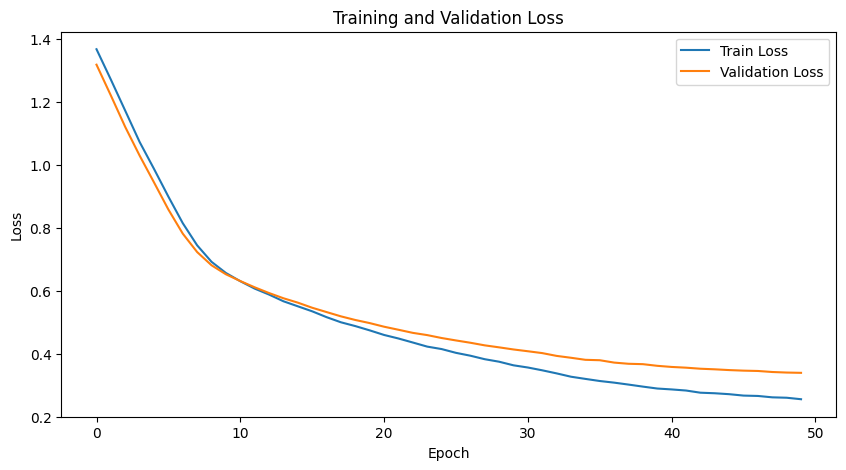

Neurons per layer: [32, 32]


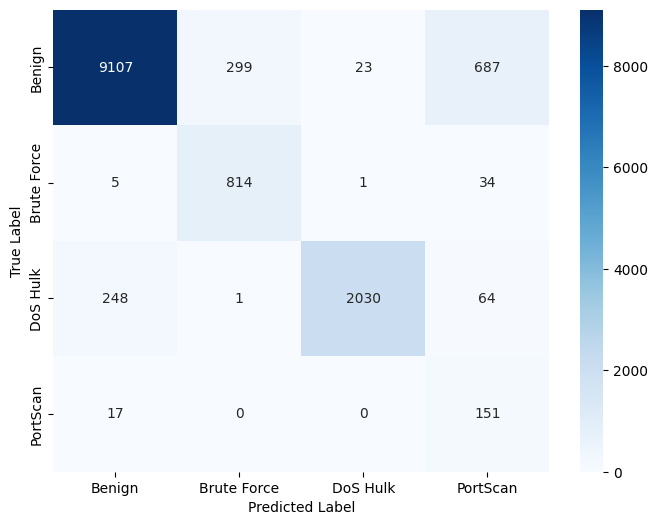

F1-score: 73.9633
Recall: 90.4660
Train Accuracy: 89.7708
Train Precision: 71.2887


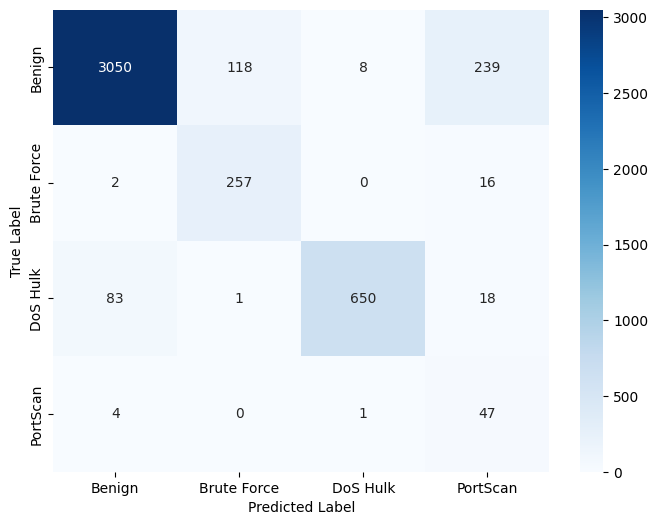

F1-score: 72.3576
Recall: 89.8968
Validation Accuracy: 89.0966
Validation Precision: 69.7094


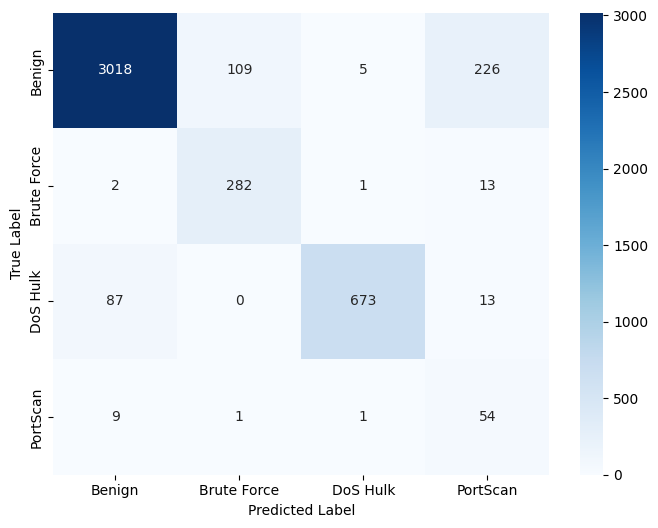

F1-score: 74.1800
Recall: 88.6615
Test Accuracy: 89.6084
Test Precision: 71.3528


In [ ]:
#Batch size: 512
train_loader = DataLoader(train_dataset, batch_size=512, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=512, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=512, shuffle=False)

model = DeepFFNN(input_size, layer_sizes, output_size).to(device)
optimizer = optim.AdamW(model.parameters(), lr=0.0005)
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
print("Neurons per layer:", layer_sizes)
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
val_accuracy, val_prec, val_f1 = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')
if val_f1 > best_f1_batch:
  best_f1_batch = val_f1
  best_batch = 512

In [ ]:
best_batch = 32

The best batch is 32

*The impact of the Activation Function*

In [ ]:
#Class with only Sigmoid
class sigmoidDeepFFNN(nn.Module):
    def __init__(self, input_size, layer_sizes, output_size):
        super(sigmoidDeepFFNN, self).__init__()
        layers = []

        # first hidden layer
        layers.append(nn.Linear(input_size, layer_sizes[0]))
        layers.append(nn.Sigmoid())

        # Hidden layers added
        for i in range(1, len(layer_sizes)):
            layers.append(nn.Linear(layer_sizes[i - 1], layer_sizes[i]))
            layers.append(nn.Sigmoid())


        layers.append(nn.Linear(layer_sizes[-1], output_size)) #for the last layer we don't use a relu as activation function, since every output <0 will be seen as a 0 with a relu, so it's better to use the automatic softmax applied by pytorch

        self.model = nn.Sequential(*layers) #Create an ordered sequence of layers that are applied one after another to the input data.
                                            # model becomes the whole neural network

    def forward(self, x):
        return self.model(x)

#Class with Sigmoid and Relu
class sigmoidReluDeepFFNN(nn.Module):
    def __init__(self, input_size, layer_sizes, output_size):
        super(sigmoidReluDeepFFNN, self).__init__()
        layers = []

        # first hidden layer
        layers.append(nn.Linear(input_size, layer_sizes[0]))
        layers.append(nn.Sigmoid())

        # Hidden layers added
        for i in range(1, len(layer_sizes)):
            layers.append(nn.Linear(layer_sizes[i - 1], layer_sizes[i]))
            if i % 2 == 0:
              layers.append(nn.Sigmoid())
            else:
              layers.append(nn.ReLU())  # "ReLU" con la "U" maiuscola!

        layers.append(nn.Linear(layer_sizes[-1], output_size)) #for the last layer we don't use a relu as activation function, since every output <0 will be seen as a 0 with a relu, so it's better to use the automatic softmax applied by pytorch

        self.model = nn.Sequential(*layers) #Create an ordered sequence of layers that are applied one after another to the input data.
                                            # model becomes the whole neural network

    def forward(self, x):
        return self.model(x)

#Class with only Linear
class linearDeepFFNN(nn.Module):
    def __init__(self, input_size, layer_sizes, output_size):
        super(linearDeepFFNN, self).__init__()
        layers = []

        # first hidden layer
        layers.append(nn.Linear(input_size, layer_sizes[0]))

        # Hidden layers added
        for i in range(1, len(layer_sizes)):
            layers.append(nn.Linear(layer_sizes[i - 1], layer_sizes[i]))

        layers.append(nn.Linear(layer_sizes[-1], output_size)) #for the last layer we don't use a relu as activation function, since every output <0 will be seen as a 0 with a relu, so it's better to use the automatic softmax applied by pytorch

        self.model = nn.Sequential(*layers) #Create an ordered sequence of layers that are applied one after another to the input data.
                                            # model becomes the whole neural network

    def forward(self, x):
        return self.model(x)

#Class with Relu + sigmoid at the end
class endsigmoidDeepFFNN(nn.Module):
    def __init__(self, input_size, layer_sizes, output_size):
        super(endsigmoidDeepFFNN, self).__init__()
        layers = []

        # first hidden layer
        layers.append(nn.Linear(input_size, layer_sizes[0]))


        # Hidden layers added
        for i in range(1, len(layer_sizes)):
            layers.append(nn.ReLU())
            layers.append(nn.Linear(layer_sizes[i - 1], layer_sizes[i]))


        layers.append(nn.Sigmoid())
        layers.append(nn.Linear(layer_sizes[-1], output_size)) #for the last layer we don't use a relu as activation function, since every output <0 will be seen as a 0 with a relu, so it's better to use the automatic softmax applied by pytorch

        self.model = nn.Sequential(*layers) #Create an ordered sequence of layers that are applied one after another to the input data.
                                            # model becomes the whole neural network

    def forward(self, x):
        return self.model(x)

In [ ]:
train_loader = DataLoader(train_dataset, batch_size=best_batch, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=best_batch, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=best_batch, shuffle=False)


Epoch 20/50, Train Loss: 0.4006, Val Loss: 0.4080
Epoch 40/50, Train Loss: 0.2965, Val Loss: 0.3216
Training took 42.1721 seconds to execute.


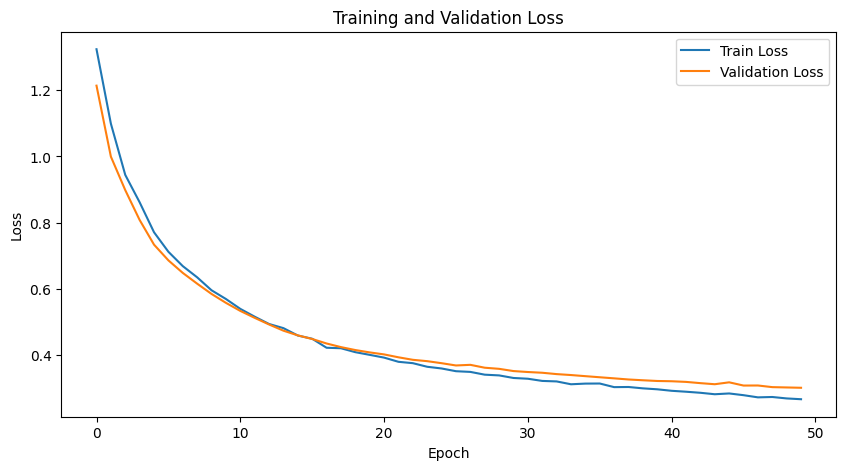

Neurons per layer: [32, 32]


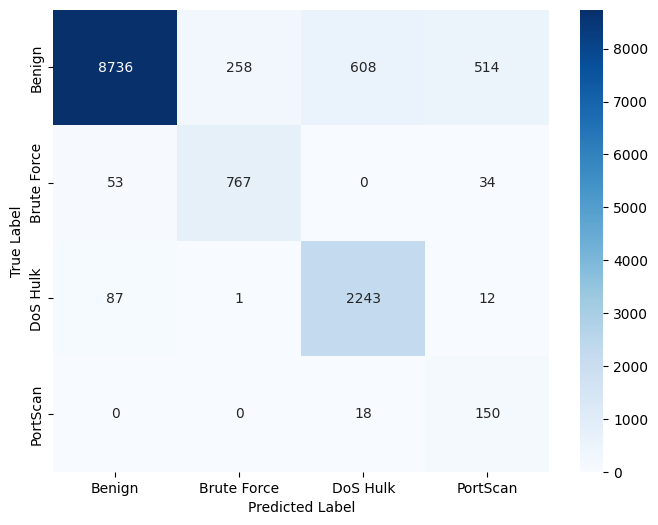

F1-score: 73.4579
Recall: 90.2971
Train Accuracy: 88.2427
Train Precision: 68.1216


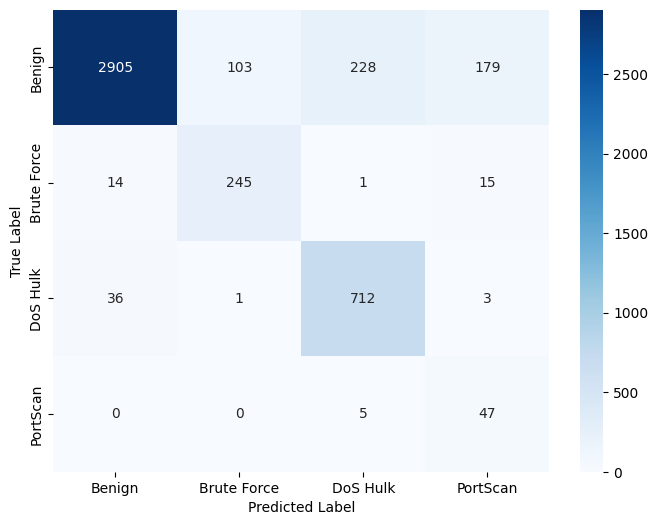

F1-score: 71.3386
Recall: 89.8056
Validation Accuracy: 86.9826
Validation Precision: 65.7588


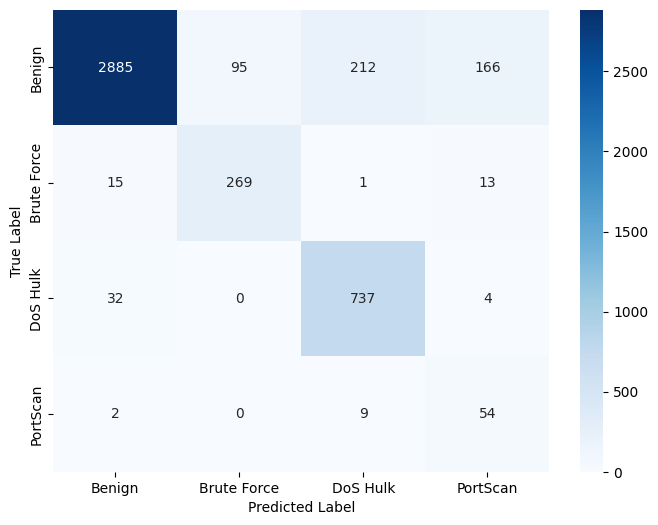

F1-score: 73.4595
Recall: 88.6506
Test Accuracy: 87.7837
Test Precision: 67.9667


In [ ]:
#only Sigmoid

model = sigmoidDeepFFNN(input_size, layer_sizes, output_size).to(device)
optimizer = optim.AdamW(model.parameters(), lr=0.0005)
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
print("Neurons per layer:", layer_sizes)
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
val_accuracy, val_prec, _ = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')

Epoch 20/50, Train Loss: 0.3319, Val Loss: 0.3721
Epoch 40/50, Train Loss: 0.2416, Val Loss: 0.3071
Training took 44.4394 seconds to execute.


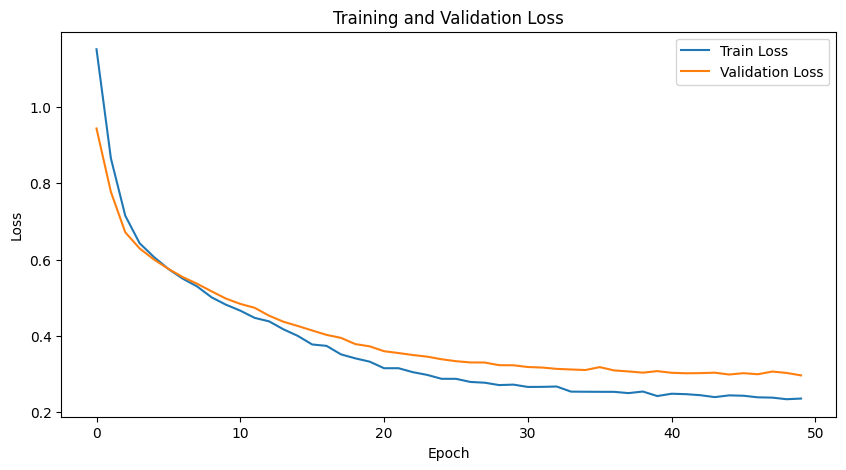

Neurons per layer: [32, 32]


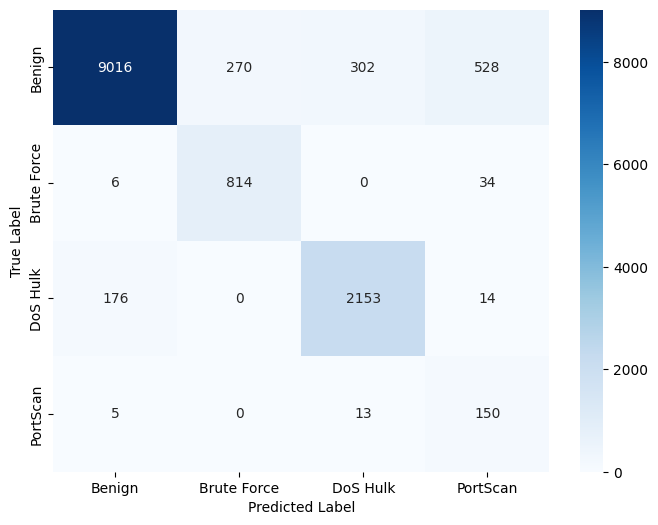

F1-score: 75.1006
Recall: 91.4047
Train Accuracy: 90.0007
Train Precision: 70.2395


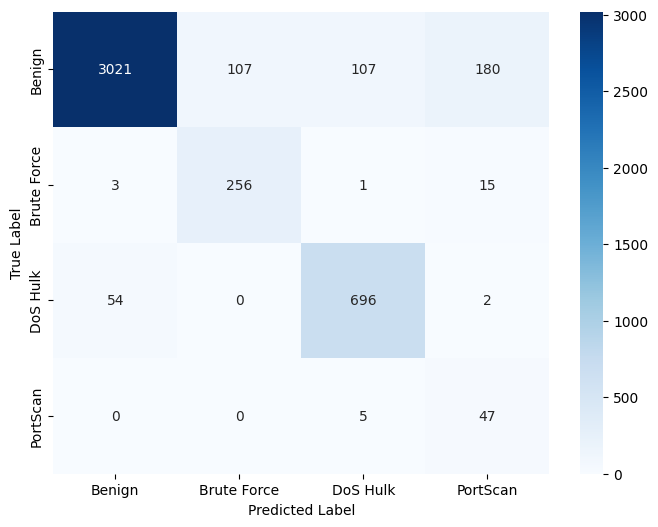

F1-score: 73.5588
Recall: 91.1228
Validation Accuracy: 89.4526
Validation Precision: 68.4915


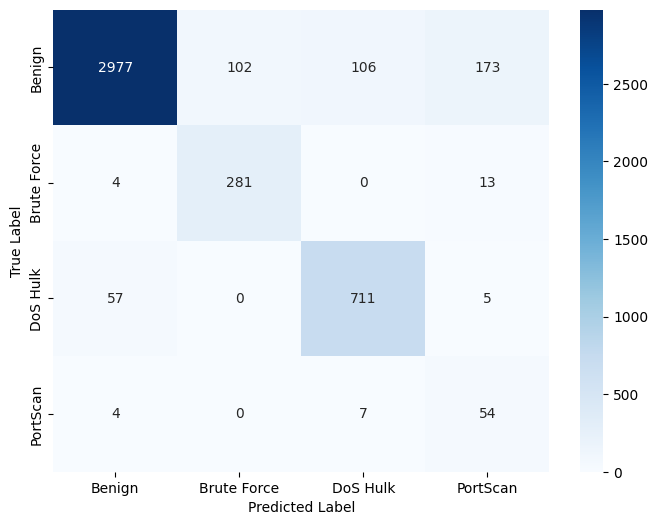

F1-score: 74.8594
Recall: 89.5014
Test Accuracy: 89.5194
Test Precision: 69.8897


In [ ]:
#Sigmoid and Relu

model = sigmoidReluDeepFFNN(input_size, layer_sizes, output_size).to(device)
optimizer = optim.AdamW(model.parameters(), lr=0.0005)
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
print("Neurons per layer:", layer_sizes)
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
val_accuracy, val_prec, _ = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')

Epoch 20/50, Train Loss: 0.4579, Val Loss: 0.4488
Epoch 40/50, Train Loss: 0.4278, Val Loss: 0.4242
Training took 40.6213 seconds to execute.


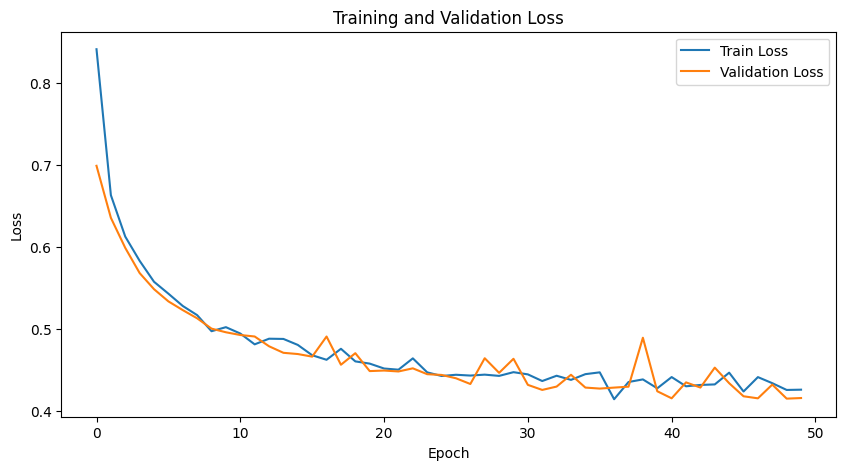

Neurons per layer: [32, 32]


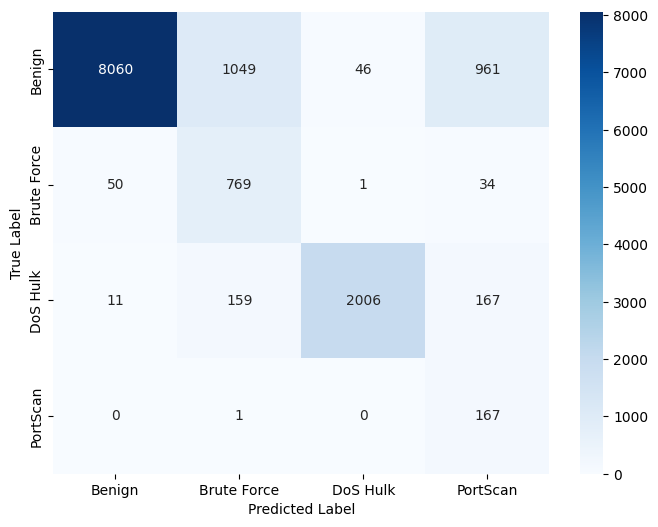

F1-score: 64.0689
Recall: 88.6860
Train Accuracy: 81.6112
Train Precision: 62.1008


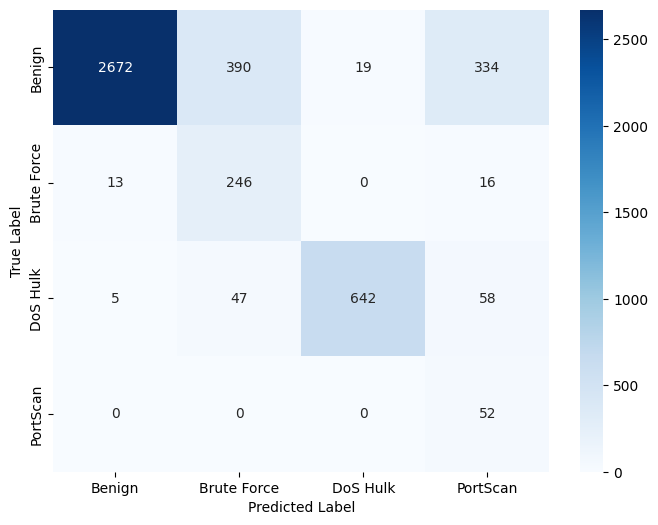

F1-score: 62.5187
Recall: 88.2675
Validation Accuracy: 80.3738
Validation Precision: 60.9446


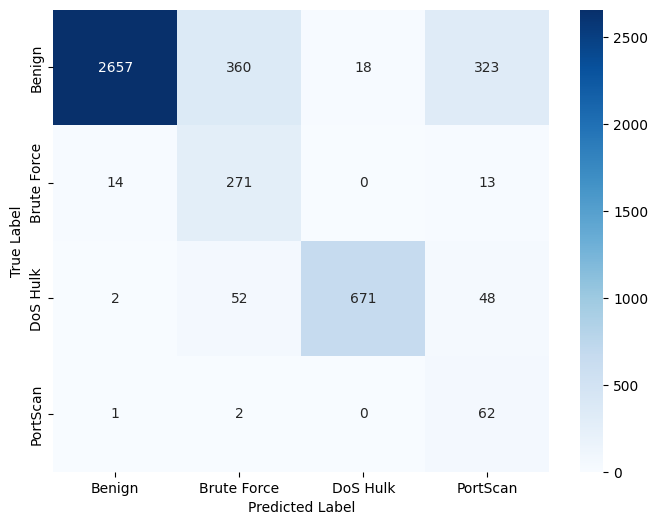

F1-score: 64.8231
Recall: 88.0633
Test Accuracy: 81.4642
Test Precision: 62.5538


In [ ]:
#only Linear

model = linearDeepFFNN(input_size, layer_sizes, output_size).to(device)
optimizer = optim.AdamW(model.parameters(), lr=0.0005)
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
print("Neurons per layer:", layer_sizes)
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
val_accuracy, val_prec, _ = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')

Epoch 20/50, Train Loss: 0.2357, Val Loss: 0.2708
Epoch 40/50, Train Loss: 0.1934, Val Loss: 0.2337
Training took 42.6191 seconds to execute.


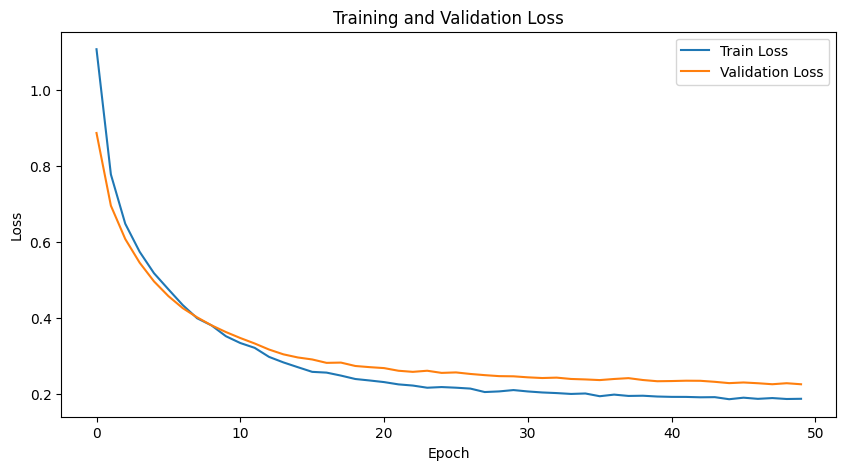

Neurons per layer: [32, 32]


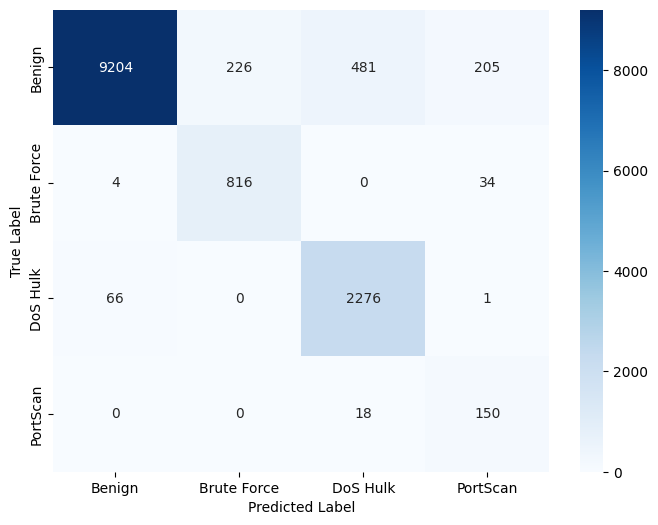

F1-score: 80.9290
Recall: 93.2403
Train Accuracy: 92.3225
Train Precision: 74.5089


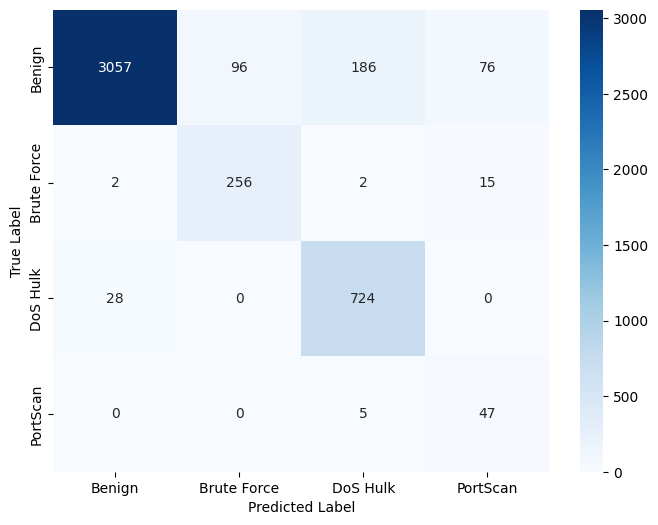

F1-score: 77.9809
Recall: 92.3172
Validation Accuracy: 90.8767
Validation Precision: 71.1916


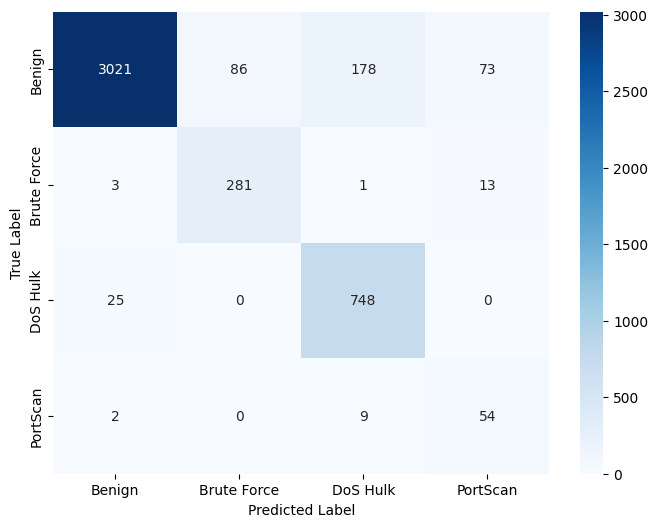

F1-score: 79.7511
Recall: 91.0256
Test Accuracy: 91.3218
Test Precision: 73.5174


In [ ]:
#Relu + sigmoid at the end

model = endsigmoidDeepFFNN(input_size, layer_sizes, output_size).to(device)
optimizer = optim.AdamW(model.parameters(), lr=0.0005)
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
print("Neurons per layer:", layer_sizes)
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
val_accuracy, val_prec, _ = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')

*The impact of the Optimizer*

We take the best combintion of activation function, that in our case is the one with all relu and at the end the sigmoid

In [ ]:
input_size = 15
output_size = 4

Epoch 20/50, Train Loss: 0.1803, Val Loss: 0.1833
Epoch 40/50, Train Loss: 0.1423, Val Loss: 0.1492
Training took 23.2073 seconds to execute.


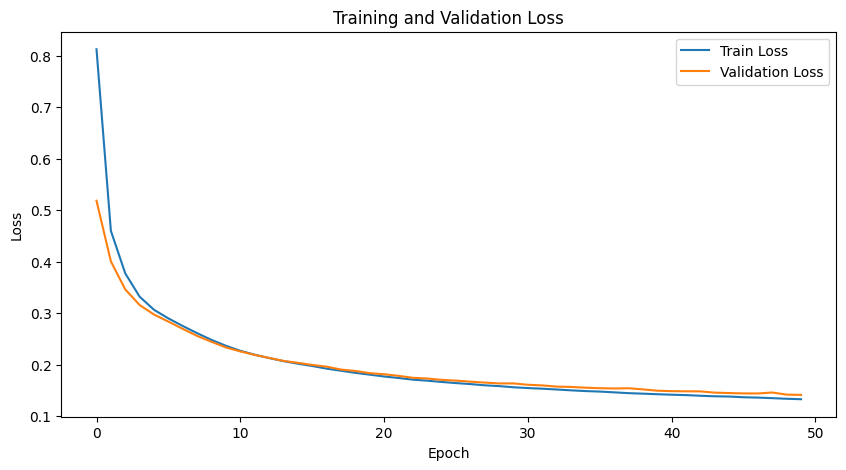

Neurons per layer: [32, 32]


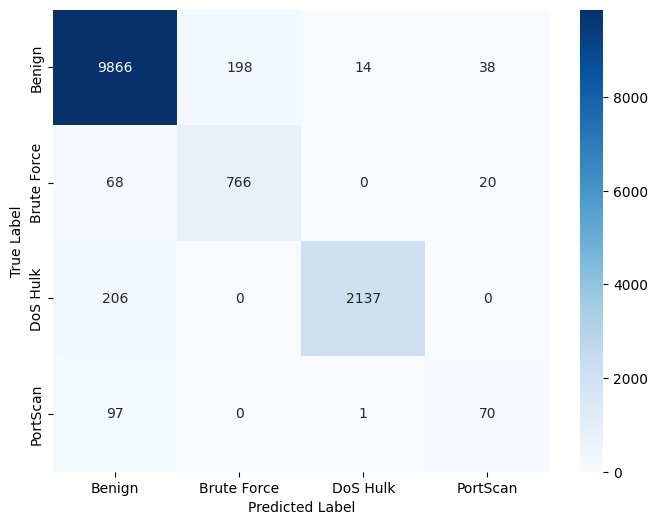

F1-score: 80.8995
Recall: 80.0247
Train Accuracy: 95.2377
Train Precision: 82.4567


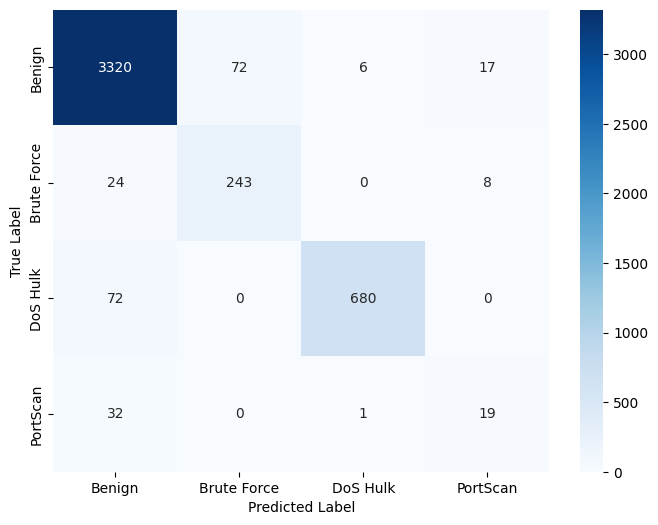

F1-score: 78.3042
Recall: 78.1364
Validation Accuracy: 94.8376
Validation Precision: 78.8984


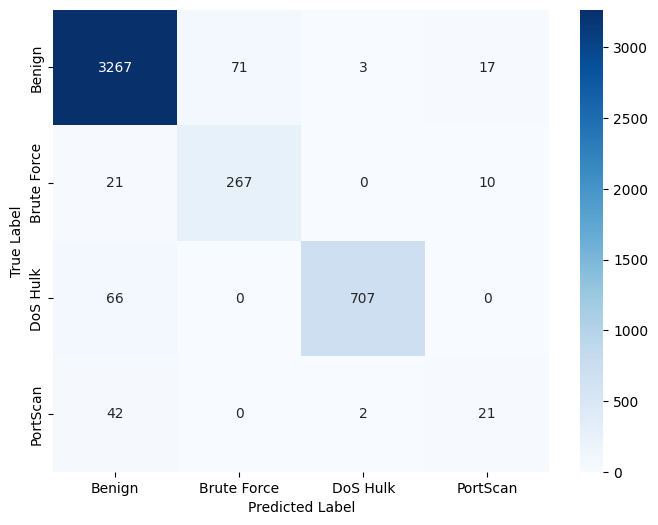

F1-score: 78.2730
Recall: 77.6642
Test Accuracy: 94.8376
Test Precision: 79.5608


In [ ]:
#AdamW

model = endsigmoidDeepFFNN(input_size, layer_sizes, output_size).to(device)
optimizer = optim.AdamW(model.parameters(), lr=0.0005)
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
print("Neurons per layer:", layer_sizes)
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
val_accuracy, val_prec, _ = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')

Epoch 20/50, Train Loss: 0.7382, Val Loss: 0.7199
Epoch 40/50, Train Loss: 0.6945, Val Loss: 0.6771
Training took 22.6219 seconds to execute.


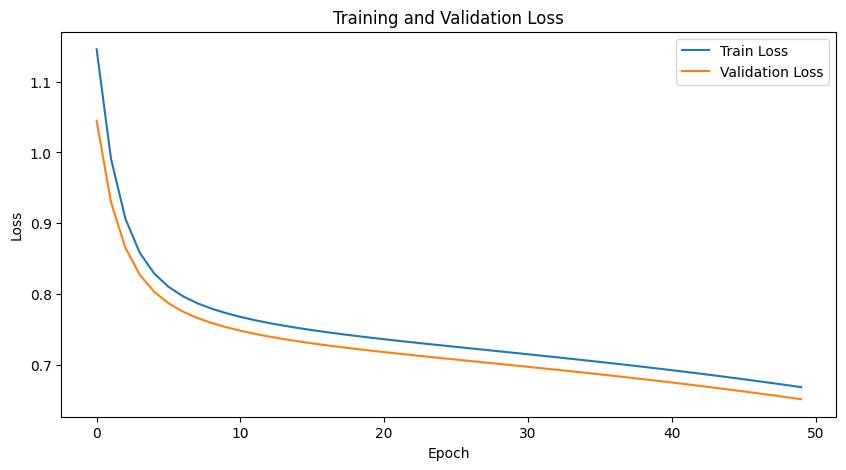

Neurons per layer: [32, 32]


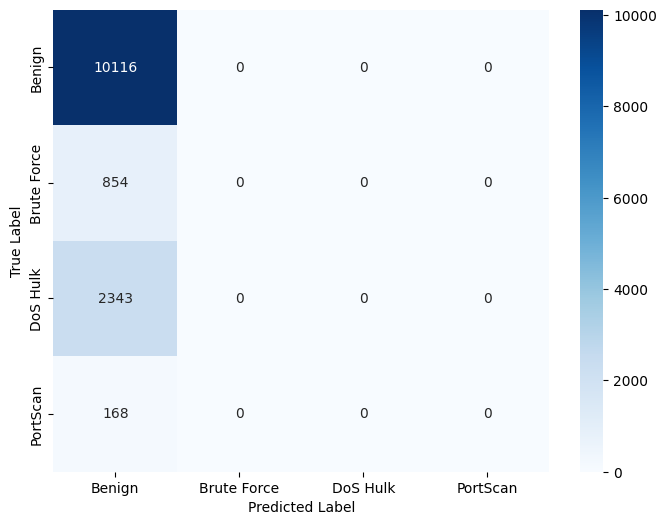

F1-score: 21.4349
Recall: 25.0000
Train Accuracy: 75.0389
Train Precision: 18.7597


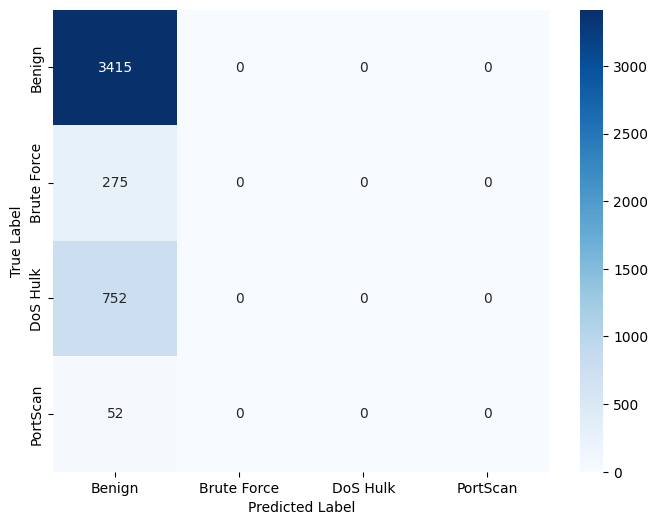

F1-score: 21.5893
Recall: 25.0000
Validation Accuracy: 75.9902
Validation Precision: 18.9976


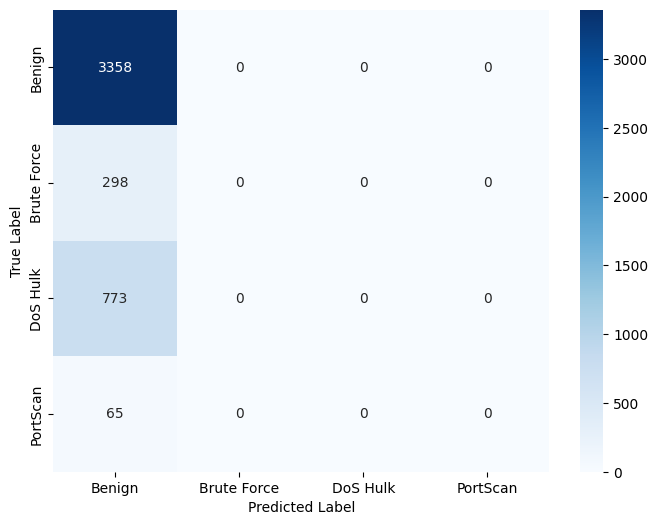

F1-score: 21.3831
Recall: 25.0000
Test Accuracy: 74.7219
Test Precision: 18.6805


In [ ]:
#SGD

model = endsigmoidDeepFFNN(input_size, layer_sizes, output_size).to(device)
optimizer = optim.SGD(model.parameters(), lr=0.0005)
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
print("Neurons per layer:", layer_sizes)
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
val_accuracy, val_prec, _ = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')

Epoch 20/50, Train Loss: 0.7434, Val Loss: 0.7251
Epoch 40/50, Train Loss: 0.6940, Val Loss: 0.6768
Training took 21.6938 seconds to execute.


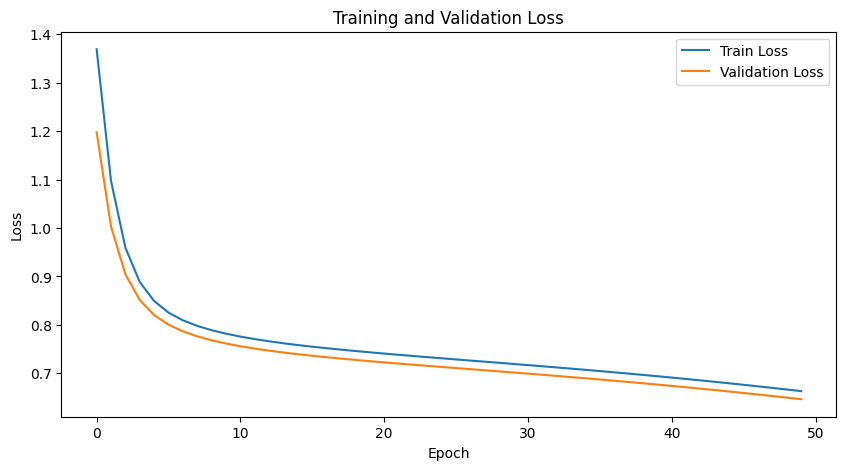

Neurons per layer: [32, 32]


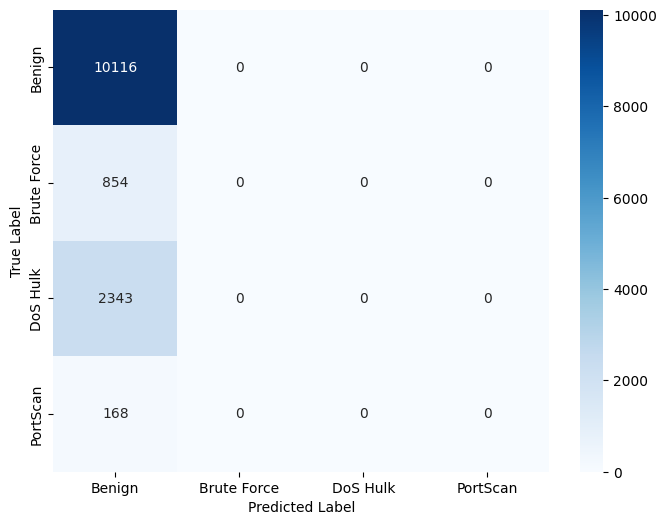

F1-score: 21.4349
Recall: 25.0000
Train Accuracy: 75.0389
Train Precision: 18.7597


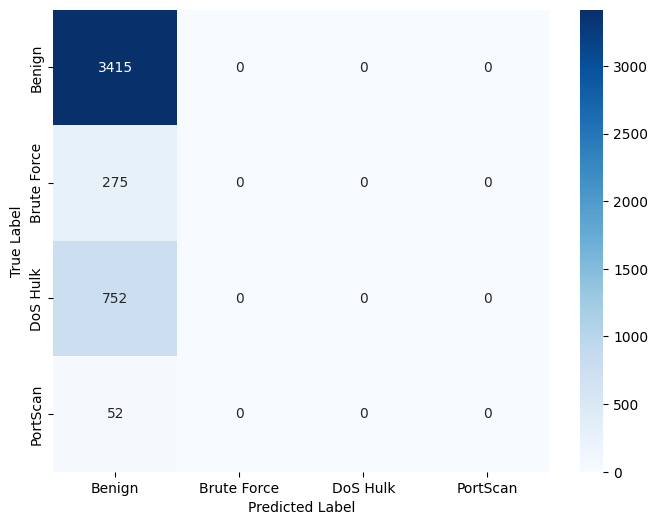

F1-score: 21.5893
Recall: 25.0000
Validation Accuracy: 75.9902
Validation Precision: 18.9976


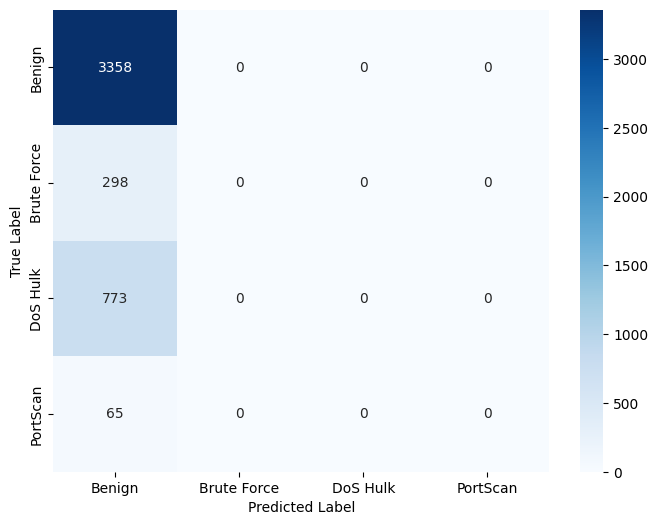

F1-score: 21.3831
Recall: 25.0000
Test Accuracy: 74.7219
Test Precision: 18.6805


In [ ]:
#SGD with momentum 0.1

model = endsigmoidDeepFFNN(input_size, layer_sizes, output_size).to(device)
optimizer = optim.SGD(model.parameters(), lr=0.0005, momentum=0.1)
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
print("Neurons per layer:", layer_sizes)
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
val_accuracy, val_prec, _ = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')

Epoch 20/50, Train Loss: 0.6846, Val Loss: 0.6664
Epoch 40/50, Train Loss: 0.5473, Val Loss: 0.5319
Training took 21.6582 seconds to execute.


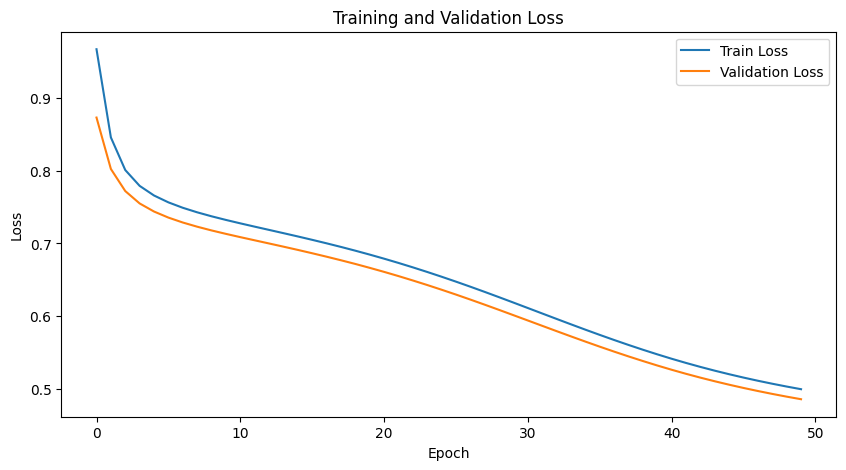

Neurons per layer: [32, 32]


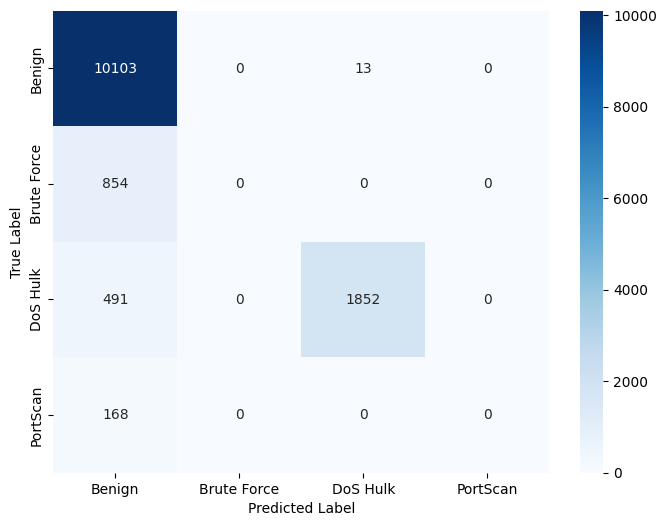

F1-score: 45.2502
Recall: 44.7289
Train Accuracy: 88.6804
Train Precision: 46.5695


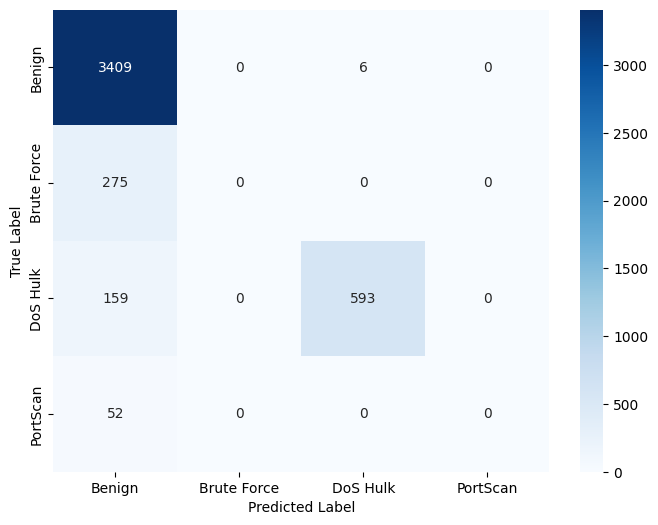

F1-score: 45.2641
Recall: 44.6702
Validation Accuracy: 89.0521
Validation Precision: 46.6302


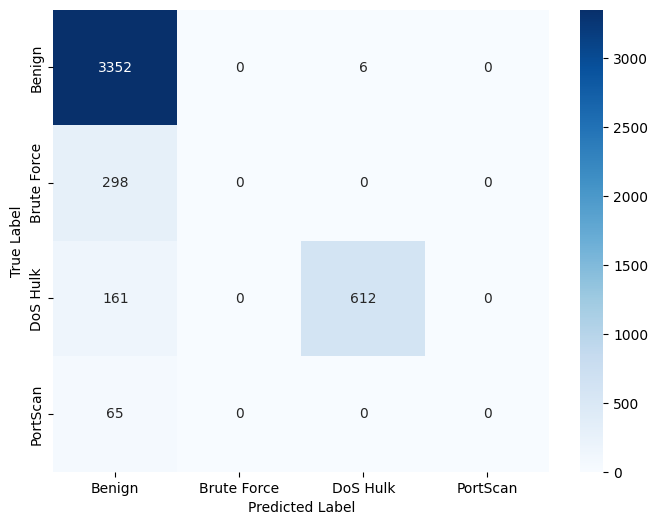

F1-score: 45.1669
Recall: 44.7483
Test Accuracy: 88.2065
Test Precision: 46.3775


In [ ]:
#SGD with momentum 0.5

model = endsigmoidDeepFFNN(input_size, layer_sizes, output_size).to(device)
optimizer = optim.SGD(model.parameters(), lr=0.0005, momentum=0.5)
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
print("Neurons per layer:", layer_sizes)
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
val_accuracy, val_prec, _ = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')

Epoch 20/50, Train Loss: 0.4403, Val Loss: 0.4245
Epoch 40/50, Train Loss: 0.3795, Val Loss: 0.3706
Training took 21.2807 seconds to execute.


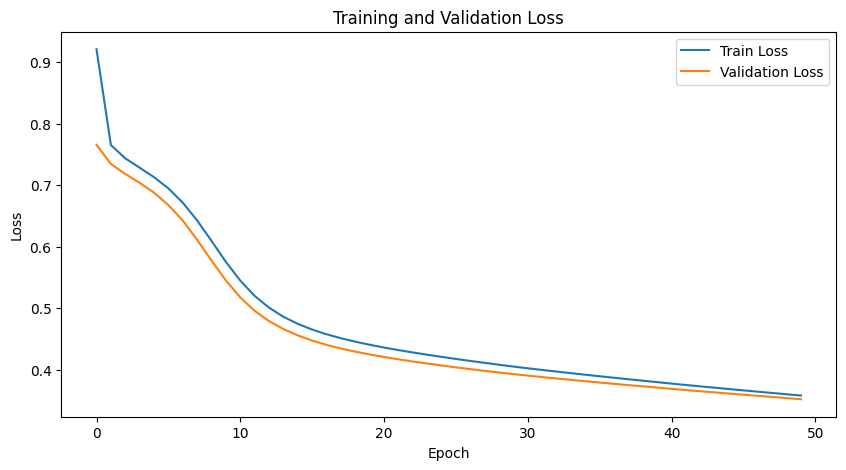

Neurons per layer: [32, 32]


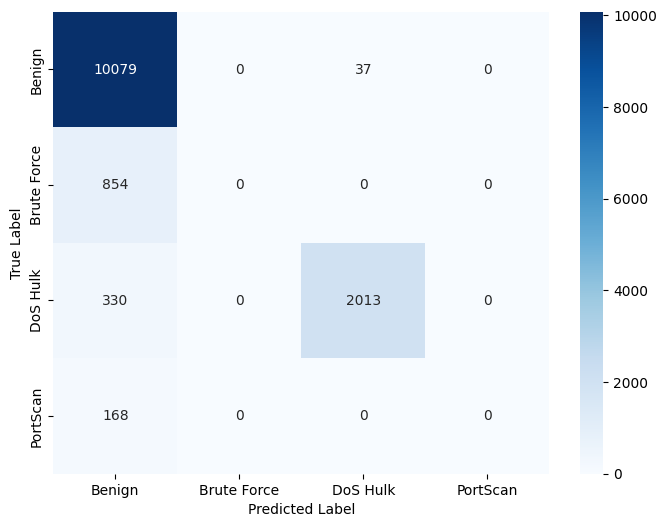

F1-score: 46.2999
Recall: 46.3874
Train Accuracy: 89.6966
Train Precision: 46.5919


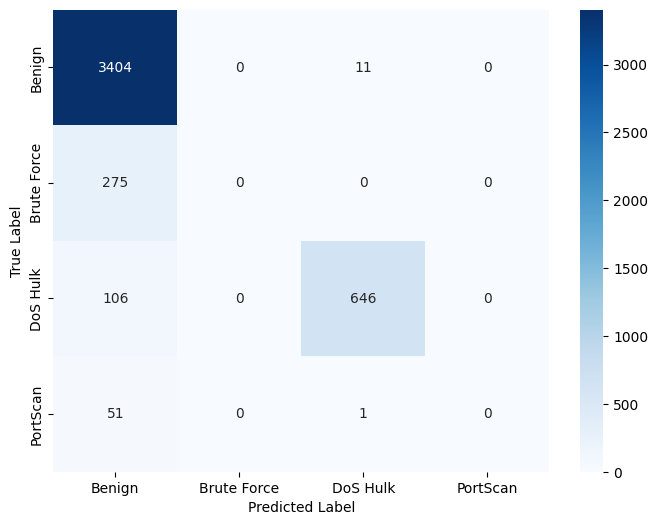

F1-score: 46.3804
Recall: 46.3955
Validation Accuracy: 90.1202
Validation Precision: 46.7286


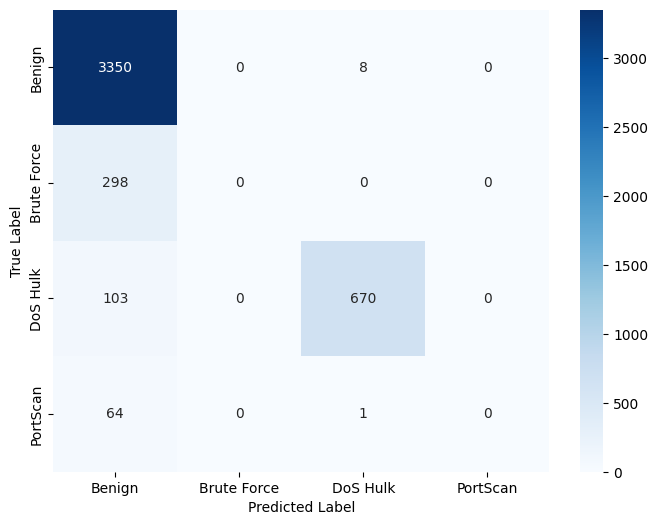

F1-score: 46.4231
Recall: 46.6093
Test Accuracy: 89.4526
Test Precision: 46.6214


In [ ]:
#SGD with momentum 0.9

model = endsigmoidDeepFFNN(input_size, layer_sizes, output_size).to(device)
optimizer = optim.SGD(model.parameters(), lr=0.0005, momentum=0.9)
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
print("Neurons per layer:", layer_sizes)
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
val_accuracy, val_prec, _ = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')

Best optimizer AdamW

In [ ]:
#adamw
learning_rates = [0.0001, 0.0005, 0.001, 0.005]
layer_sizes = [32, 32]
num_epochs = 50

Learning rate: 0.0001
Epoch 20/50, Train Loss: 0.1779, Val Loss: 0.1828
Epoch 40/50, Train Loss: 0.1338, Val Loss: 0.1473
Training took 23.7452 seconds to execute.


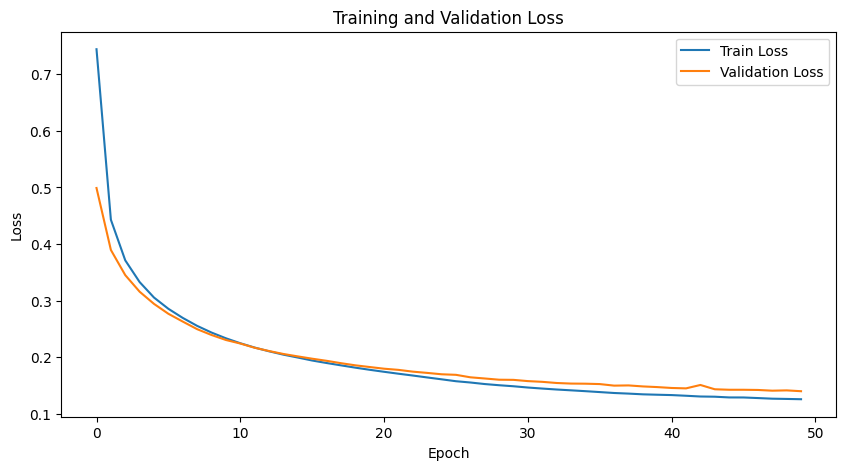

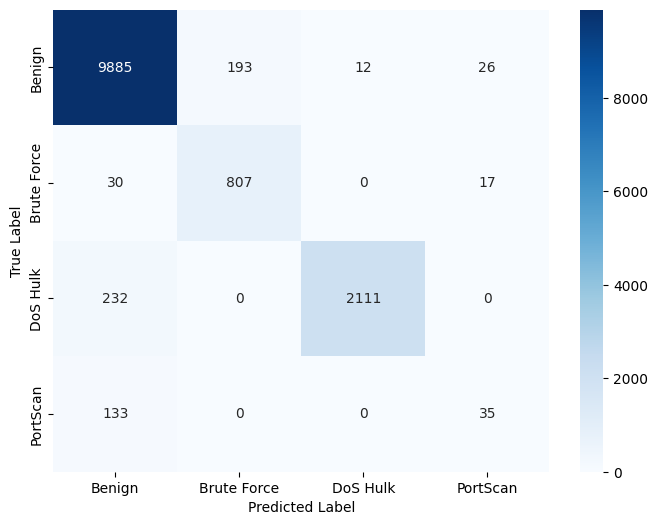

F1-score: 76.7444
Recall: 75.7861
Train Accuracy: 95.2303
Train Precision: 80.2910


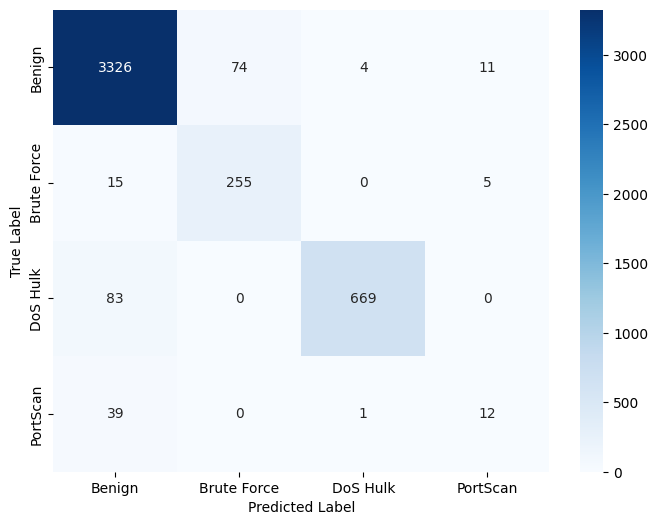

F1-score: 76.2450
Recall: 75.5402
Validation Accuracy: 94.8376
Validation Precision: 78.9167


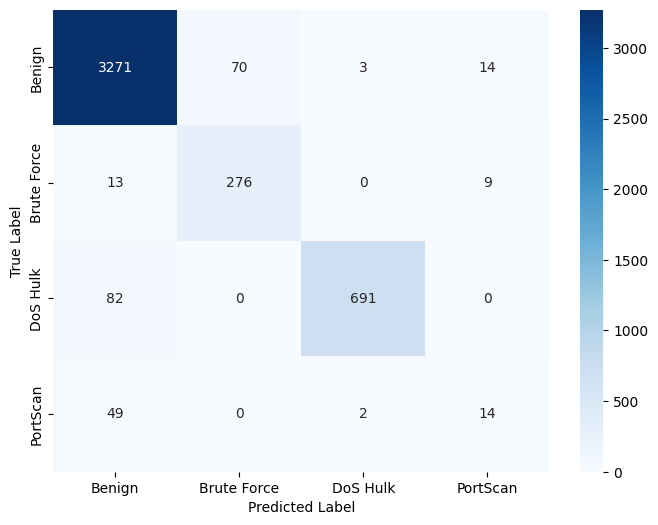

F1-score: 75.9581
Recall: 75.2393
Test Accuracy: 94.6150
Test Precision: 78.1679
Learning rate: 0.0005
Epoch 20/50, Train Loss: 0.1786, Val Loss: 0.1820
Epoch 40/50, Train Loss: 0.1372, Val Loss: 0.1477
Training took 23.7823 seconds to execute.


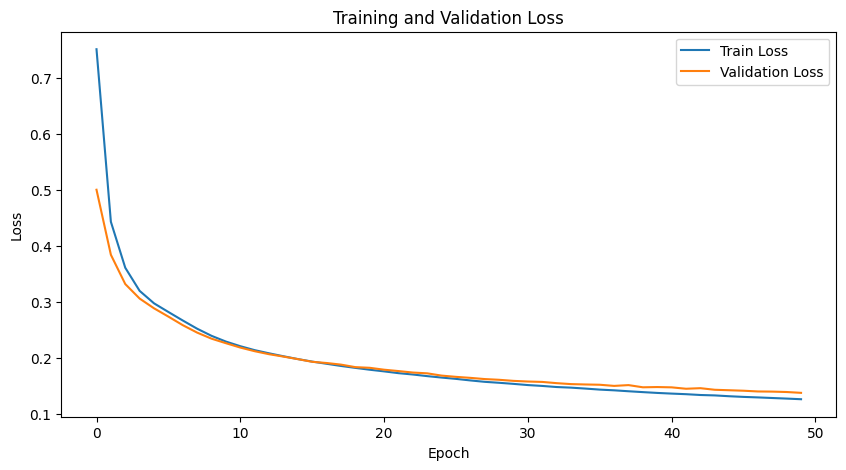

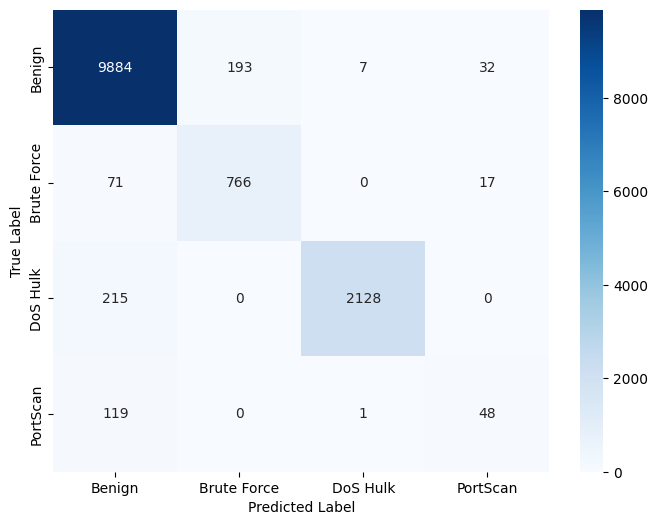

F1-score: 78.1567
Recall: 76.6993
Train Accuracy: 95.1413
Train Precision: 81.2622


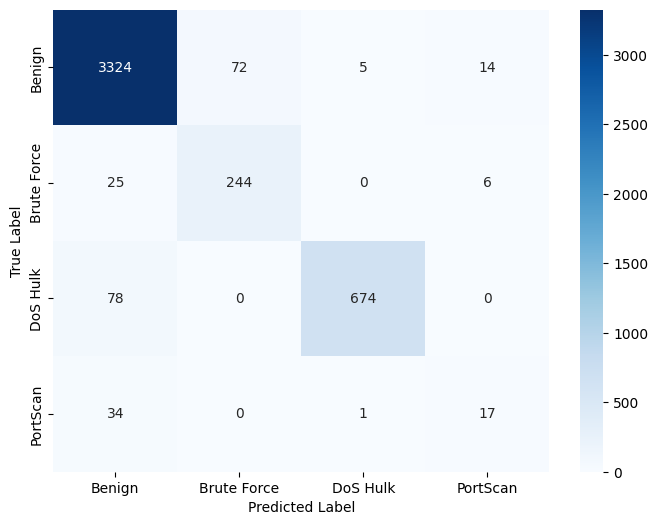

F1-score: 77.8981
Recall: 77.0956
Validation Accuracy: 94.7708
Validation Precision: 79.5801


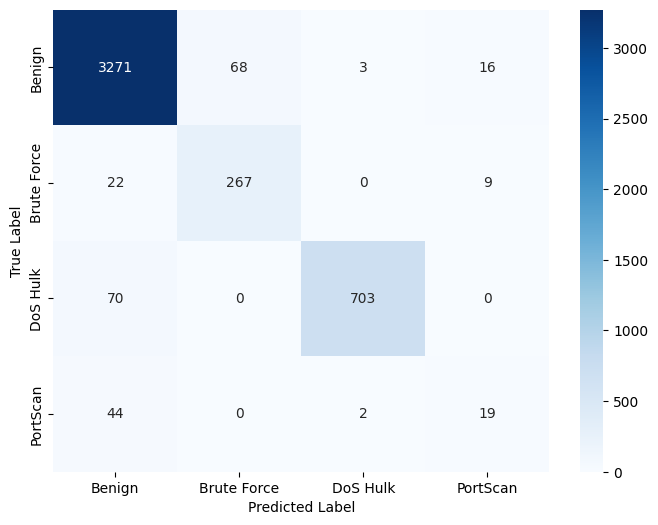

F1-score: 77.7155
Recall: 76.7954
Test Accuracy: 94.7931
Test Precision: 79.5463
Learning rate: 0.001
Epoch 20/50, Train Loss: 0.1839, Val Loss: 0.1871
Epoch 40/50, Train Loss: 0.1464, Val Loss: 0.1571
Training took 23.7132 seconds to execute.


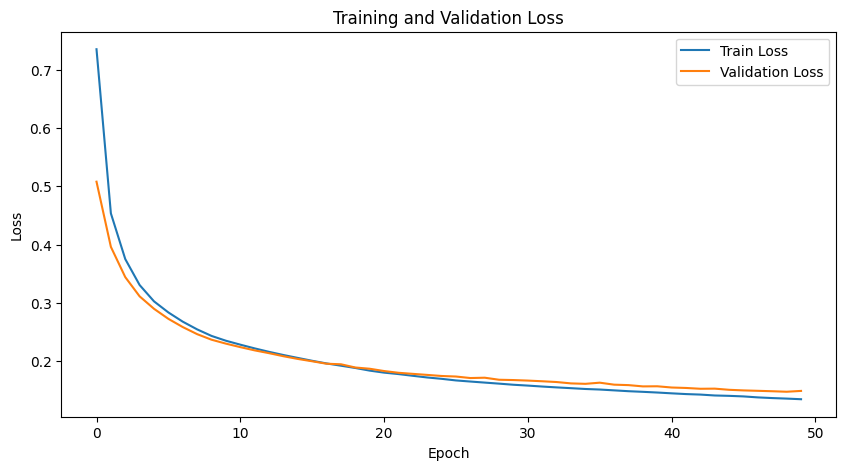

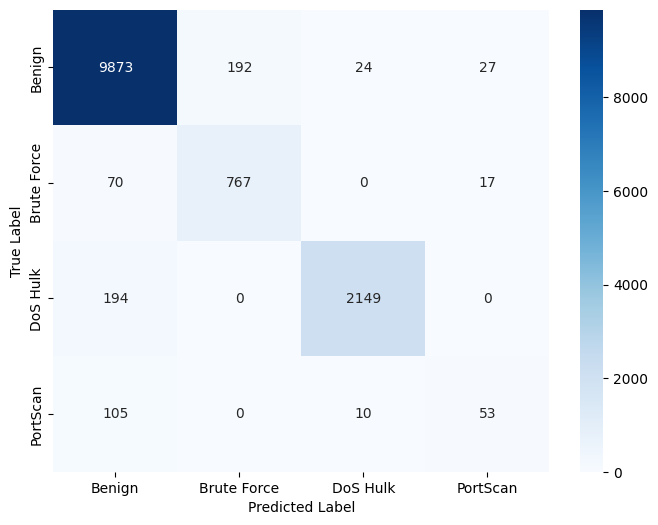

F1-score: 79.1418
Recall: 77.6695
Train Accuracy: 95.2600
Train Precision: 82.3645


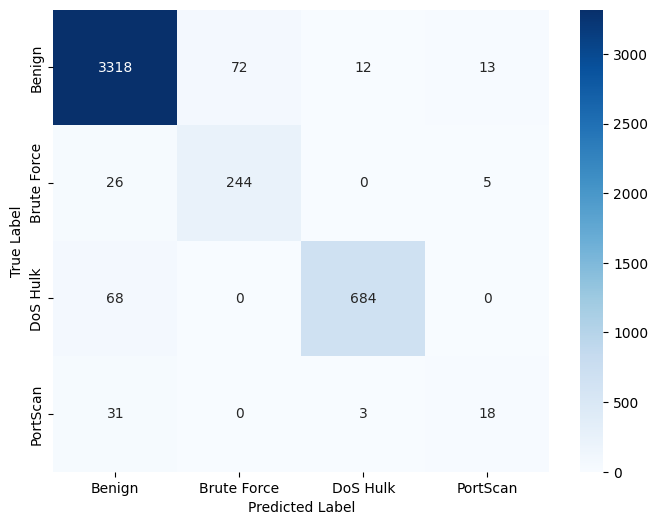

F1-score: 78.6309
Recall: 77.8649
Validation Accuracy: 94.8821
Validation Precision: 80.3597


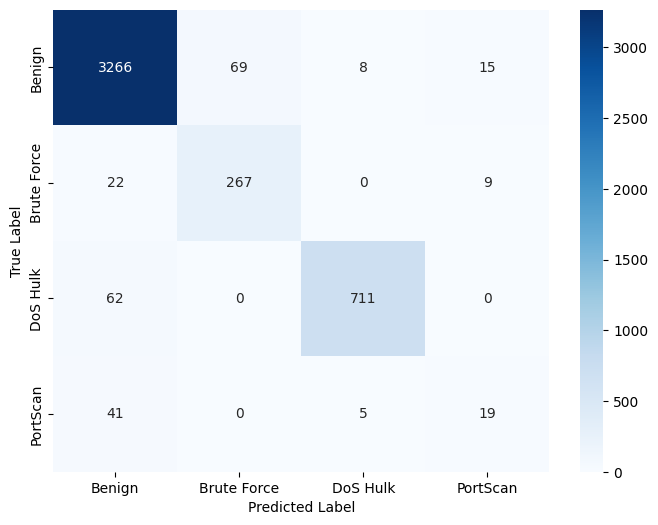

F1-score: 77.7968
Recall: 77.0169
Test Accuracy: 94.8598
Test Precision: 79.5421
Learning rate: 0.005
Epoch 20/50, Train Loss: 0.1814, Val Loss: 0.1837
Epoch 40/50, Train Loss: 0.1440, Val Loss: 0.1502
Training took 23.7207 seconds to execute.


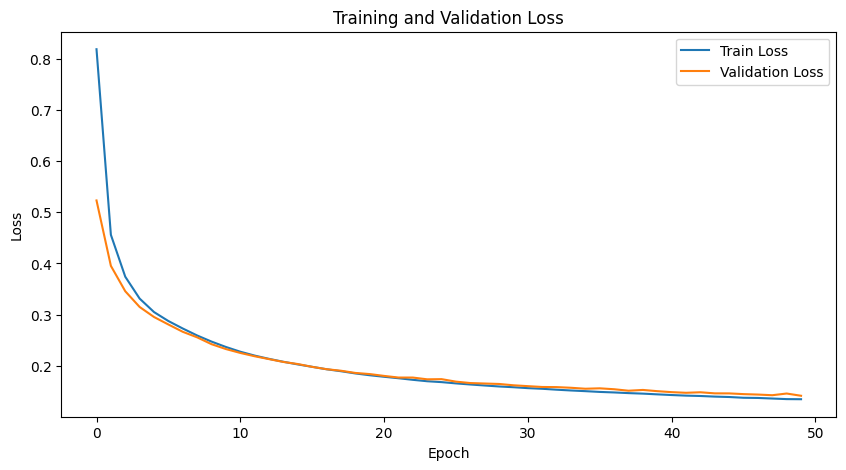

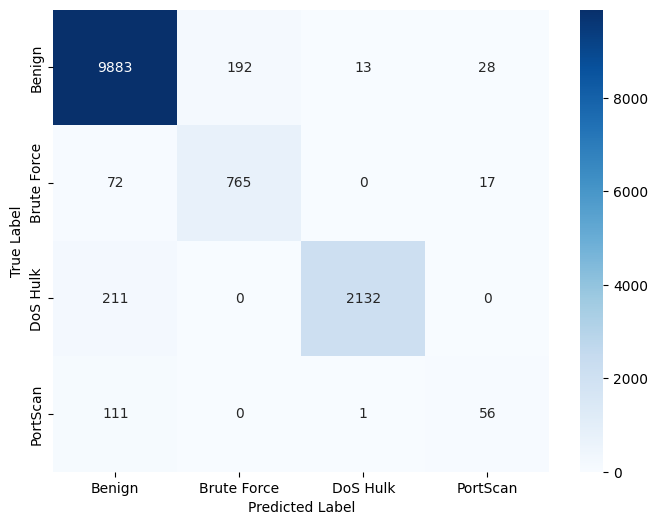

F1-score: 79.5081
Recall: 77.9007
Train Accuracy: 95.2155
Train Precision: 82.7242


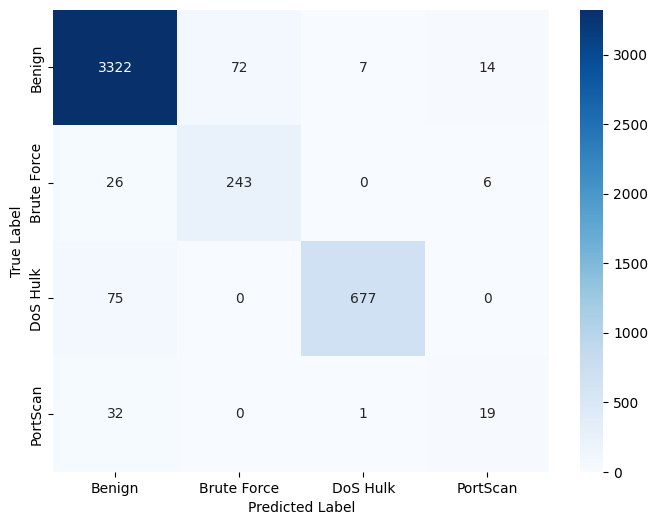

F1-score: 78.7664
Recall: 78.0514
Validation Accuracy: 94.8153
Validation Precision: 80.2109


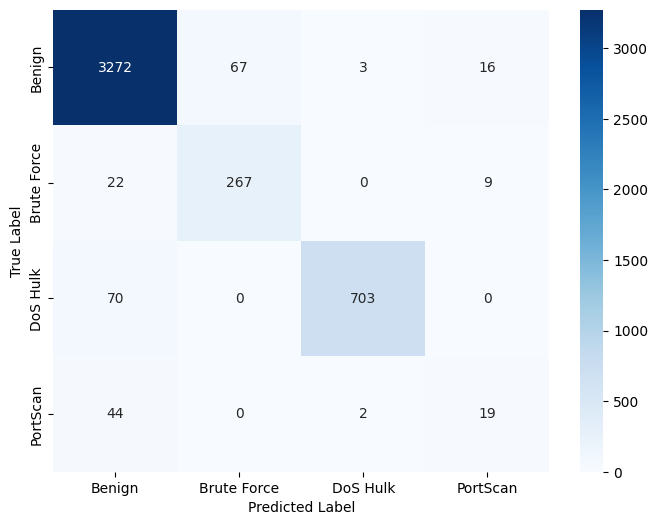

F1-score: 77.7527
Recall: 76.8029
Test Accuracy: 94.8153
Test Precision: 79.6063


In [ ]:
#AdamW
for _ in learning_rates:
  print(f"Learning rate: {_}")
  model = endsigmoidDeepFFNN(input_size, layer_sizes, output_size).to(device)
  optimizer = optim.AdamW(model.parameters(), lr=0.0005)
  training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
  train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
  print(f'Train Accuracy: {train_accuracy:.4f}')
  print(f'Train Precision: {train_prec:.4f}')
  val_accuracy, val_prec, _ = testing_model(model,val_loader,device)
  print(f'Validation Accuracy: {val_accuracy:.4f}')
  print(f'Validation Precision: {val_prec:.4f}')
  test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
  print(f'Test Accuracy: {test_accuracy:.4f}')
  print(f'Test Precision: {test_prec:.4f}')

In [ ]:
#adamW lr=0.0005 but with 30 epochs
num_epochs = 30

Epoch 20/30, Train Loss: 0.1819, Val Loss: 0.1871
Training took 14.5832 seconds to execute.


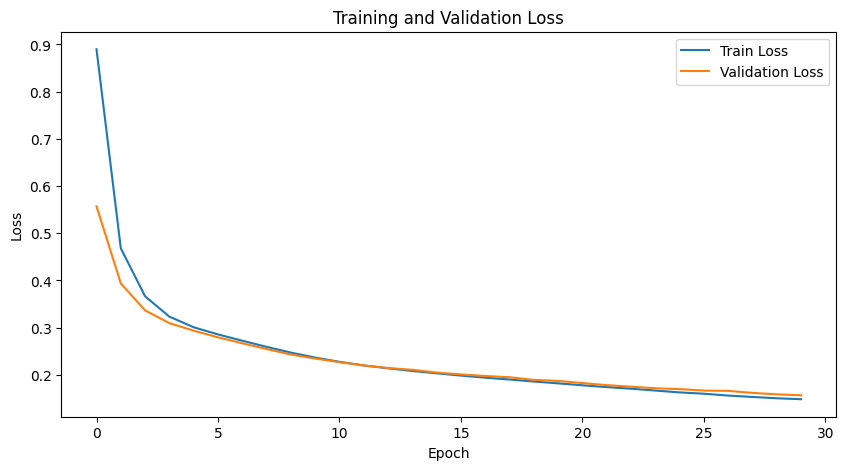

Neurons per layer: [32, 32]


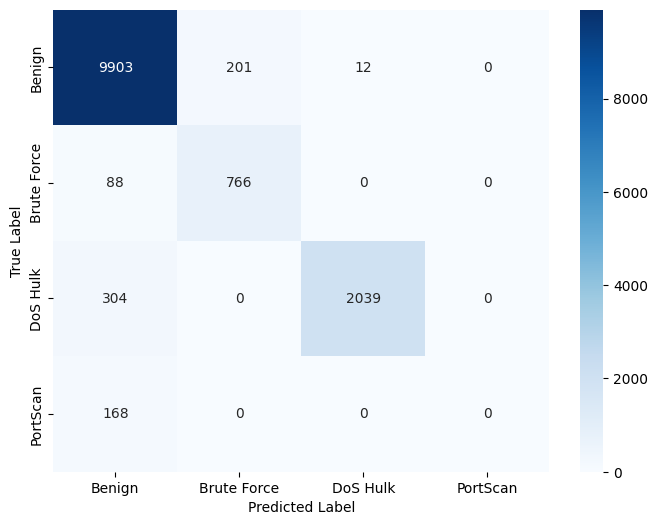

F1-score: 68.2954
Recall: 68.6538
Train Accuracy: 94.2660
Train Precision: 68.3192


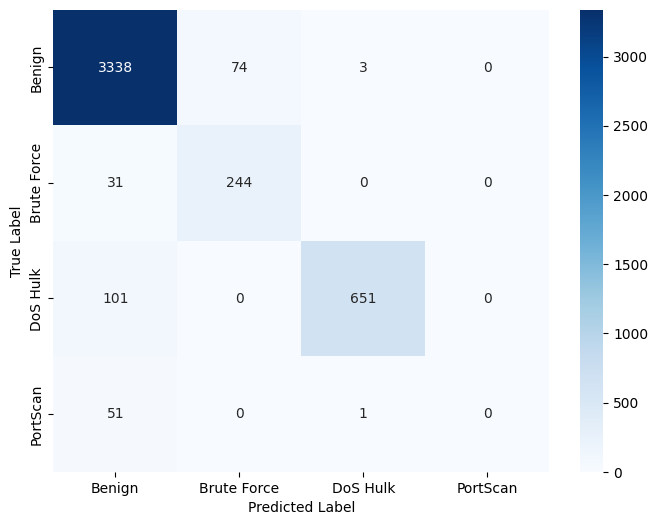

F1-score: 67.7705
Recall: 68.2604
Validation Accuracy: 94.1923
Validation Precision: 67.7304


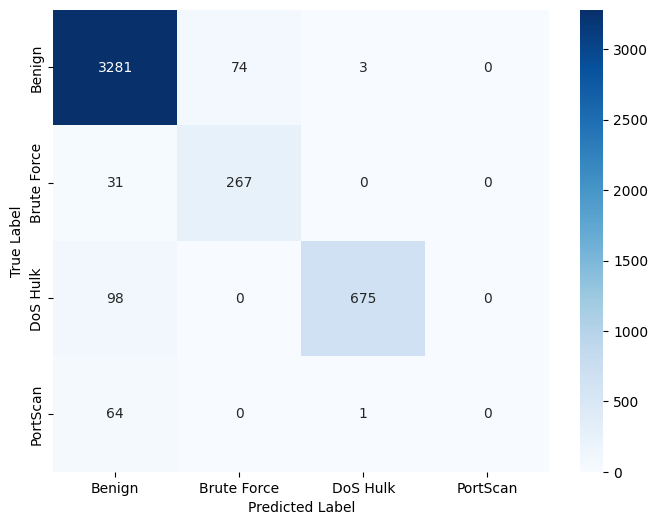

F1-score: 68.1478
Recall: 68.6566
Test Accuracy: 93.9697
Test Precision: 68.0386


In [ ]:
model = endsigmoidDeepFFNN(input_size, layer_sizes, output_size).to(device)
optimizer = optim.AdamW(model.parameters(), lr=0.0005)
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
print("Neurons per layer:", layer_sizes)
train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
val_accuracy, val_prec, _ = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')

# **Task 5: Overfitting and Regularization**

Baseline FFNN

In [ ]:
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

In [ ]:
class LastModel(nn.Module):
    def __init__(self, input_size, output_size):
        super(LastModel, self).__init__()
        self.model = nn.Sequential(
            nn.Linear(input_size, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Linear(128, 64),
            nn.ReLU(),
            nn.Linear(64, 32),
            nn.ReLU(),
            nn.Linear(32, 16),
            nn.ReLU(),
            nn.Linear(16, 16),
            nn.ReLU(),
            nn.Linear(16, output_size)  # No activation on output layer
        )

    def forward(self, x):
        return self.model(x)

Epoch 20/50, Train Loss: 0.1225, Val Loss: 0.1408
Epoch 40/50, Train Loss: 0.0902, Val Loss: 0.1057
Training took 20.9864 seconds to execute.


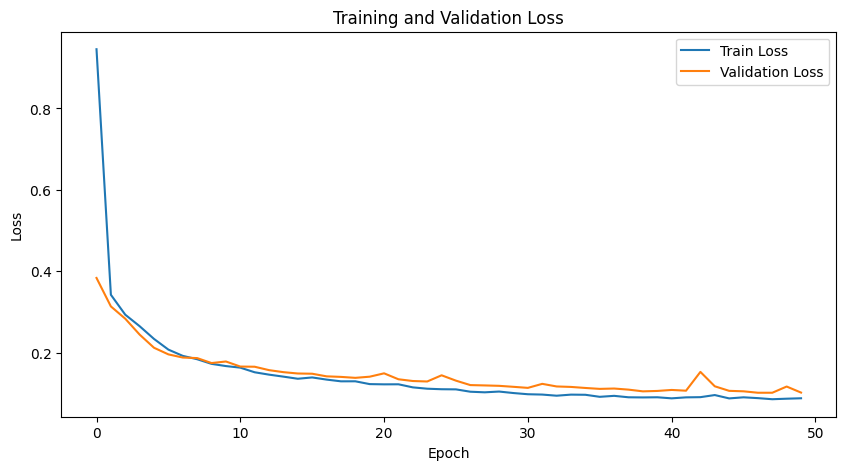

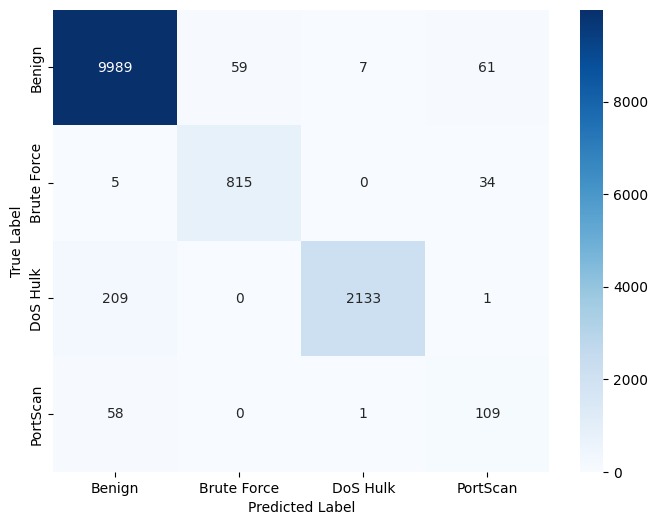

F1-score: 86.4885
Recall: 87.5240
Train Accuracy: 96.7732
Train Precision: 85.8489


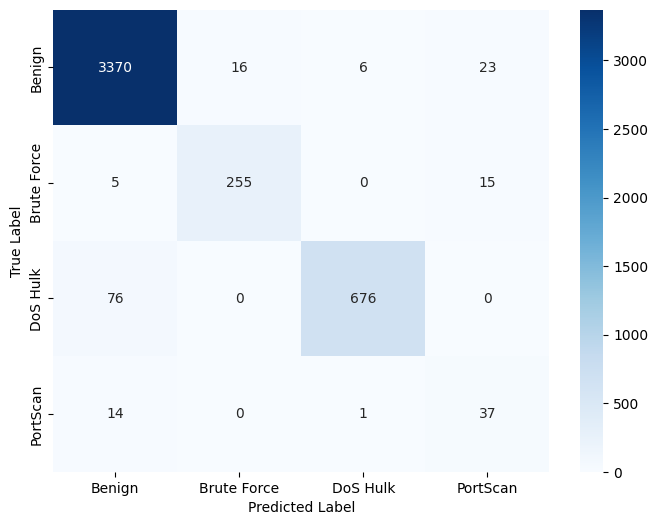

F1-score: 85.9639
Recall: 88.1143
Validation Accuracy: 96.5287
Validation Precision: 84.9157


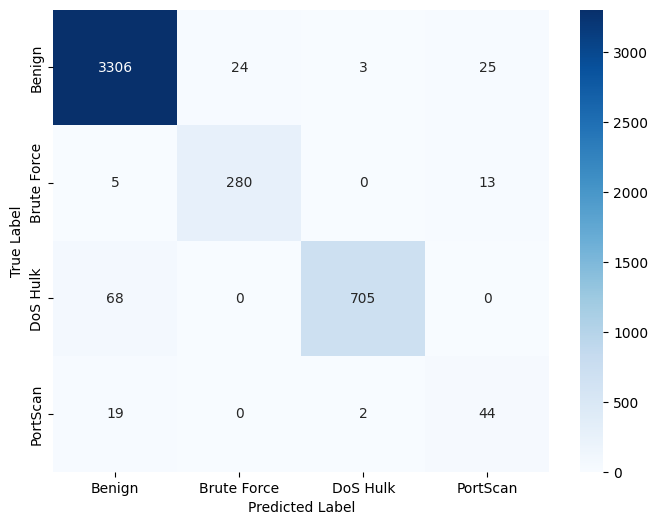

F1-score: 86.4583
Recall: 87.8267
Test Accuracy: 96.4619
Test Precision: 85.5880


In [ ]:
criterion = nn.CrossEntropyLoss()
epochs = 50

model = LastModel(input_size=15,  output_size=4).to(device)
optimizer = optim.AdamW(model.parameters(), lr=0.0005)
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, epochs, criterion)

train_accuracy,train_prec, _ = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
val_accuracy, val_prec, _ = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
test_accuracy, test_prec, _ = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')

adding dropout

In [ ]:
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=128, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=128, shuffle=False)

In [ ]:
class LastFFNN(nn.Module):
    def __init__(self, input_size, layer_sizes, output_size, use_batchnorm, dropout_rate):
        super(LastFFNN, self).__init__()
        layers = []

        # first hidden layer
        layers.append(nn.Linear(input_size, layer_sizes[0]))
        layers.append(nn.ReLU())

        # Hidden layers added
        for i in range(1, len(layer_sizes)):
            layers.append(nn.Linear(layer_sizes[i - 1], layer_sizes[i]))
            if use_batchnorm:
              layers.append(nn.BatchNorm1d(layer_sizes[i]))
            layers.append(nn.ReLU())
            if dropout_rate > 0.0:
              layers.append(nn.Dropout(dropout_rate))



        layers.append(nn.Linear(layer_sizes[-1], output_size)) #for the last layer we don't use a relu as activation function, since every output <0 will be seen as a 0 with a relu, so it's better to use the automatic softmax applied by pytorch

        self.model = nn.Sequential(*layers) #Create an ordered sequence of layers that are applied one after another to the input data.
                                            # model becomes the whole neural network

    def forward(self, x):
        return self.model(x)

In [ ]:
input_size = 15
layer_sizes = [256, 128, 64, 32, 16]
dropout_possible = [0.2, 0.3, 0.5]
use_batchnorm = False
output_size = 4

Epoch 20/50, Train Loss: 0.1324, Val Loss: 0.1371
Epoch 40/50, Train Loss: 0.1109, Val Loss: 0.1219
Training took 20.5519 seconds to execute.


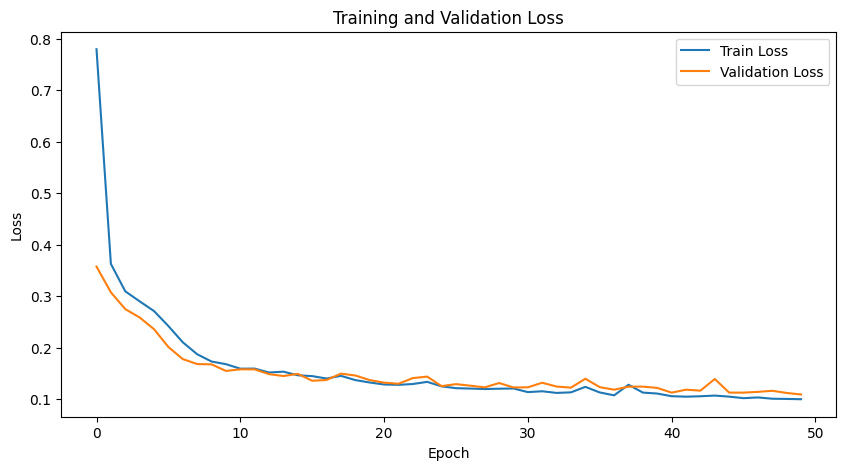

Dropout 0.2


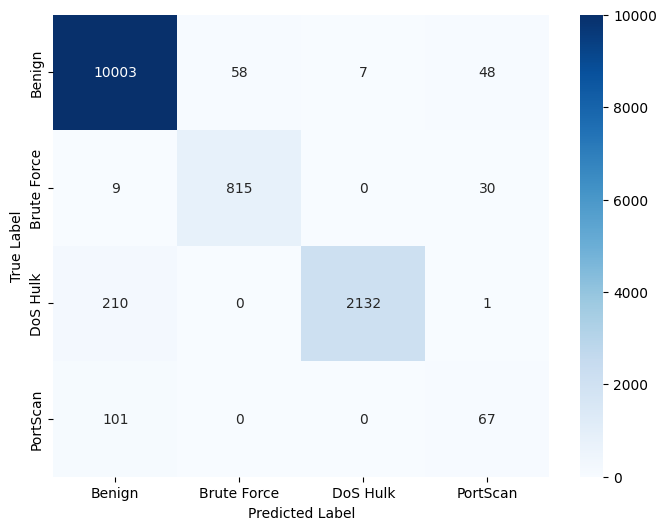

F1-score: 82.5190
Recall: 81.2979
Train Accuracy: 96.5581
Train Precision: 83.9549


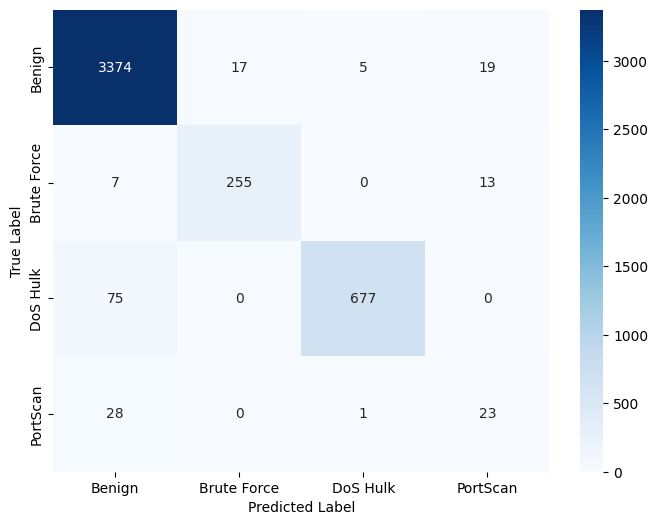

F1-score: 82.0983
Recall: 81.4460
Validation Accuracy: 96.3284
Validation Precision: 82.8831


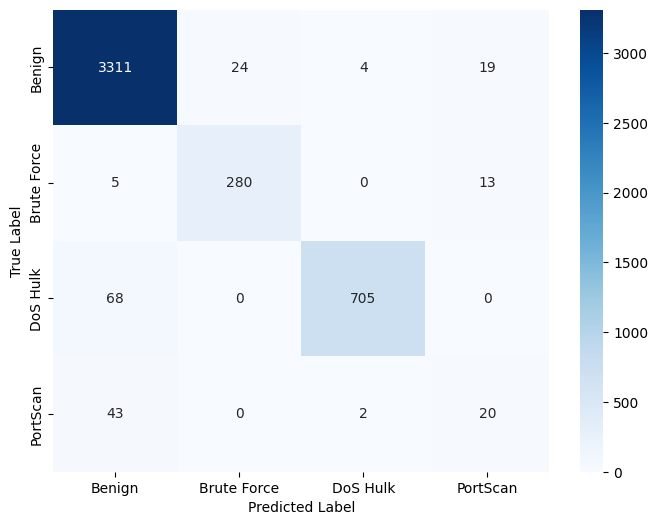

F1-score: 79.9556
Recall: 78.6331
Test Accuracy: 96.0392
Test Precision: 81.5845
Epoch 20/50, Train Loss: 0.1480, Val Loss: 0.1557
Epoch 40/50, Train Loss: 0.1182, Val Loss: 0.1245
Training took 19.8149 seconds to execute.


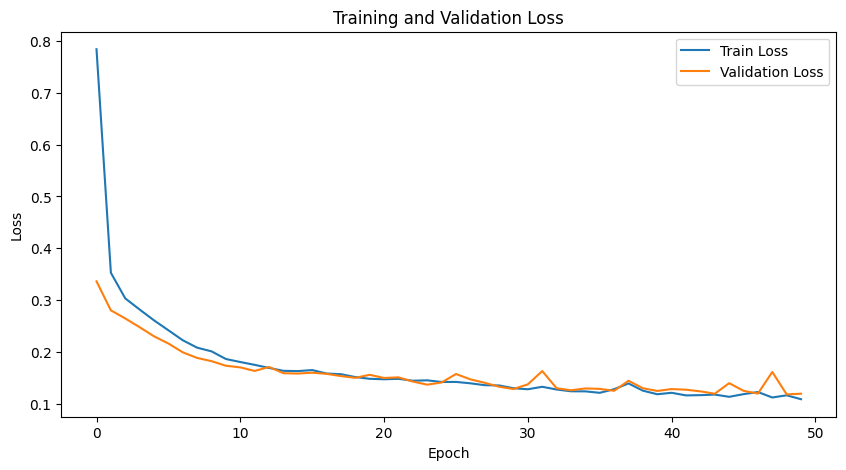

Dropout 0.3


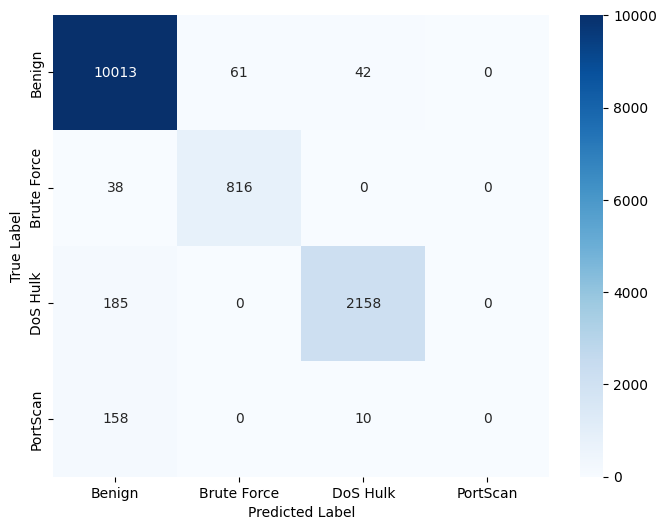

F1-score: 71.6789
Recall: 71.6591
Train Accuracy: 96.3356
Train Precision: 71.7565


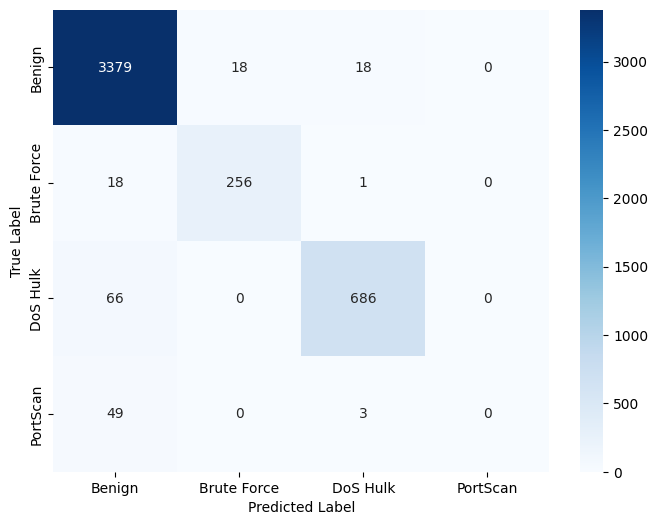

F1-score: 71.1983
Recall: 70.8150
Validation Accuracy: 96.1504
Validation Precision: 71.6341


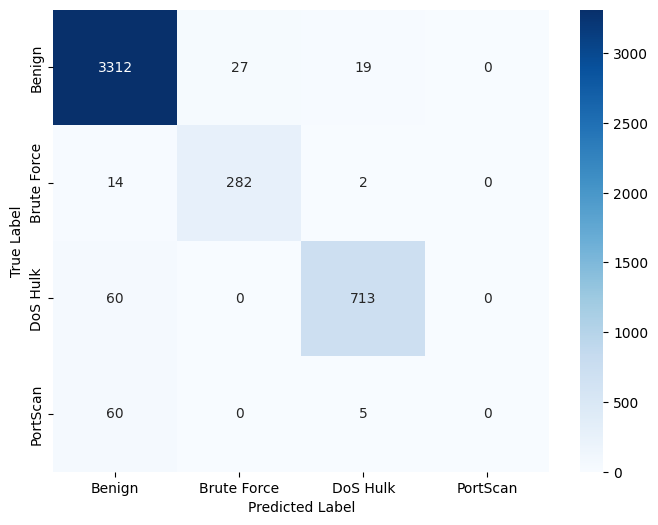

F1-score: 71.1457
Recall: 71.3748
Test Accuracy: 95.8389
Test Precision: 70.9638
Epoch 20/50, Train Loss: 0.2030, Val Loss: 0.1800
Epoch 40/50, Train Loss: 0.1566, Val Loss: 0.1367
Training took 20.5195 seconds to execute.


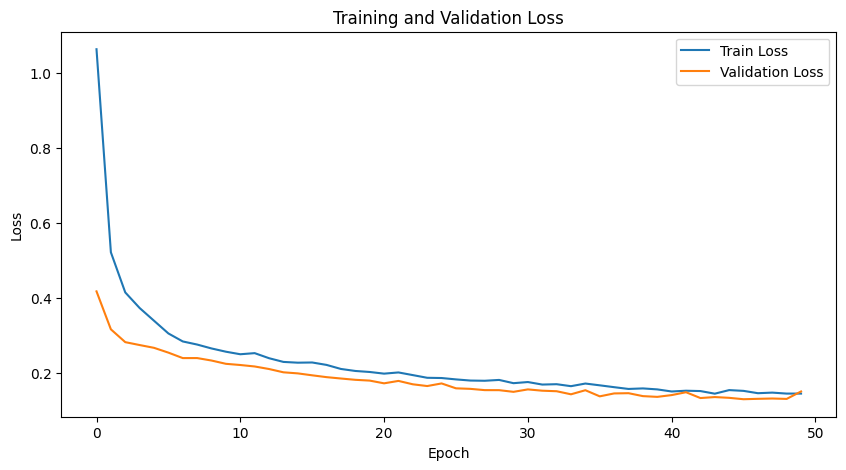

Dropout 0.5


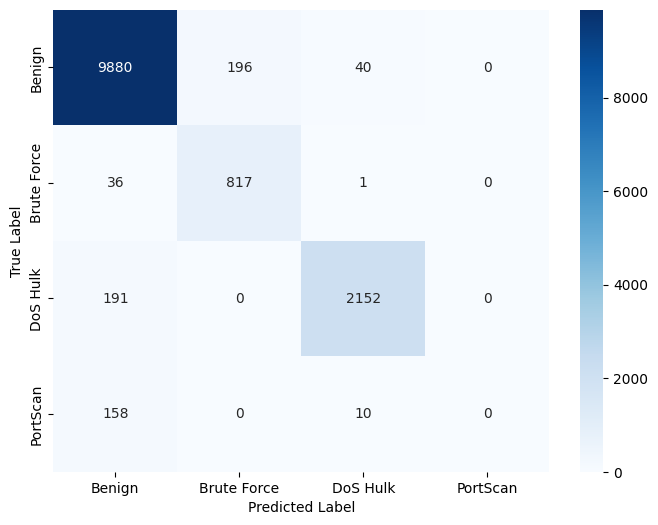

F1-score: 69.7874
Recall: 71.2956
Train Accuracy: 95.3119
Train Precision: 68.6465


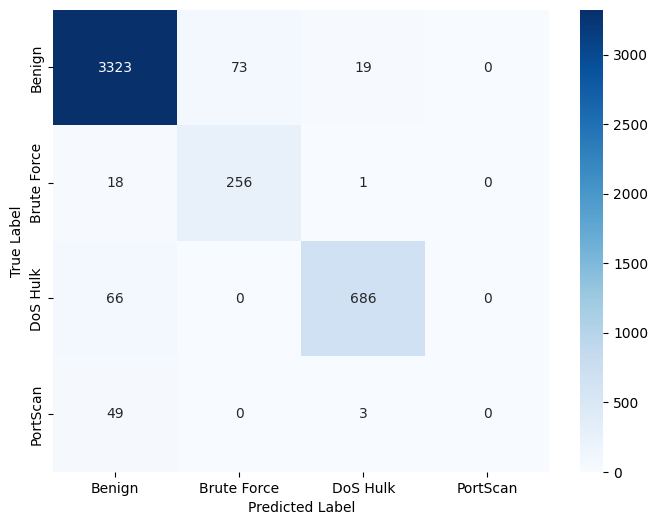

F1-score: 68.8505
Recall: 70.4051
Validation Accuracy: 94.9043
Validation Precision: 67.6798


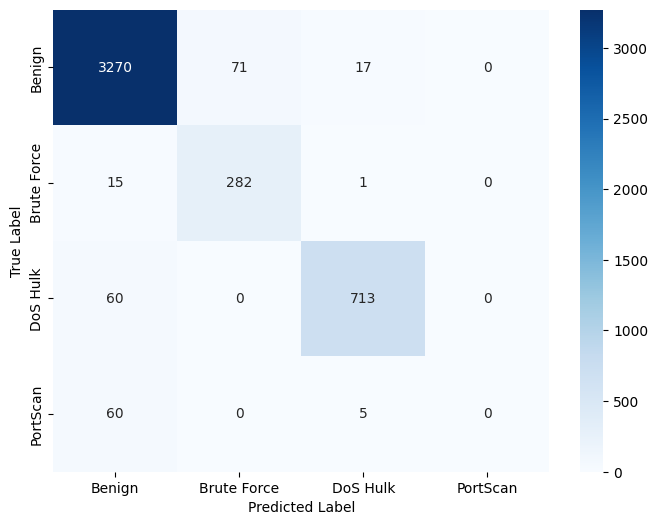

F1-score: 69.4596
Recall: 71.0621
Test Accuracy: 94.9043
Test Precision: 68.1992


In [ ]:
results = []
for i in range(len(dropout_possible)):
  performance = []

  model = LastFFNN(input_size, layer_sizes, output_size, use_batchnorm, dropout_possible[i]).to(device)
  optimizer = optim.AdamW(model.parameters(), lr=0.0005)
  training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
  print("Dropout", dropout_possible[i])
  train_accuracy,train_prec, train_f1 = testing_model(model,train_loader,device)
  print(f'Train Accuracy: {train_accuracy:.4f}')
  print(f'Train Precision: {train_prec:.4f}')
  val_accuracy, val_prec, val_f1 = testing_model(model,val_loader,device)
  print(f'Validation Accuracy: {val_accuracy:.4f}')
  print(f'Validation Precision: {val_prec:.4f}')
  test_accuracy, test_prec, test_f1 = testing_model(model,test_loader,device)
  print(f'Test Accuracy: {test_accuracy:.4f}')
  print(f'Test Precision: {test_prec:.4f}')
  performance.append(dropout_possible[i])
  performance.append(train_accuracy)
  performance.append(train_prec)
  performance.append(train_f1)
  performance.append(val_accuracy)
  performance.append(val_prec)
  performance.append(val_f1)
  performance.append(test_accuracy)
  performance.append(test_prec)
  performance.append(test_f1)
  results.append(performance)

In [ ]:
for i in range(len(dropout_possible)):
  print(f"[{i}]{results[i]}")

[0][0.2, 96.55811883391439, 83.95488100127295, 82.51902098141079, 96.32843791722297, 82.8831035103639, 82.09829092725245, 96.03916332888296, 81.58450875601362, 79.9556022369935]
[1][0.3, 96.33558341369334, 71.75648807821649, 71.67889474630958, 96.15042278593681, 71.63407408905198, 71.19833693245742, 95.83889630618603, 70.96382538470898, 71.1456617243273]
[2][0.5, 95.3119204806765, 68.64647406938934, 69.7874422511396, 94.9043168669337, 67.67979122014928, 68.85046535142463, 94.9043168669337, 68.1992319607892, 69.45956502739949]


apply batch norm only

In [ ]:
input_size = 15
layer_sizes = [256, 128, 64, 32, 16]
dropout_possible = 0.0
use_batchnorm = True
output_size = 4

Epoch 20/50, Train Loss: 0.1099, Val Loss: 0.1650
Epoch 40/50, Train Loss: 0.0877, Val Loss: 0.1177
Training took 23.2273 seconds to execute.


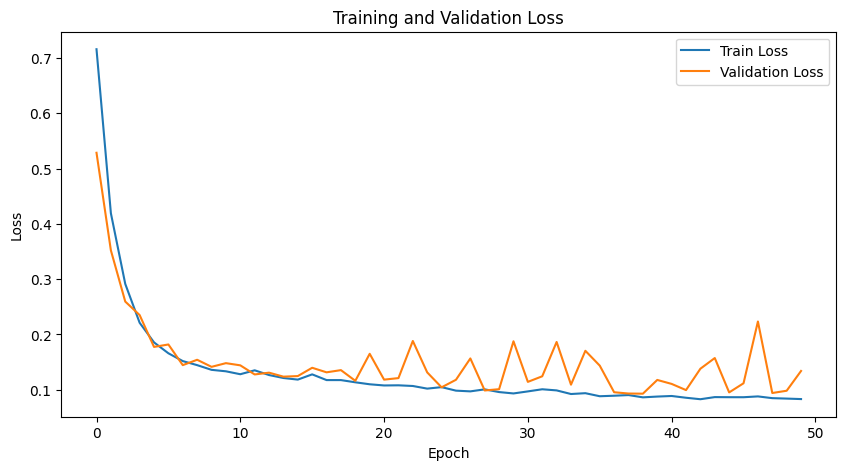

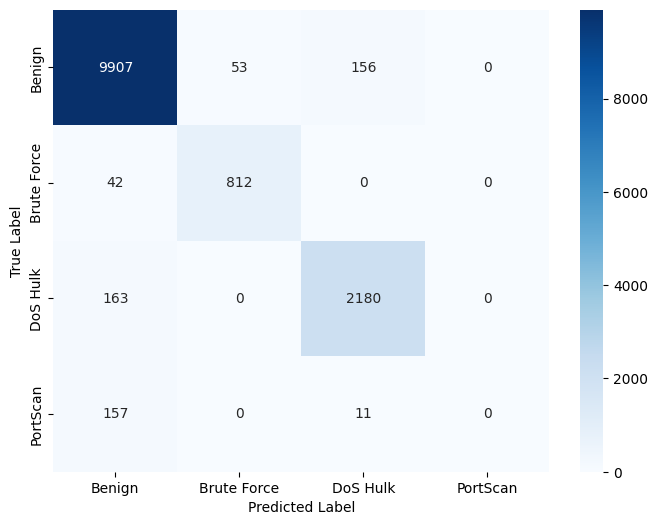

F1-score: 71.1591
Recall: 71.5148
Train Accuracy: 95.6828
Train Precision: 70.8080


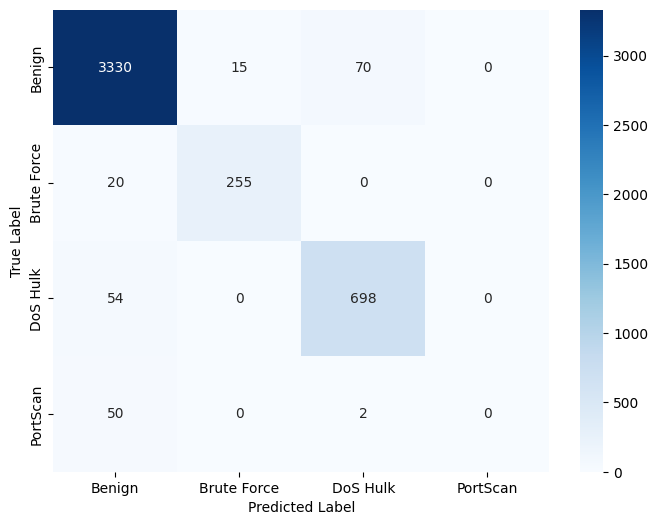

F1-score: 70.5642
Recall: 70.7644
Validation Accuracy: 95.3049
Validation Precision: 70.3759


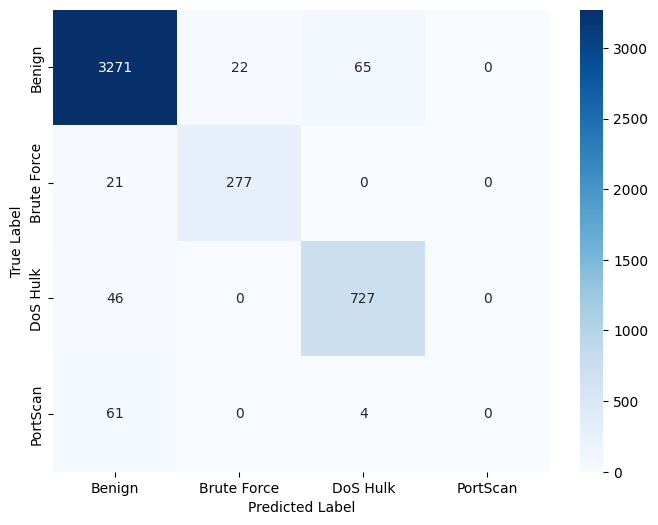

F1-score: 70.5715
Recall: 71.1028
Test Accuracy: 95.1268
Test Precision: 70.0520


In [ ]:
model = LastFFNN(input_size, layer_sizes, output_size, use_batchnorm, dropout_possible).to(device)
optimizer = optim.AdamW(model.parameters(), lr=0.0005)
training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
train_accuracy,train_prec, train_f1 = testing_model(model,train_loader,device)
print(f'Train Accuracy: {train_accuracy:.4f}')
print(f'Train Precision: {train_prec:.4f}')
val_accuracy, val_prec, val_f1 = testing_model(model,val_loader,device)
print(f'Validation Accuracy: {val_accuracy:.4f}')
print(f'Validation Precision: {val_prec:.4f}')
test_accuracy, test_prec, test_f1 = testing_model(model,test_loader,device)
print(f'Test Accuracy: {test_accuracy:.4f}')
print(f'Test Precision: {test_prec:.4f}')

apply weight decay only

In [ ]:
input_size = 15
layer_sizes = [256, 128, 64, 32, 16]
dropout_possible = 0.0
use_batchnorm = False
output_size = 4
weight_decay_possible = [1e-4, 1e-3, 1e-2]

Epoch 20/50, Train Loss: 0.1073, Val Loss: 0.1220
Epoch 40/50, Train Loss: 0.0883, Val Loss: 0.1066
Training took 23.4895 seconds to execute.


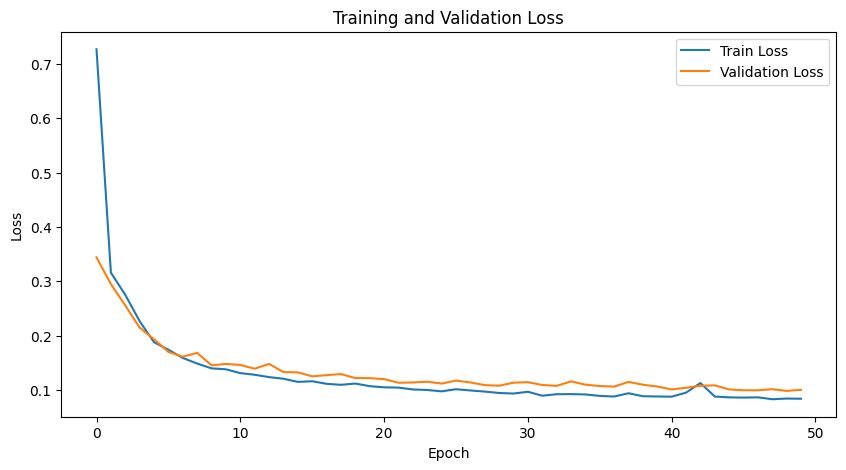

Weight decay 0.0001


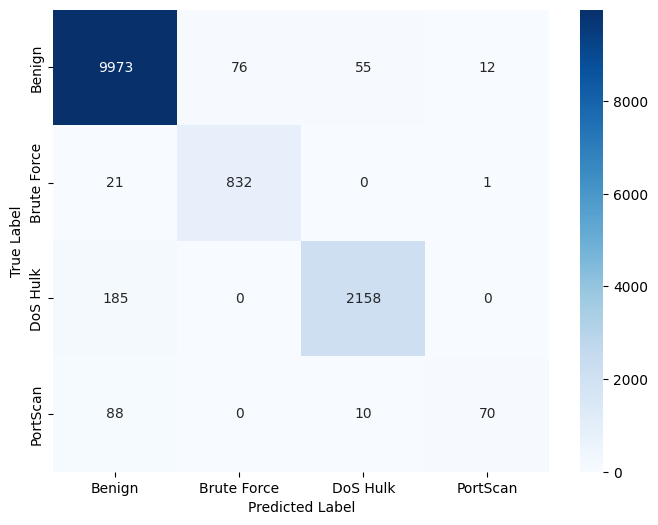

F1-score: 85.6490
Recall: 82.4453
Train Accuracy: 96.6768
Train Precision: 92.5449


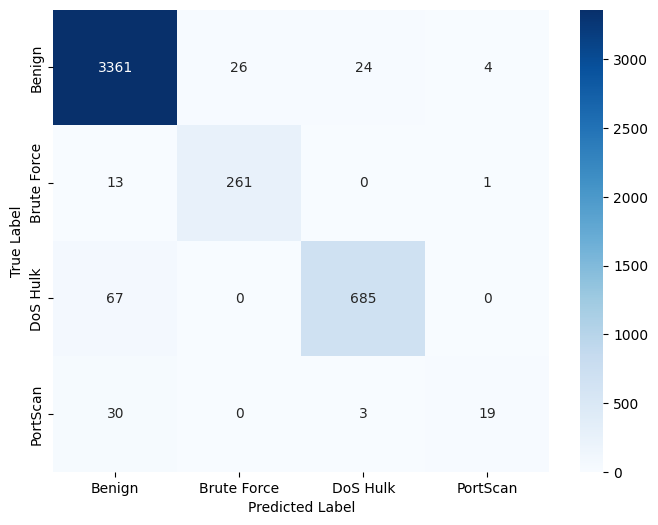

F1-score: 83.5200
Recall: 80.2392
Validation Accuracy: 96.2617
Validation Precision: 90.7865


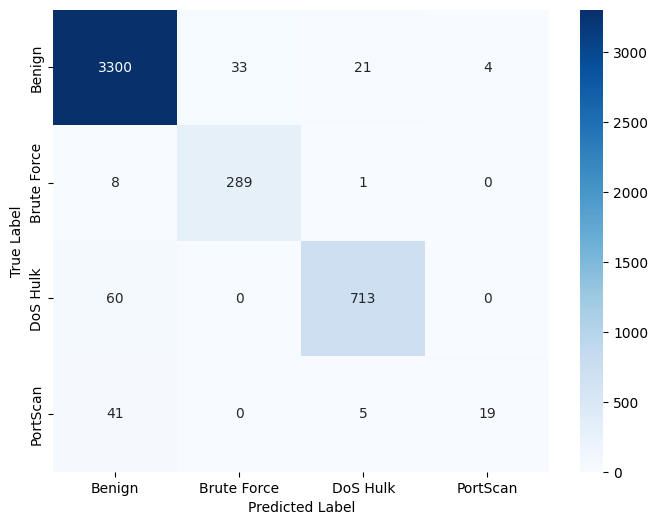

F1-score: 82.0474
Recall: 79.1804
Test Accuracy: 96.1504
Test Precision: 91.3785
Epoch 20/50, Train Loss: 0.1140, Val Loss: 0.1352
Epoch 40/50, Train Loss: 0.0917, Val Loss: 0.1041
Training took 18.9354 seconds to execute.


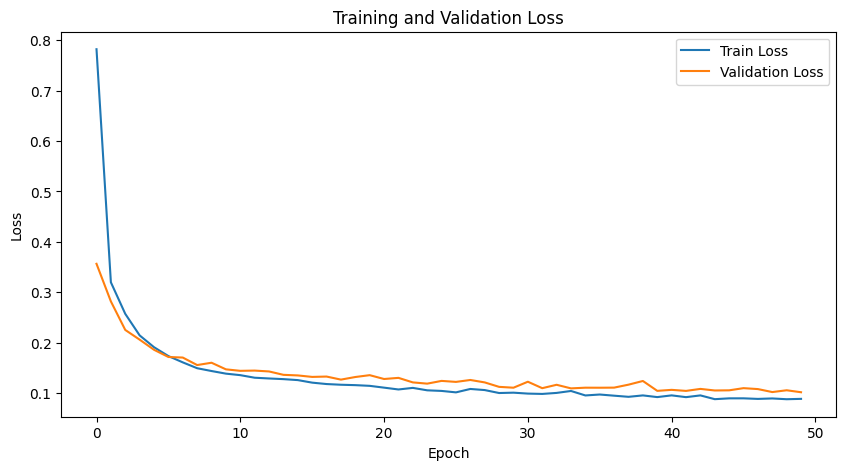

Weight decay 0.001


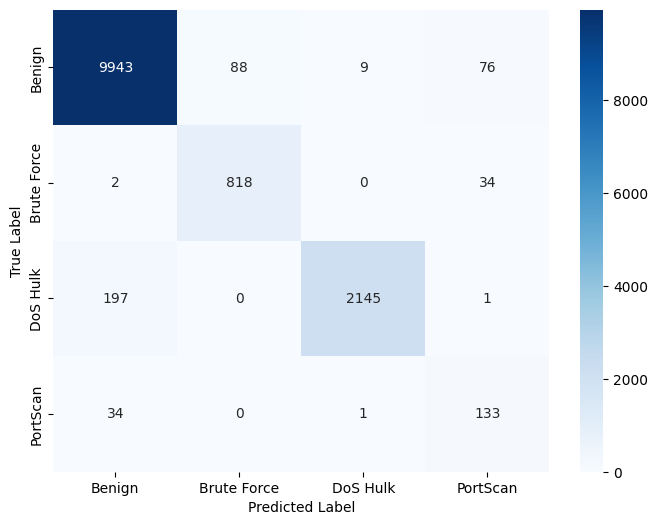

F1-score: 87.7231
Recall: 91.1976
Train Accuracy: 96.7213
Train Precision: 85.5104


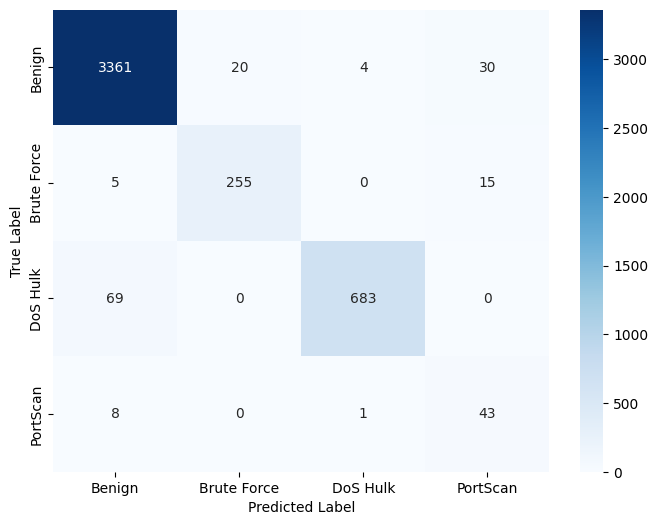

F1-score: 86.7585
Recall: 91.1657
Validation Accuracy: 96.6177
Validation Precision: 84.6206


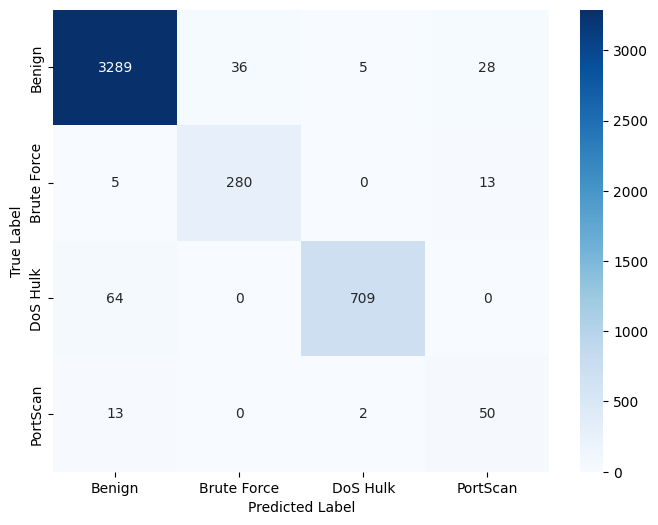

F1-score: 87.0739
Recall: 90.1371
Test Accuracy: 96.3062
Test Precision: 85.0356
Epoch 20/50, Train Loss: 0.1119, Val Loss: 0.1241
Epoch 40/50, Train Loss: 0.0925, Val Loss: 0.1087
Training took 19.7830 seconds to execute.


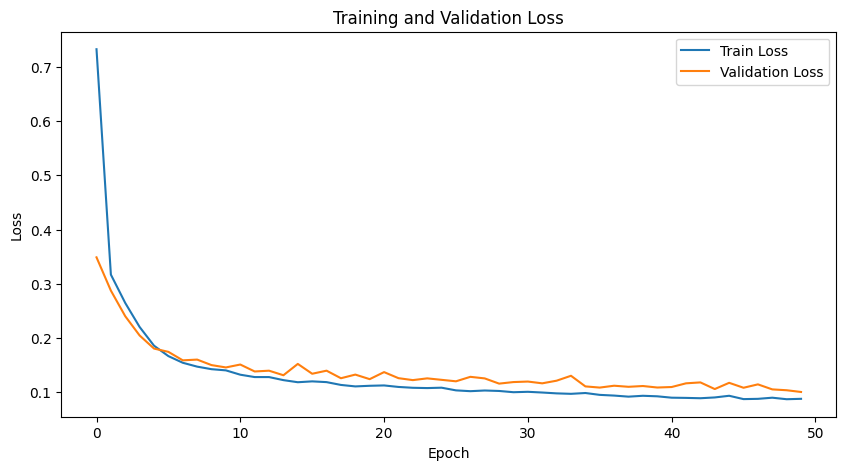

Weight decay 0.01


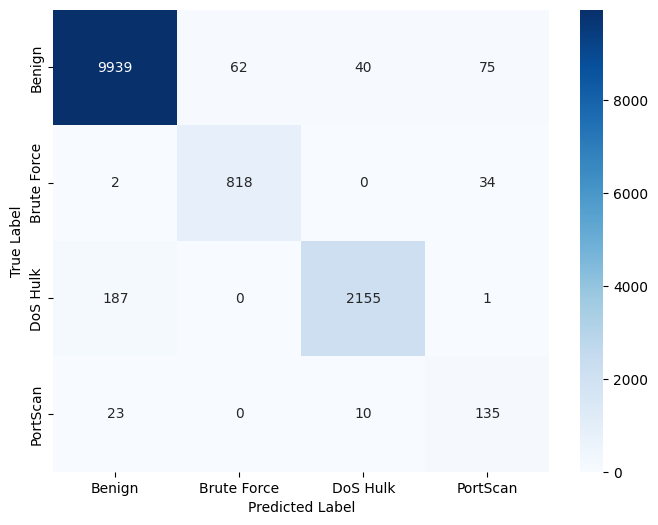

F1-score: 88.1428
Recall: 91.5920
Train Accuracy: 96.7807
Train Precision: 85.9251


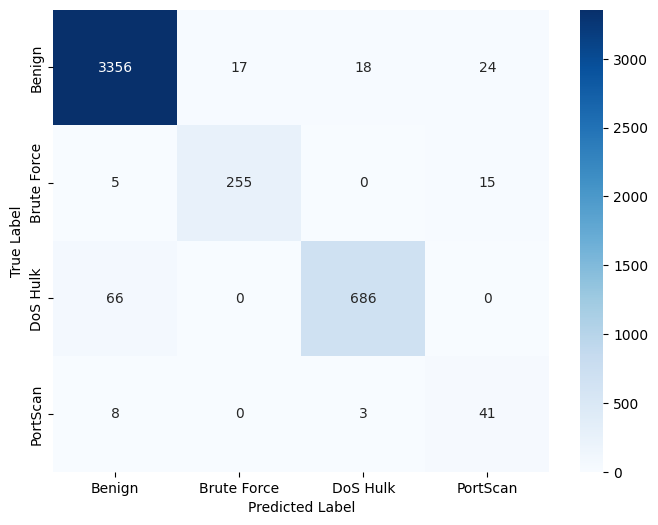

F1-score: 86.8449
Recall: 90.2673
Validation Accuracy: 96.5287
Validation Precision: 84.9325


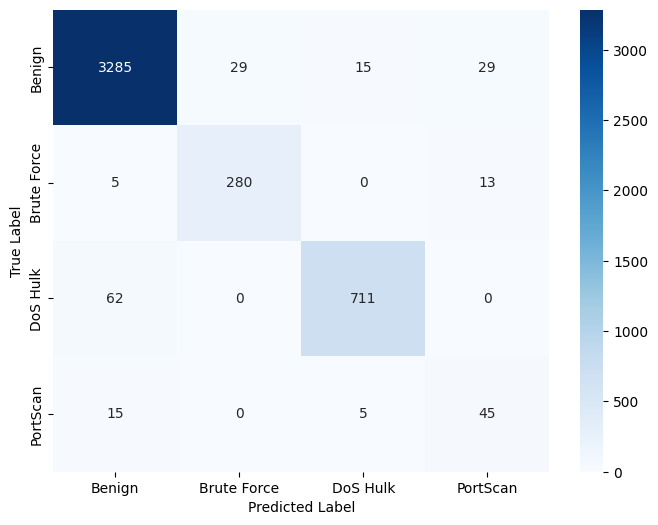

F1-score: 85.9276
Recall: 88.2490
Test Accuracy: 96.1504
Test Precision: 84.2919


In [ ]:
results = []
for i in range(len(weight_decay_possible)):
  performance = []

  model = LastFFNN(input_size, layer_sizes, output_size, use_batchnorm, dropout_possible).to(device)
  optimizer = optim.AdamW(model.parameters(), lr=0.0005, weight_decay=weight_decay_possible[i])
  training_loop(model, train_loader, val_loader, train_dataset, val_dataset, device, optimizer, num_epochs, criterion)
  print("Weight decay", weight_decay_possible[i])
  train_accuracy,train_prec, train_f1 = testing_model(model,train_loader,device)
  print(f'Train Accuracy: {train_accuracy:.4f}')
  print(f'Train Precision: {train_prec:.4f}')
  val_accuracy, val_prec, val_f1 = testing_model(model,val_loader,device)
  print(f'Validation Accuracy: {val_accuracy:.4f}')
  print(f'Validation Precision: {val_prec:.4f}')
  test_accuracy, test_prec, test_f1 = testing_model(model,test_loader,device)
  print(f'Test Accuracy: {test_accuracy:.4f}')
  print(f'Test Precision: {test_prec:.4f}')
  performance.append(weight_decay_possible[i])
  performance.append(train_accuracy)
  performance.append(train_prec)
  performance.append(train_f1)
  performance.append(val_accuracy)
  performance.append(val_prec)
  performance.append(val_f1)
  performance.append(test_accuracy)
  performance.append(test_prec)
  performance.append(test_f1)
  results.append(performance)

In [ ]:
for i in range(len(weight_decay_possible)):
  print(f"[{i}]{results[i]}")

[0][0.0001, 96.67680439136562, 92.54494633627286, 85.64895889134517, 96.26168224299066, 90.78654571426563, 83.52003833376685, 96.15042278593681, 91.37854530018177, 82.0474001681567]
[1][0.001, 96.72131147540983, 85.51035851447982, 87.7231465764851, 96.61771250556296, 84.62063024741808, 86.75846745482573, 96.3061860258122, 85.035620910736, 87.07386413204456]
[2][0.01, 96.78065425413544, 85.92513709600169, 88.14279610565526, 96.52870493991989, 84.93246213267615, 86.84486426068861, 96.15042278593681, 84.29191102871214, 85.9276418974767]
